## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "mass_smaller_30"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


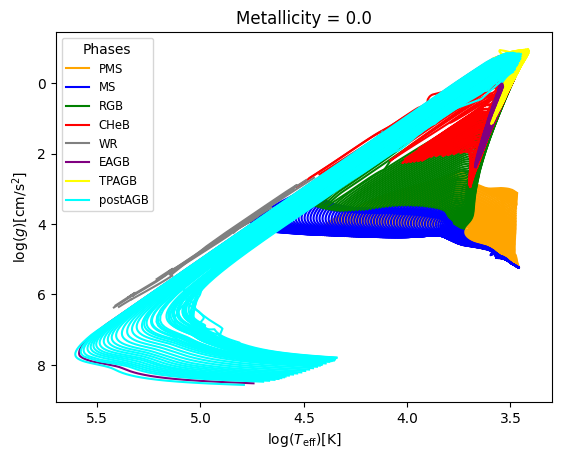

In [5]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

In [6]:
print_uniques("star_mass", iso_df)
# print_uniques_count("star_mass", iso_df)

star_mass : 1467117 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
633331,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
633332,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
633333,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
633334,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


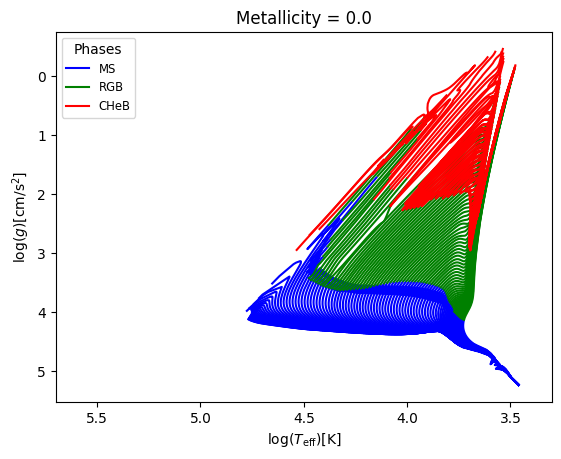

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_uniques("star_mass", phase_filtered_iso_df)
# print_uniques_count("star_mass", phase_filtered_iso_df)

star_mass : 633336 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
576729,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
576730,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
576731,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
576732,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


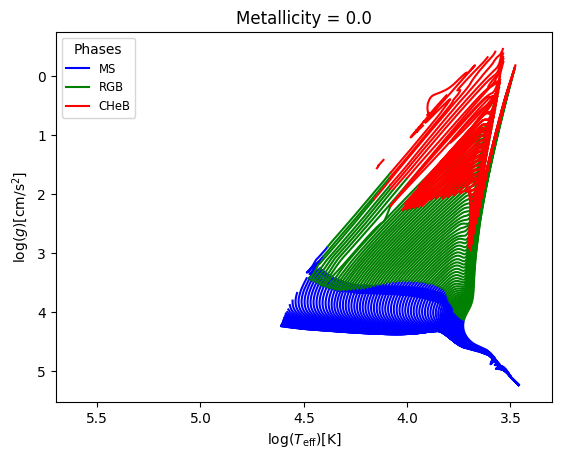

In [9]:
phase_mass_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3], "star_mass" : ("<", 30)})
display(phase_mass_filtered_iso_df)
data_visualiser_phase_age_filtered = Data_visualiser(phase_mass_filtered_iso_df, physical_model)
data_visualiser_phase_age_filtered.plot_Kiel([], [0.0])

In [10]:
print_all_uniques(phase_mass_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.2978, Median : 8.35

log_Teff  : Range : 3.34 - 5.3542, Mean : 3.9845, Median : 3.9191

log_g  : Range : -1.08 - 7.9405, Mean : 3.5437, Median : 3.9117

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 29.9991, Mean : 5.0208, Median : 2.4047

log_R  : Range : -1.86 - 3.1298, Mean : 0.6537, Median : 0.6118



In [11]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_mass_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.3446822240585243 - 5.35416869711927
Median value in train data for the log_Teff parameter: 3.9191440682311063
Mean value in train data for the log_Teff parameter: 3.984563483975519

Range in train data for the log_g parameter : -1.0828963170617296 - 7.94051322120885
Median value in train data for the log_g parameter: 3.9129915863509557
Mean value in train data for the log_g parameter: 3.544504274005861

Range in train data for the log_R parameter : -1.861069007171269 - 3.1297545143214007
Median value in train data for the log_R parameter: 0.6108380197271229
Mean value in train data for the log_R parameter: 0.6532150428232366

Testing set statistics:
Range in test data for the log_Teff parameter : 3.344668191350628 - 5.354118509825835
Median value in test data for the log_Teff parameter: 3.9191512969940128
Mean value in test data for the log_Teff parameter: 3.984295969579088

Range in test data for the log_g par

## Model training

### Linear regression

In [12]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_30 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.3446822240585243 - 4.898172986424315
  RVE :  0.7425147756339077
  RMSE :  0.16825258163023868
  MAE :  0.14112972726646883
  MedAE :  0.1389841258811515
  CORR :  0.8620301059418763
  MAX_ER :  0.7532479509237247
  Percentiles : 
    75th percentile :  0.1989106756726493
    90th percentile :  0.24128613834252075
    95th percentile :  0.26772842931764507
    99th percentile :  0.4373568822285768

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.6749789254031855
  RVE :  0.7732065556177962
  RMSE :  0.1389295721268746
  MAE :  0.10781012251699001
  MedAE :  0.09117468129725959
  CORR :  0.8804252842885175
  MAX_ER :  0.6943188309965977
  Percentiles : 
    75th percentile :  0.1455609922070491
    90th percentile :  0.2079334537438093
    95

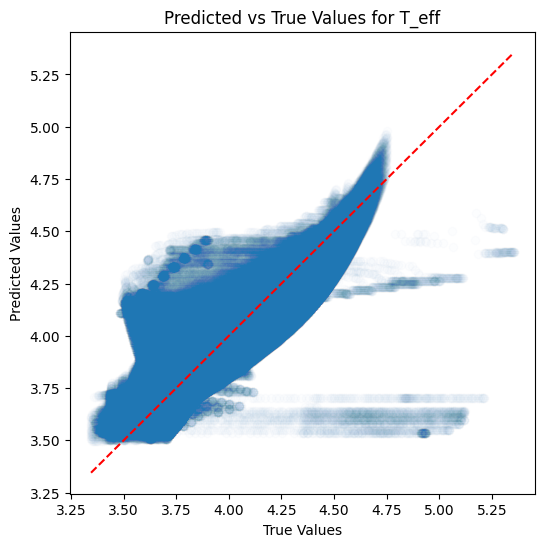

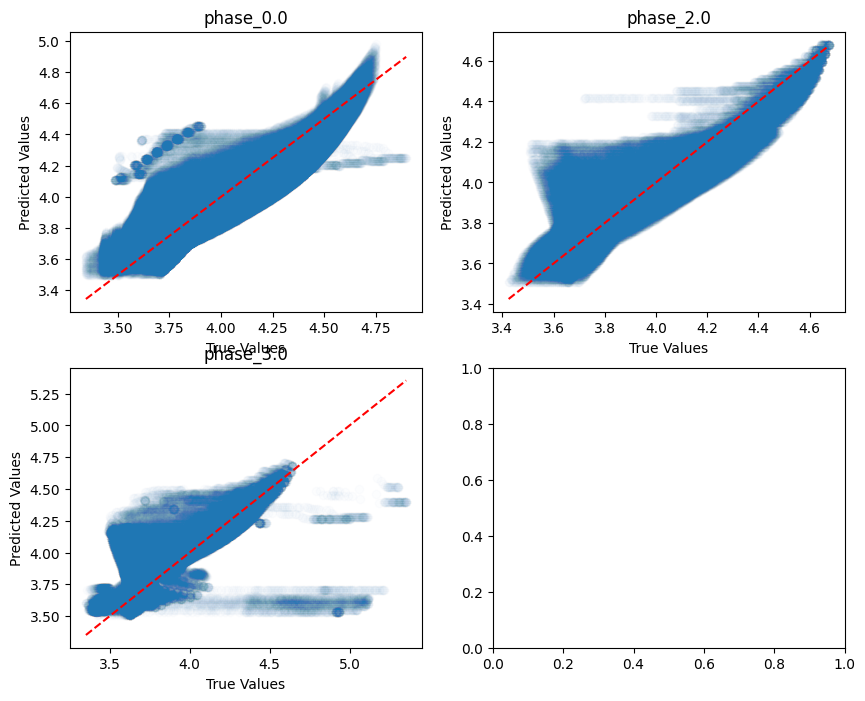

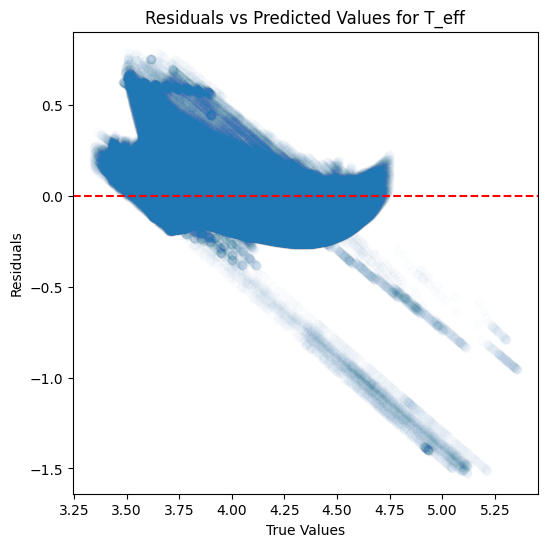

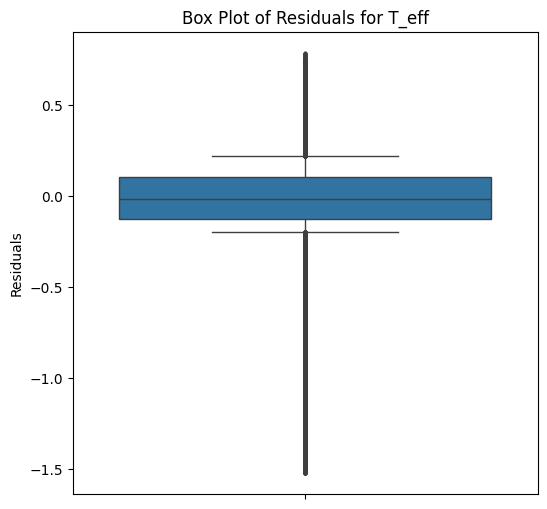

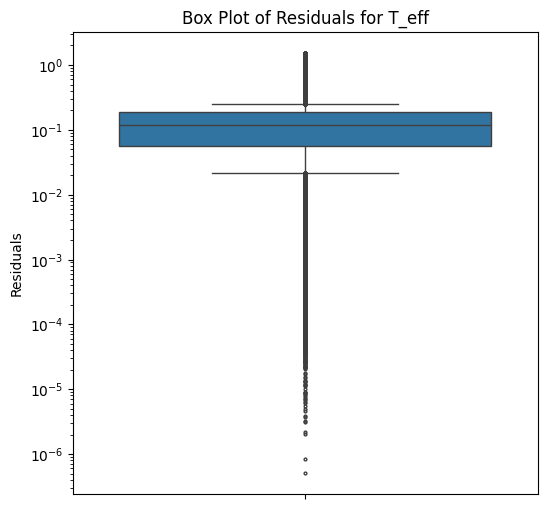

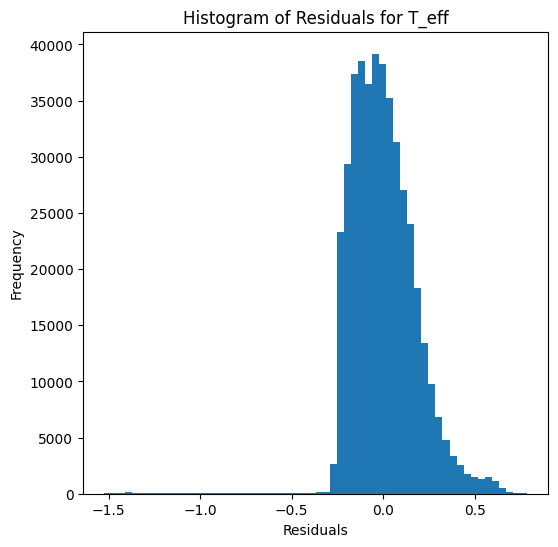

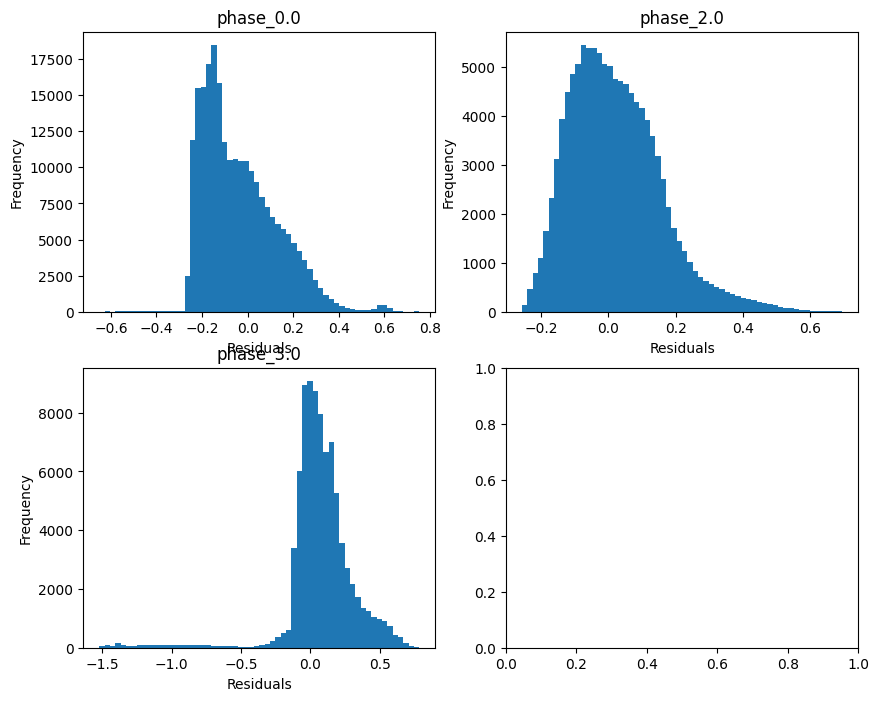

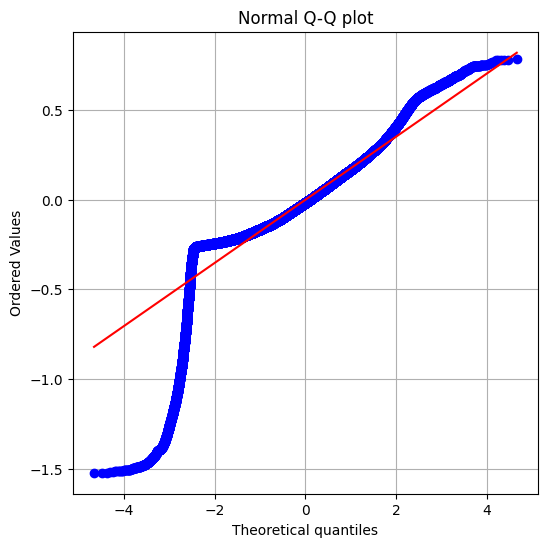

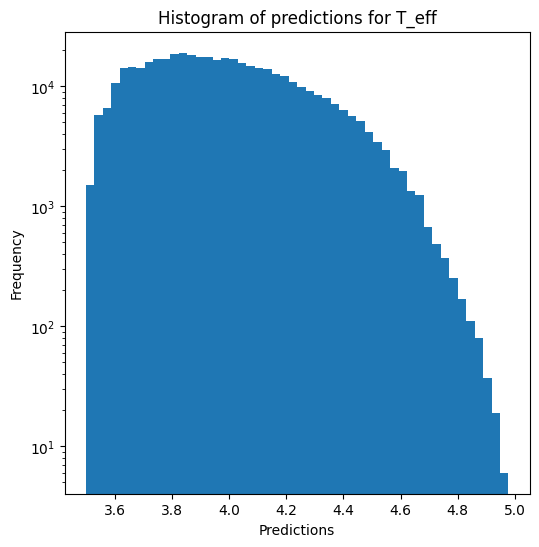

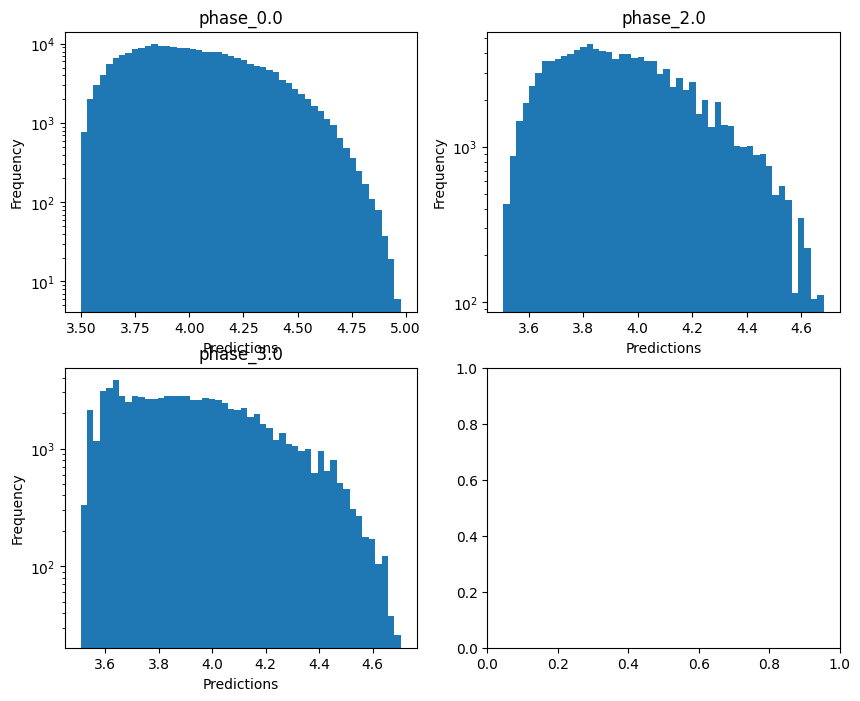

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -0.05940550091836361
  RMSE :  0.9414322142052257
  MAE :  0.7758963869945172
  MedAE :  0.6425156449850282
  CORR :  0.4479268147327694
  MAX_ER :  3.7566476053595177
  Percentiles : 
    75th percentile :  1.0967668683786345
    90th percentile :  1.5847733209941528
    95th percentile :  1.8116046570163922
    99th percentile :  2.1651783651072707

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.11733123386474609
  RMSE :  1.0794976772142086
  MAE :  0.8401397045660437
  MedAE :  0.6641674159459126
  CORR :  0.36115799768645923
  MAX_ER :  3.1562277312268754
  Percentiles : 
    75th percentile :  1.2496232503017337
    90th percentile :  1.895413073326581
    95th percentile :  2.237642106672302
    99th percentile :  2.6182597789108444

log_g results for the phase

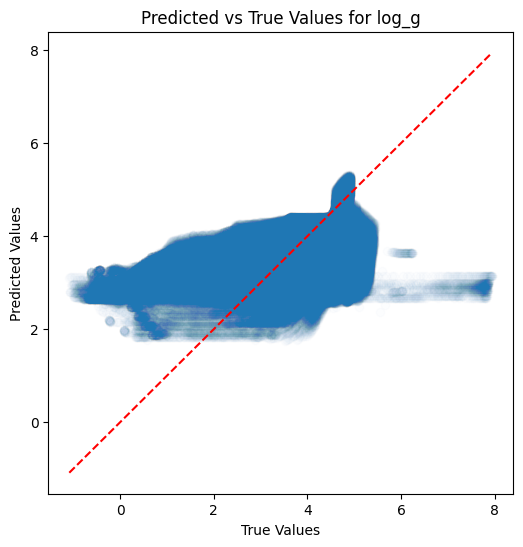

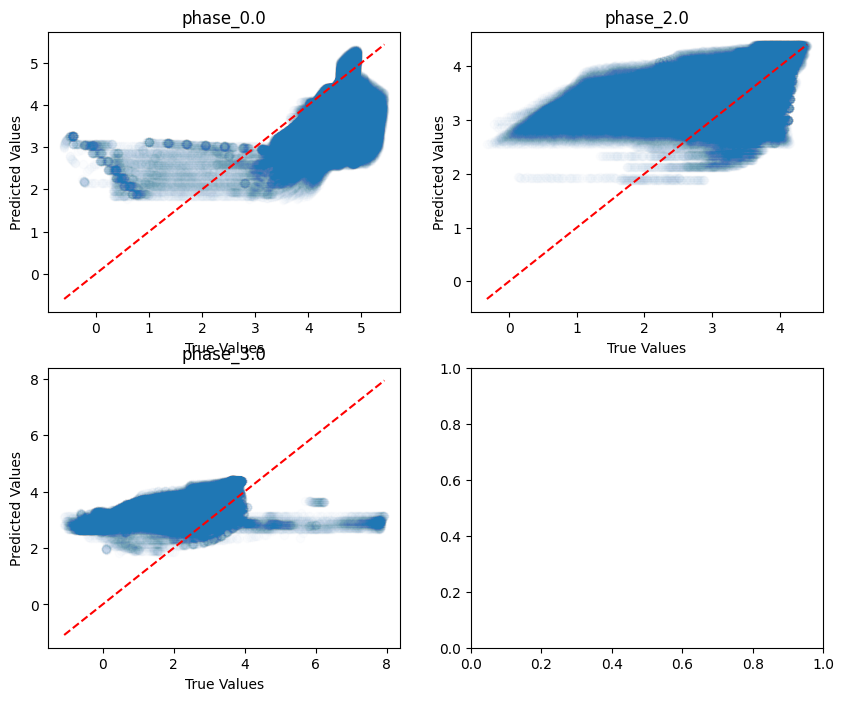

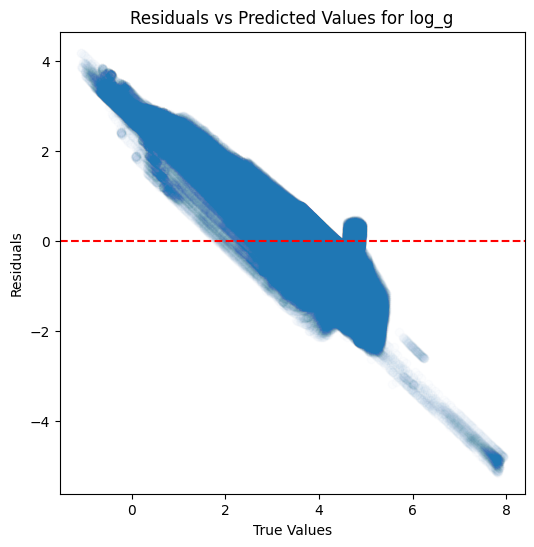

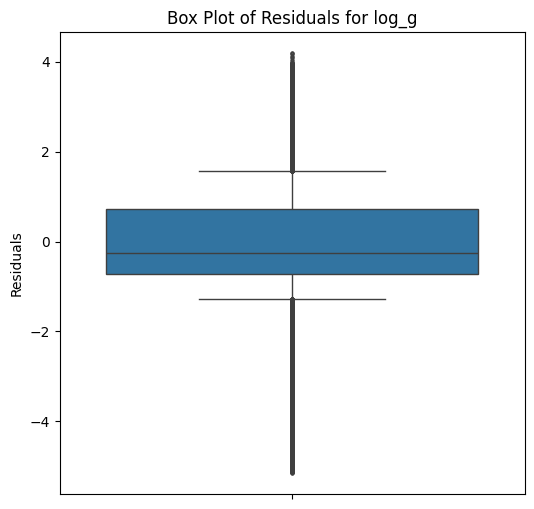

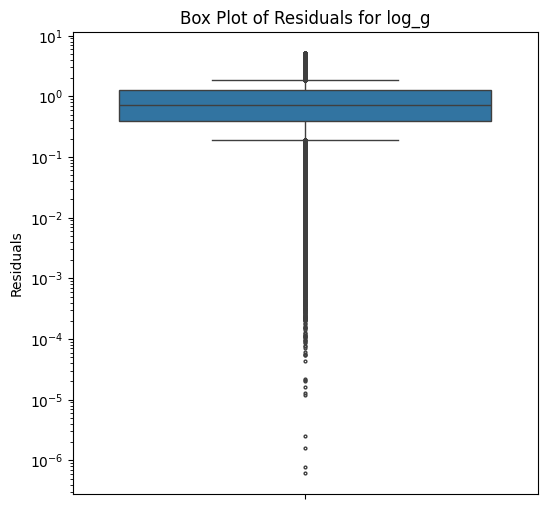

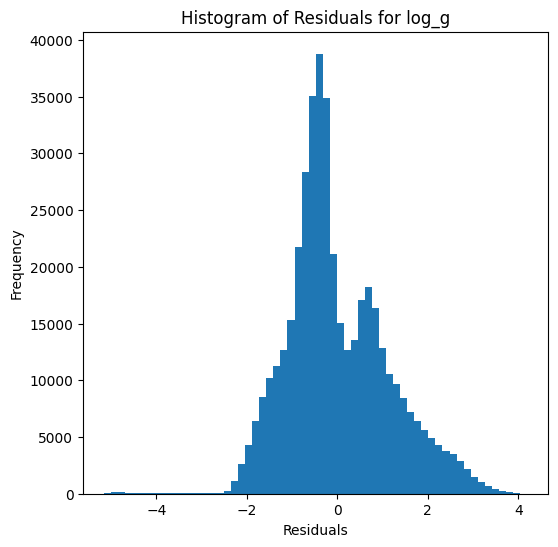

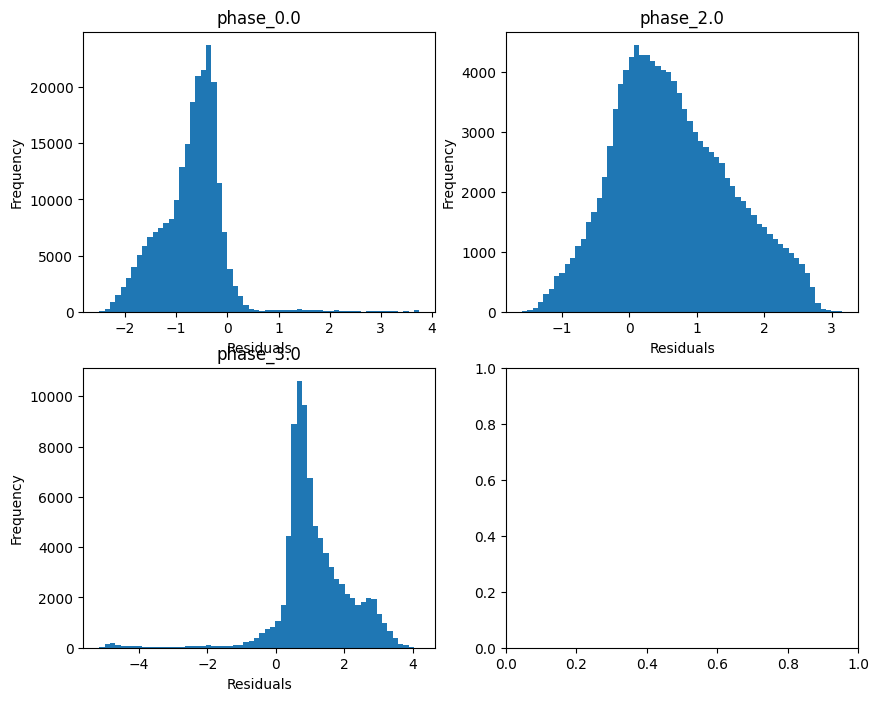

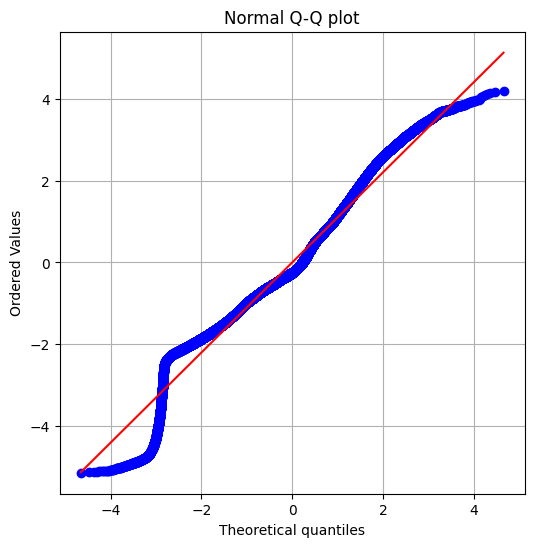

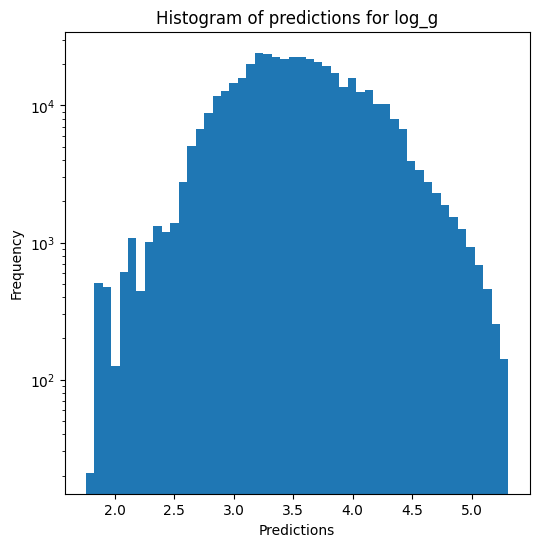

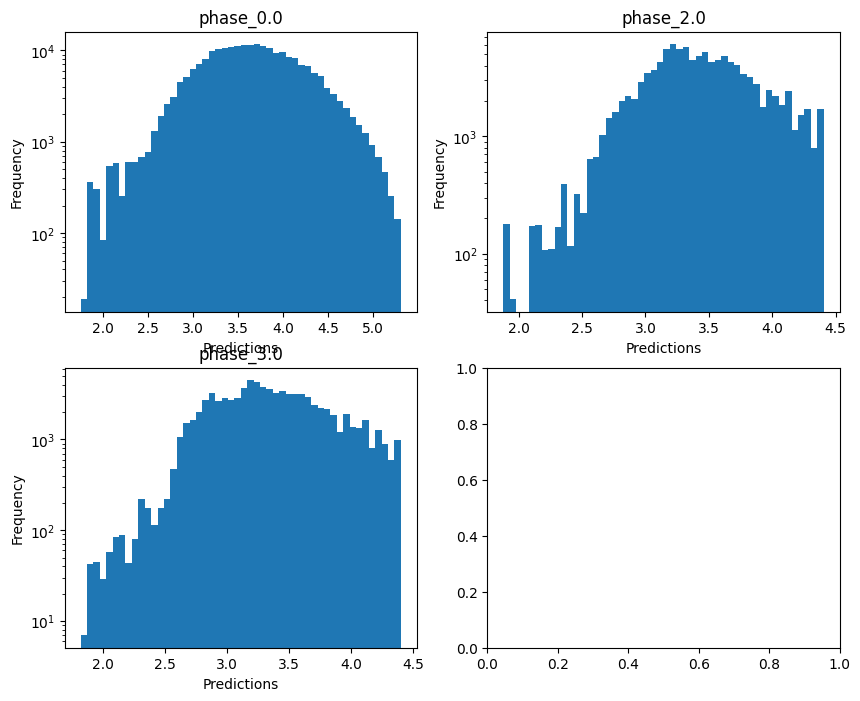


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.44999373224099104
  RMSE :  0.5558294751278842
  MAE :  0.4354803367480269
  MedAE :  0.33246350557488785
  CORR :  0.6728152449937493
  MAX_ER :  1.9144262313425746
  Percentiles : 
    75th percentile :  0.6466781162430855
    90th percentile :  0.9589734732503425
    95th percentile :  1.1419674512115248
    99th percentile :  1.4079744521548172

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.03629033710019092
  RMSE :  0.5882964271859707
  MAE :  0.471786109084191
  MedAE :  0.39770169753923024
  CORR :  0.38419592695019655
  MAX_ER :  1.6247227193399518
  Percentiles : 
    75th percentile :  0.697332609731018
    90th percentile :  1.009825646256897
    95th percentile :  1.1722363493089898
    99th percentile :  1.3519477488410152

radius results for the phase category with a 

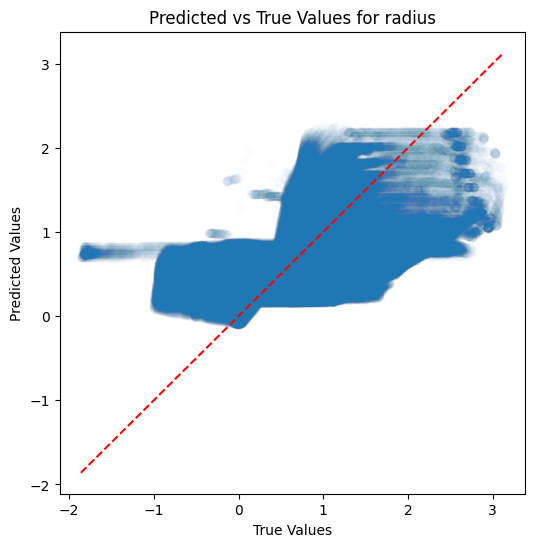

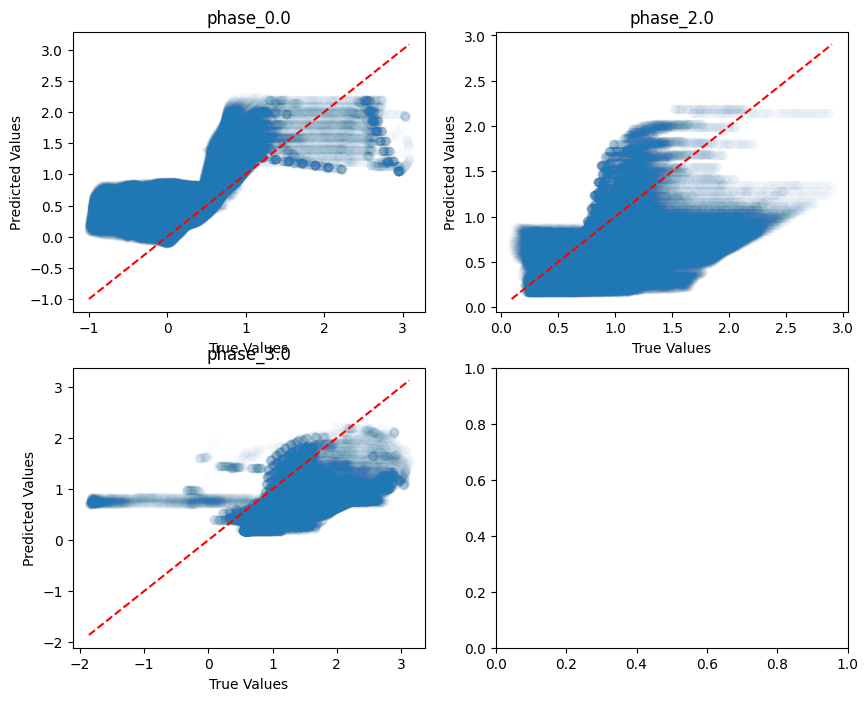

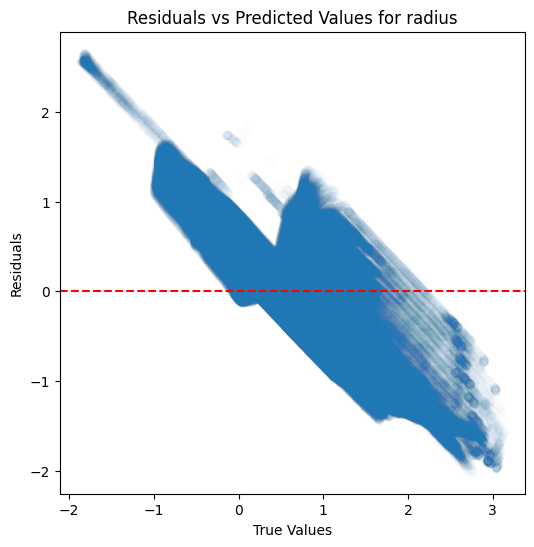

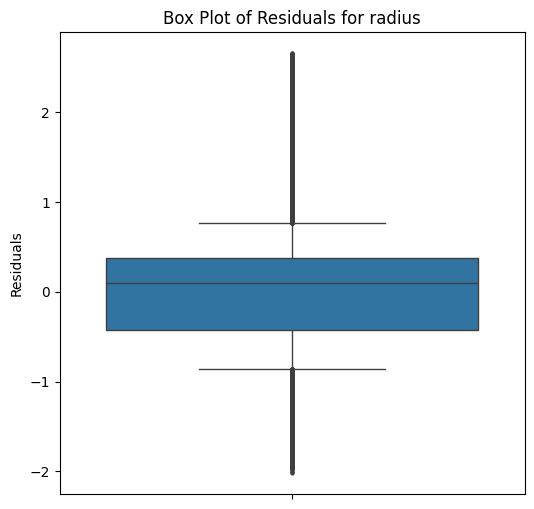

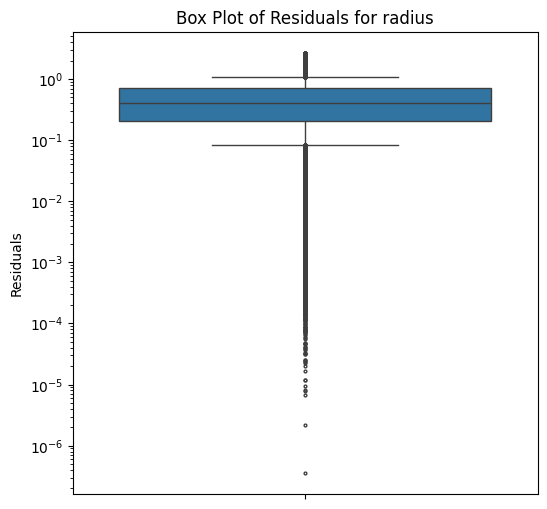

...

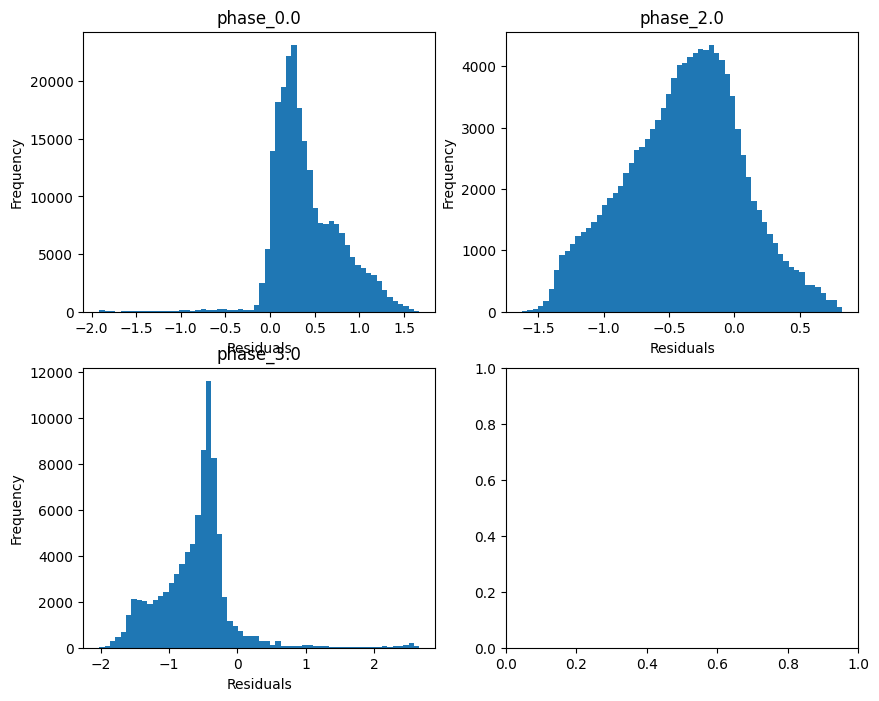

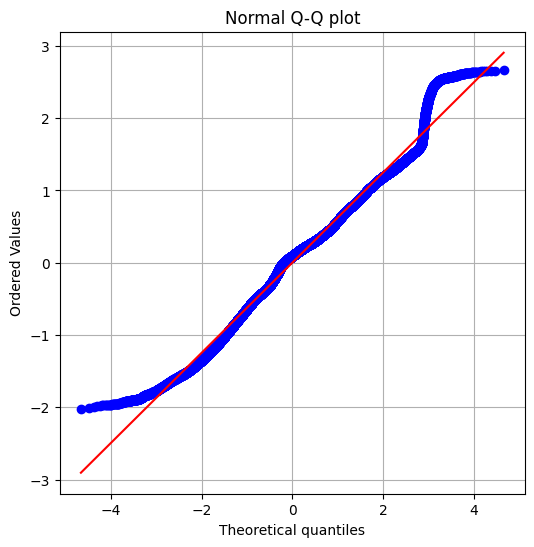

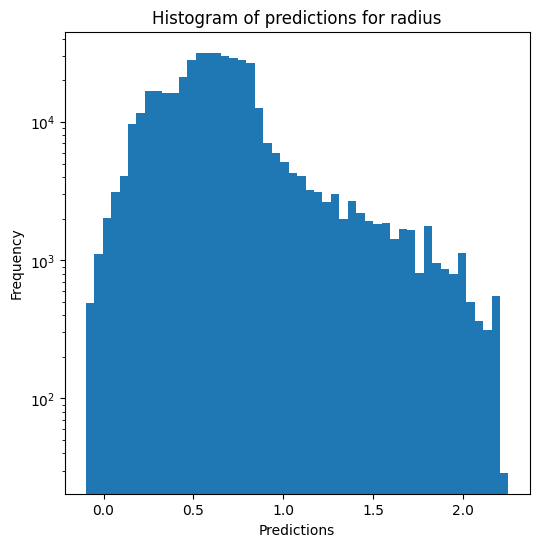

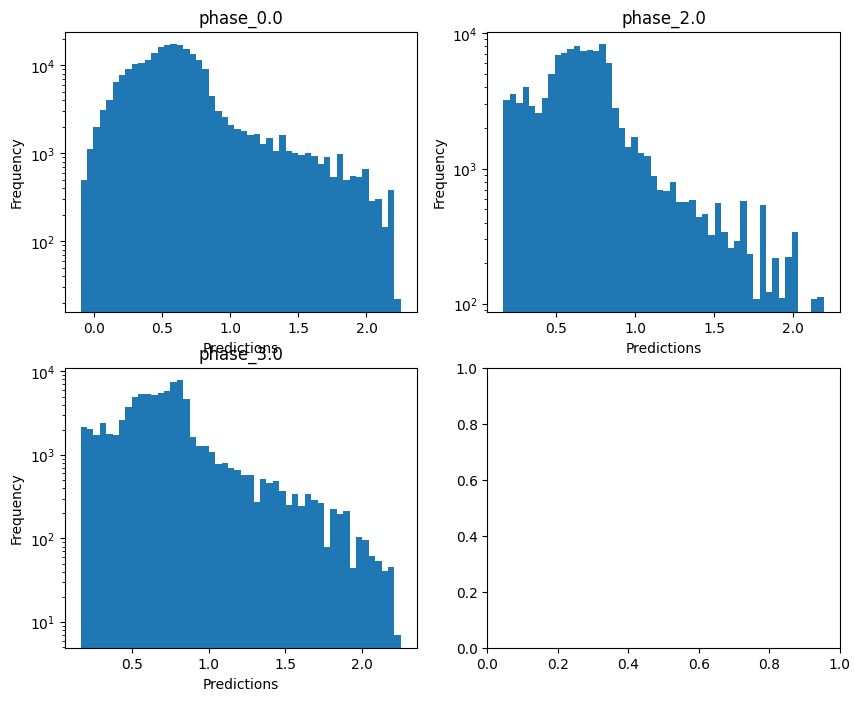

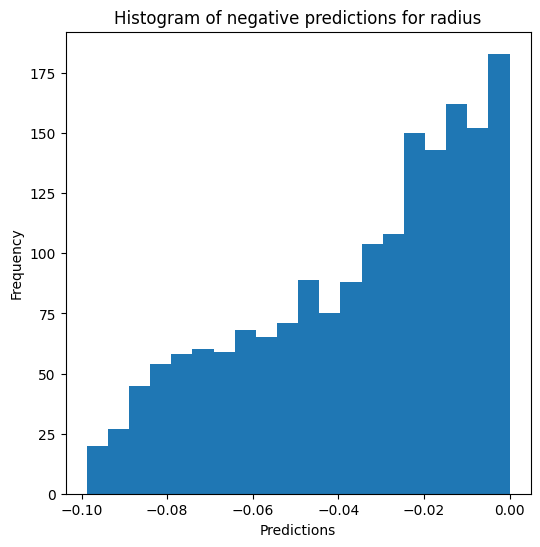

Saving predictions and results...


In [13]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True) # override=False, use_preds=True

### Decision tree

In [14]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_30 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.3446822240585243 - 4.898172986424315
  RVE :  0.956746386593217
  RMSE :  0.0675068542935522
  MAE :  0.010354538120687377
  MedAE :  0.0010718419237680799
  CORR :  0.9786369754547256
  MAX_ER :  1.609889479060282
  Percentiles : 
    75th percentile :  0.0023561335793691462
    90th percentile :  0.004275260624061878
    95th percentile :  0.009558218716277662
    99th percentile :  0.28767073962087497

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.6749789254031855
  RVE :  0.9513723549184312
  RMSE :  0.06351625105824157
  MAE :  0.02478266653580968
  MedAE :  0.0034098211456108363
  CORR :  0.9755698467205466
  MAX_ER :  0.864869785313644
  Percentiles : 
    75th percentile :  0.009964485696221548
    90th percentile :  0.087214031703

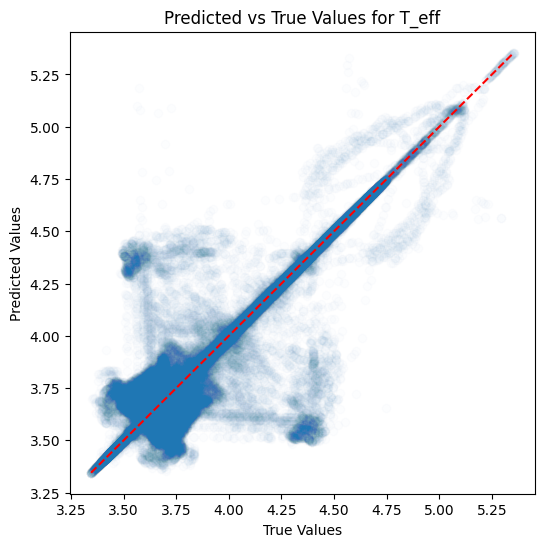

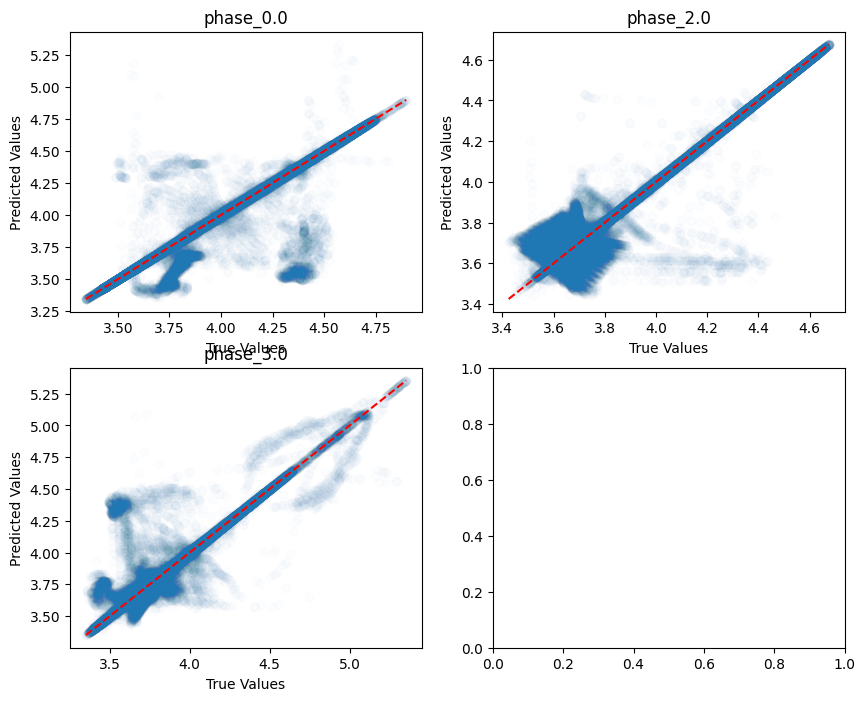

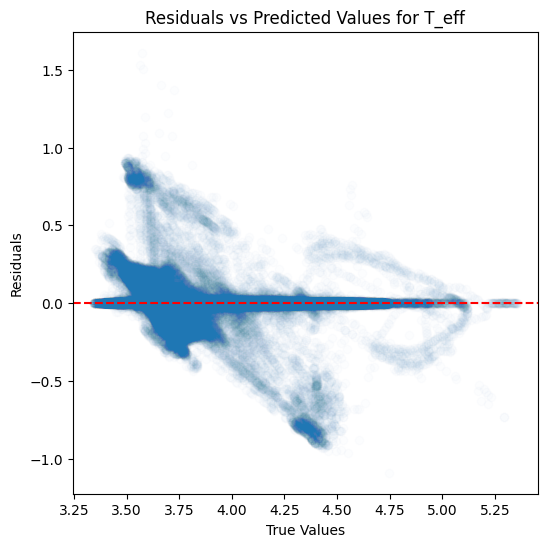

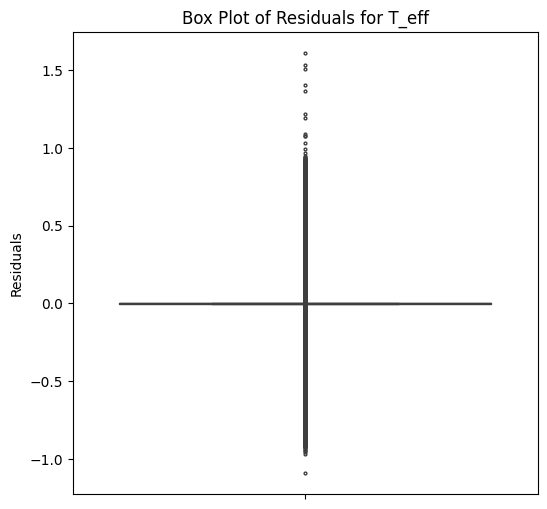

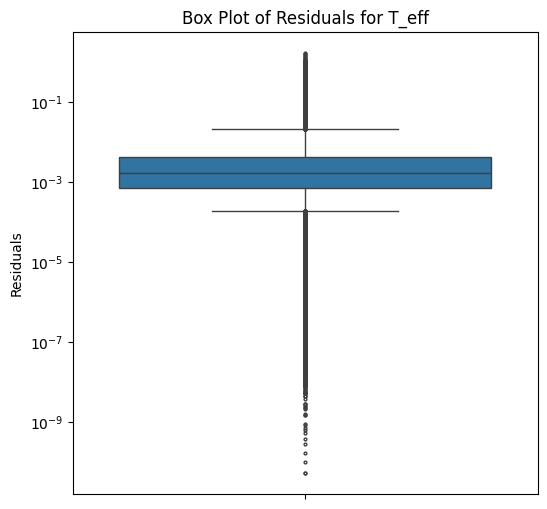

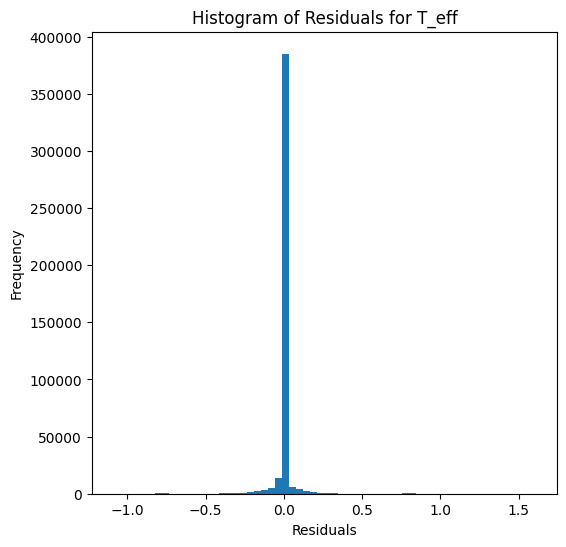

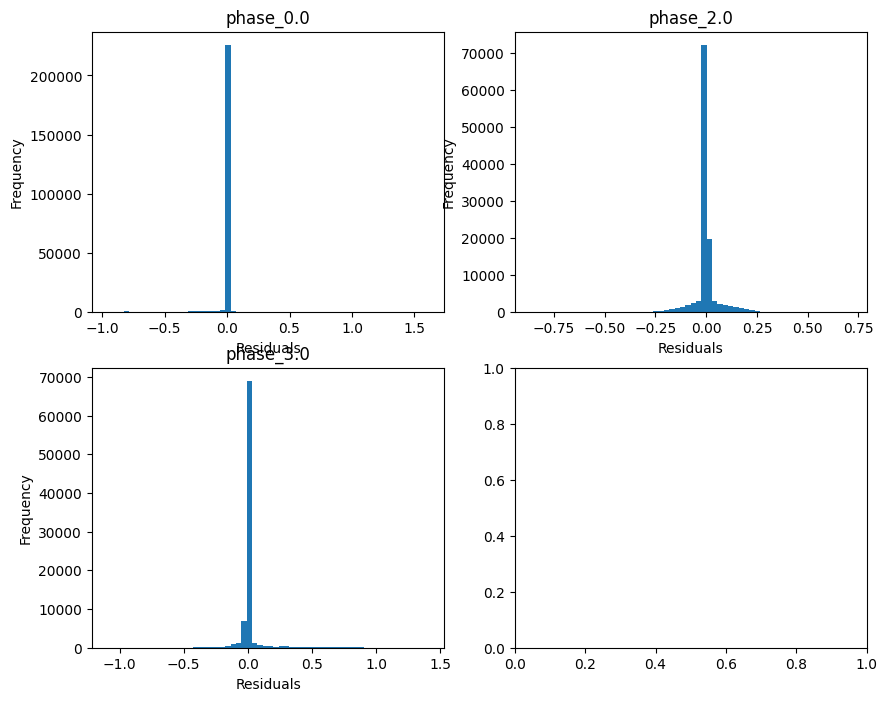

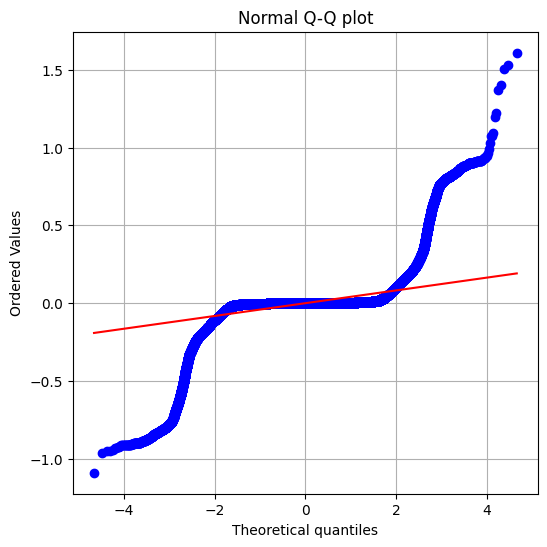

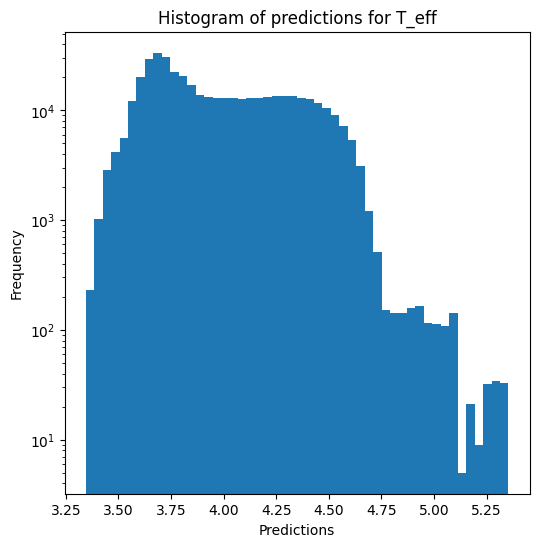

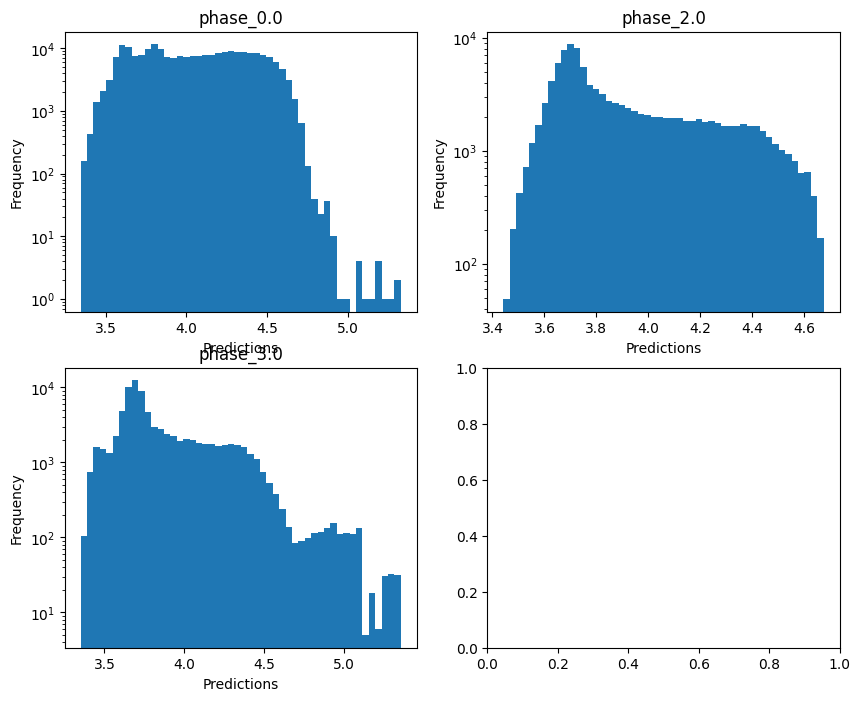


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.36863498711275056
  RMSE :  0.47126839210515936
  MAE :  0.0715310100312586
  MedAE :  0.0038416366677134217
  CORR :  0.7854963831802952
  MAX_ER :  5.681742527263148
  Percentiles : 
    75th percentile :  0.007669149758836369
    90th percentile :  0.014404684856924374
    95th percentile :  0.027878467397546187
    99th percentile :  3.230491705326655

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.03918803644433144
  RMSE :  0.9040146053021884
  MAE :  0.38499251095660125
  MedAE :  0.01684696253707263
  CORR :  0.5177057061678253
  MAX_ER :  4.637418133429539
  Percentiles : 
    75th percentile :  0.0971118599073778
    90th percentile :  1.6417531492122348
    95th percentile :  2.4452930288646577
    99th percentile :  3.503731011109012

log_g results for the phase category w

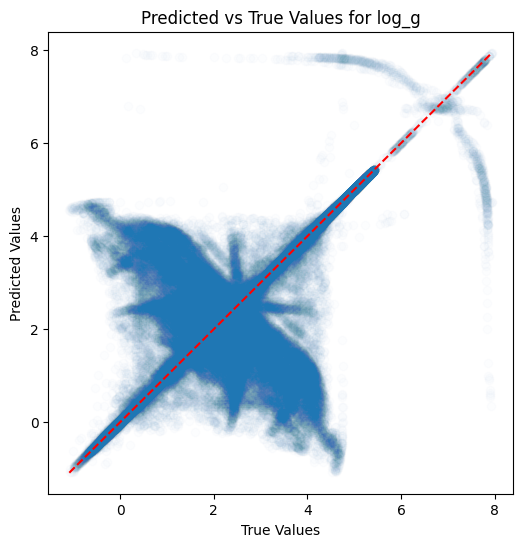

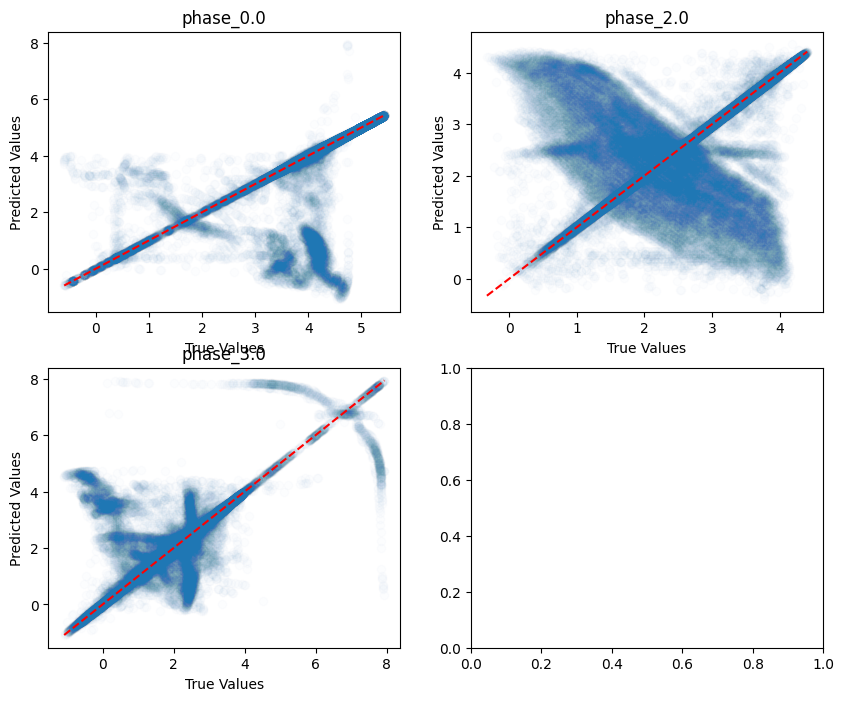

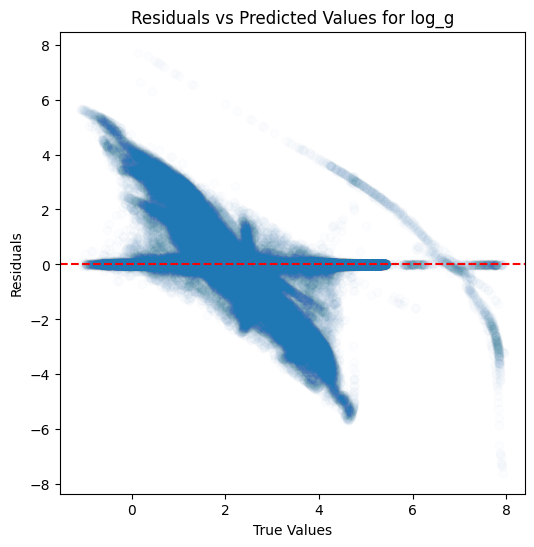

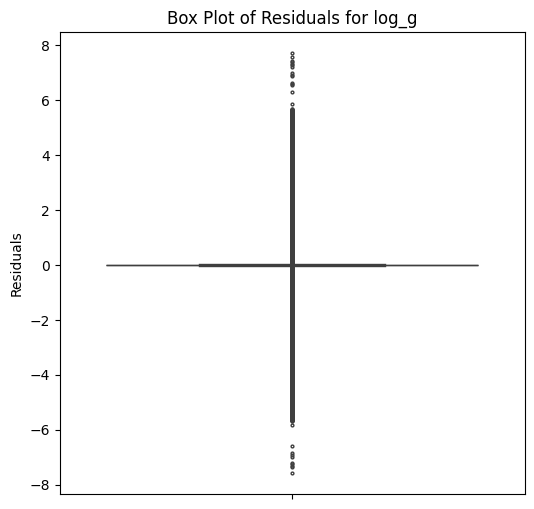

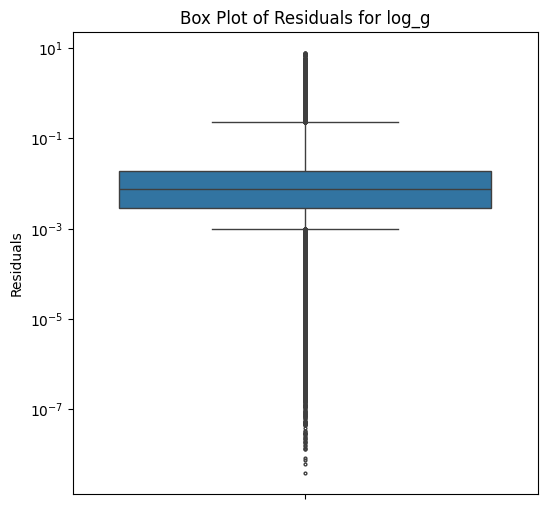

...

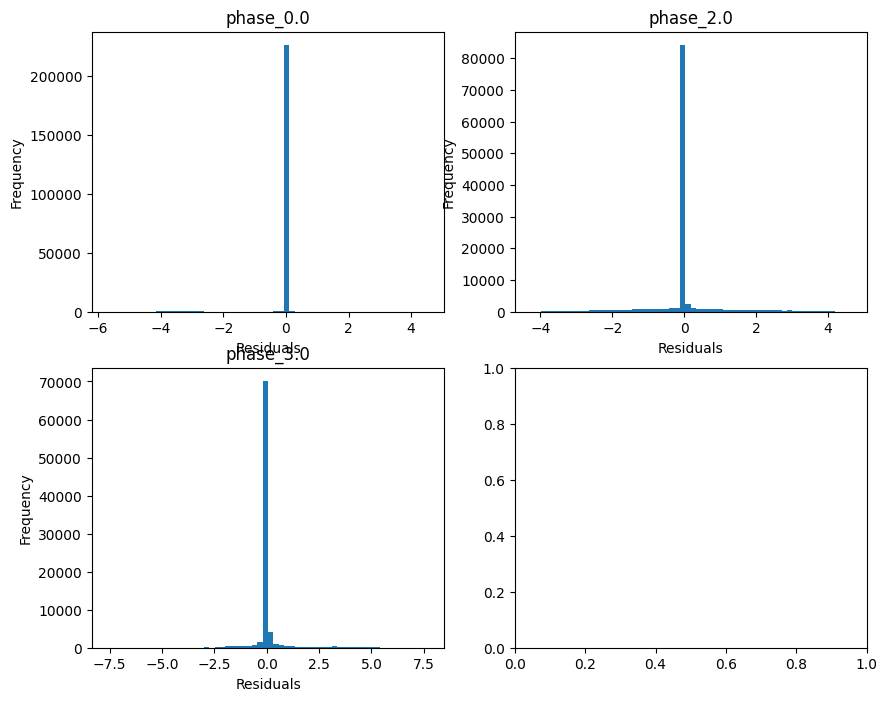

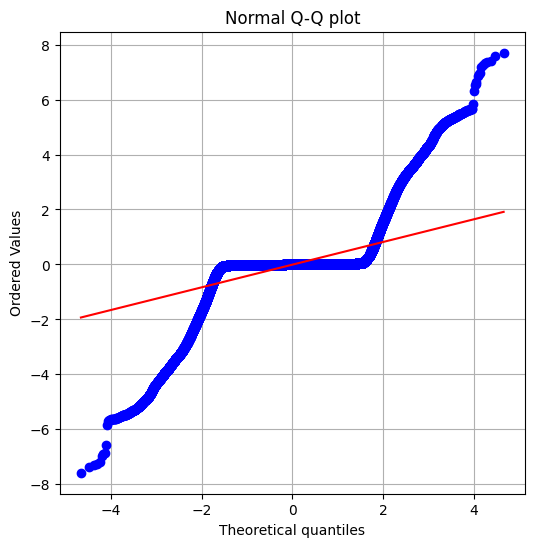

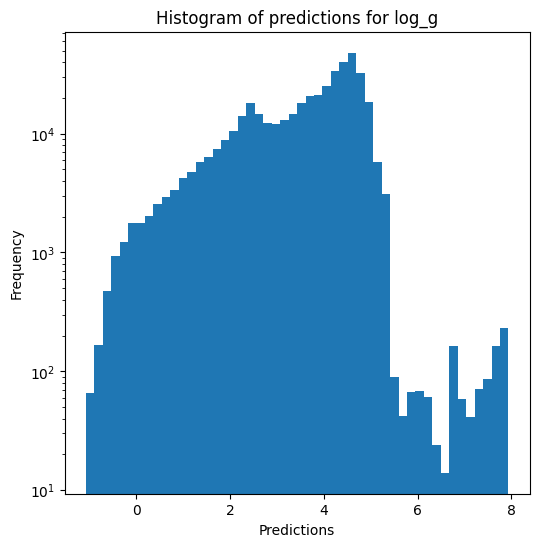

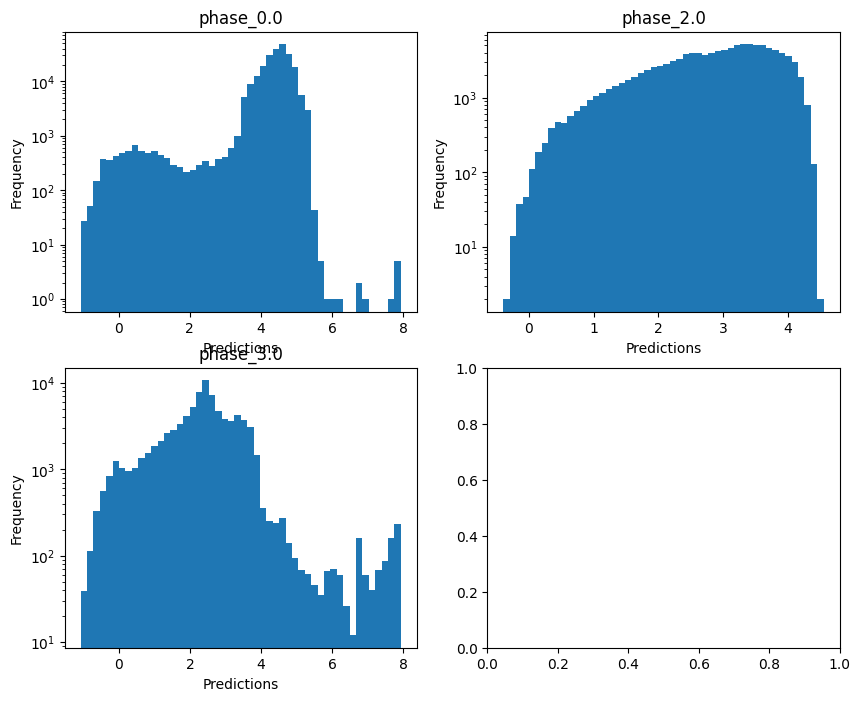

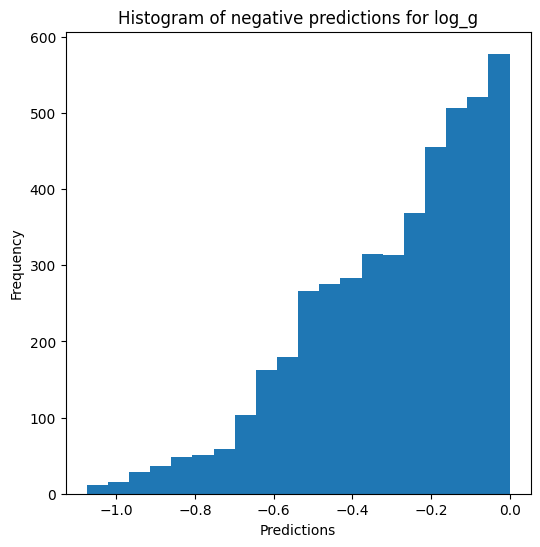


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.78587841091396
  RMSE :  0.23578918676158186
  MAE :  0.03657195002113818
  MedAE :  0.002642713180841305
  CORR :  0.9072603865050688
  MAX_ER :  2.8409947115068483
  Percentiles : 
    75th percentile :  0.0049576703701542935
    90th percentile :  0.009142787881617065
    95th percentile :  0.015867110767104987
    99th percentile :  1.6157824965059167

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.013575926086211054
  RMSE :  0.4520004241171323
  MAE :  0.192503970724049
  MedAE :  0.008440165440949832
  CORR :  0.5193570359983666
  MAX_ER :  2.3190299467163435
  Percentiles : 
    75th percentile :  0.048554539474014446
    90th percentile :  0.8206871814488762
    95th percentile :  1.2223970227937853
    99th percentile :  1.751808319805908

radius results for the phase categ

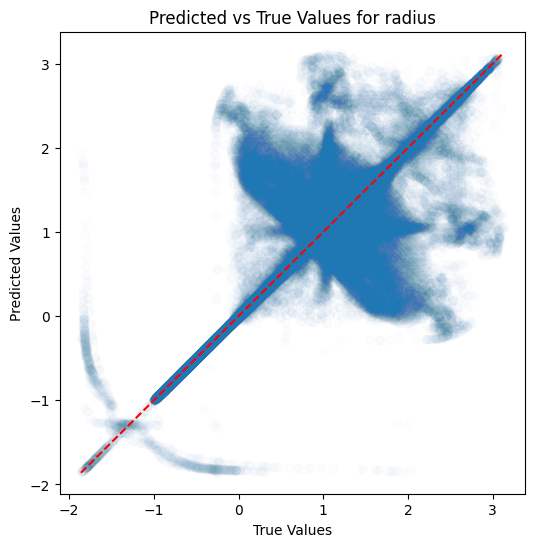

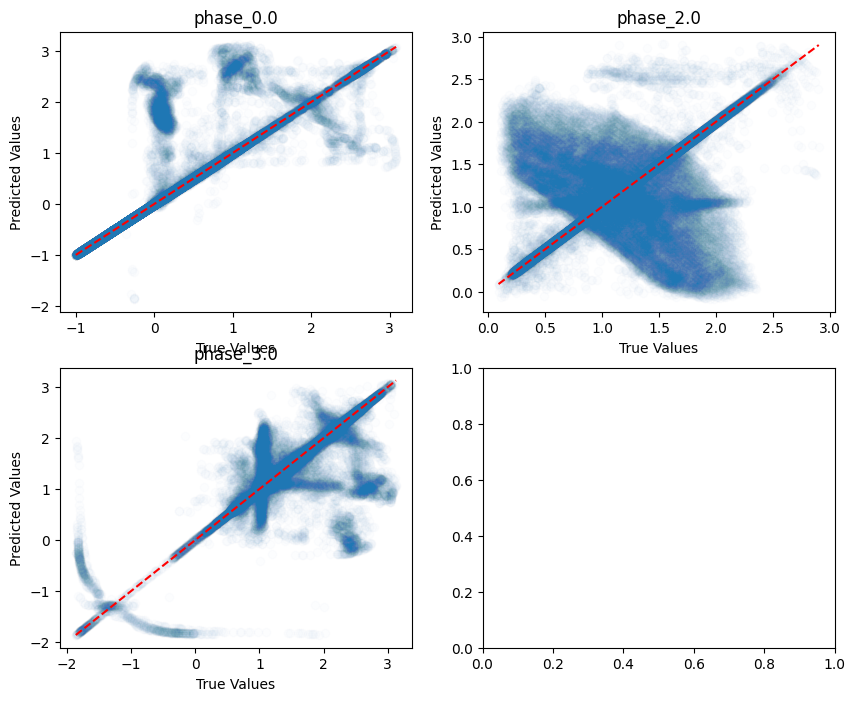

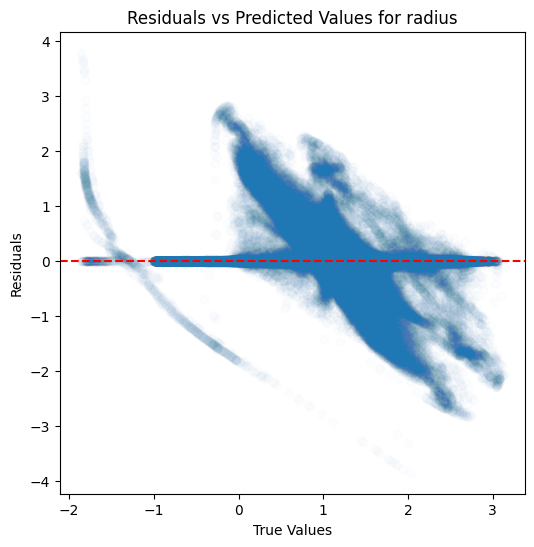

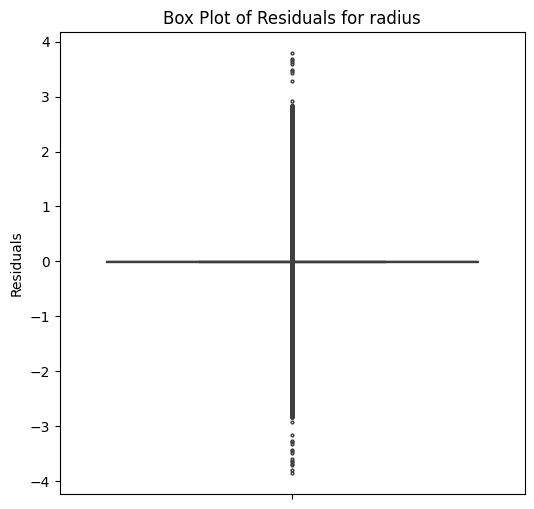

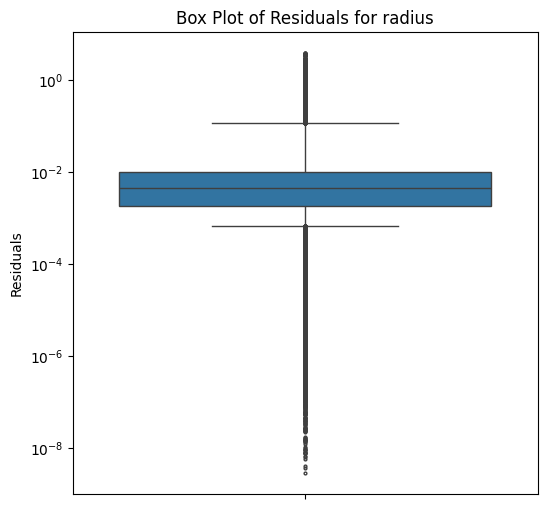

...

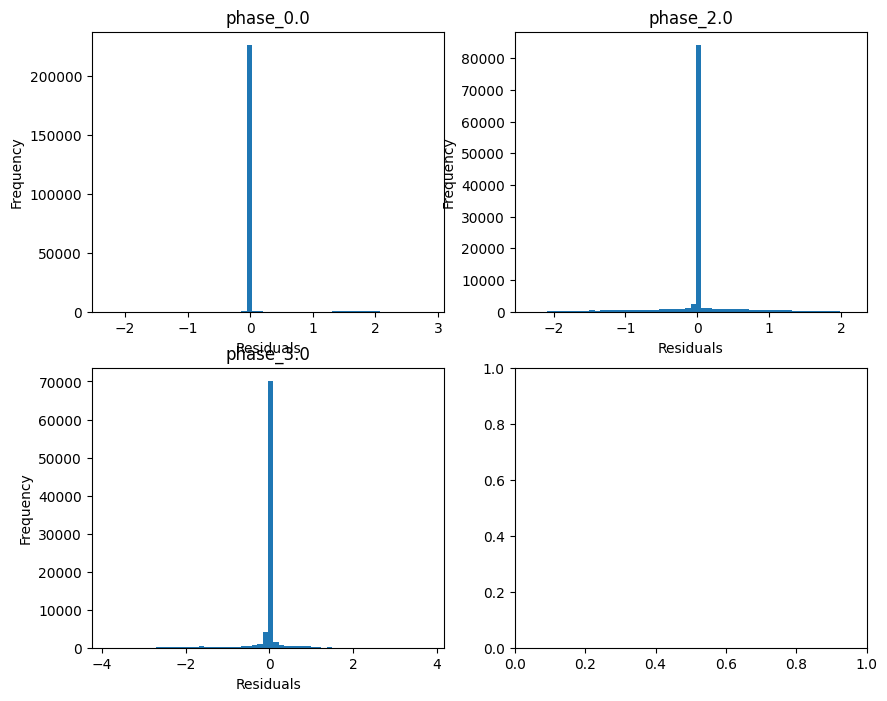

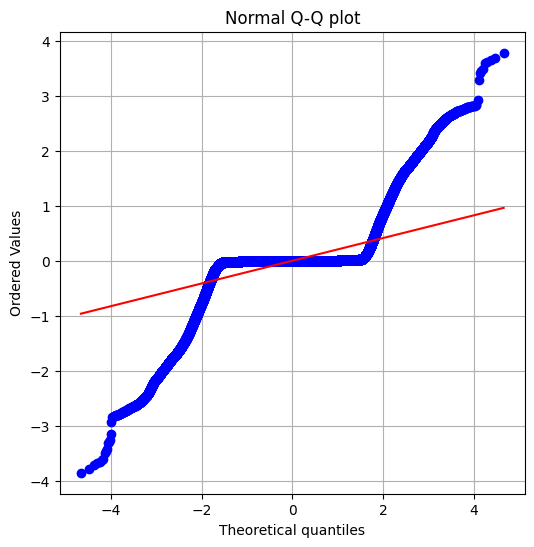

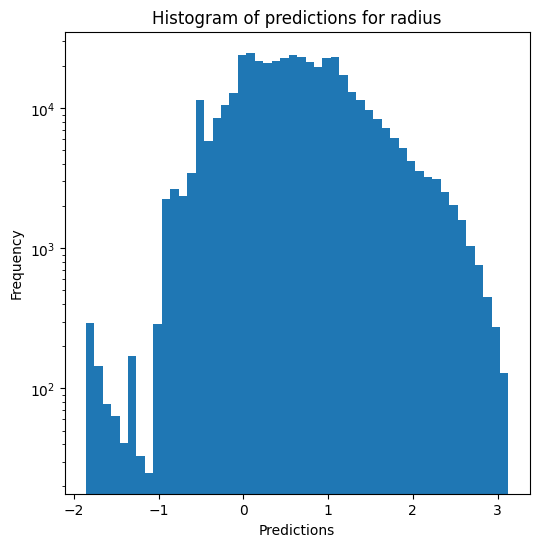

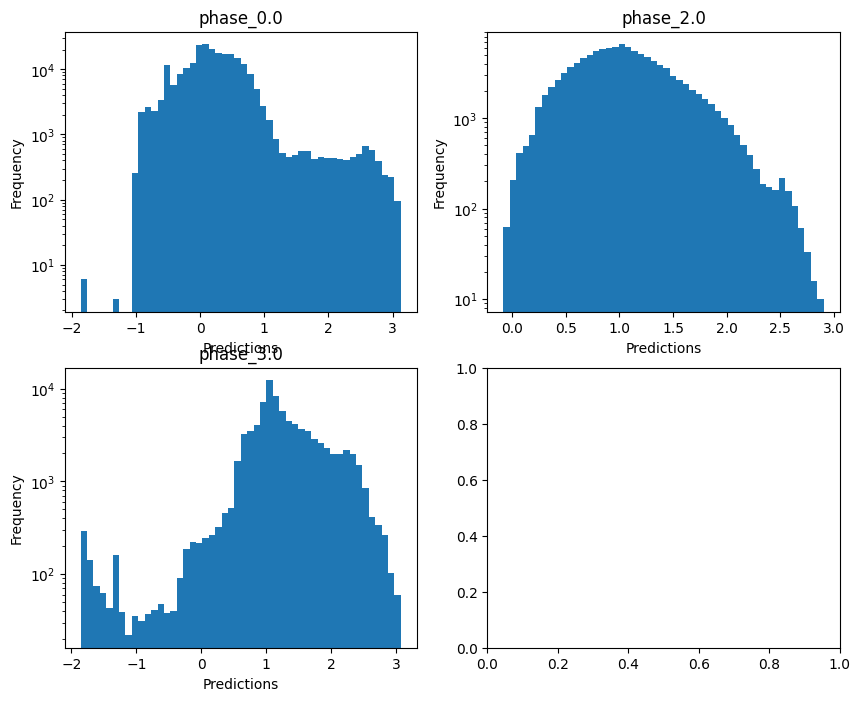

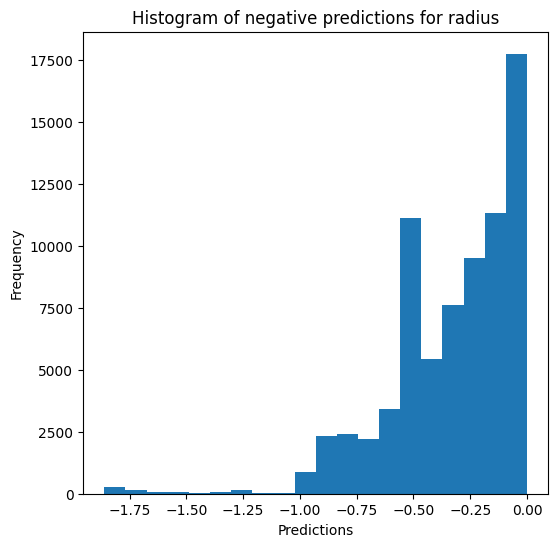

Saving predictions and results...


In [15]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True)

### K-nearest neighbours

In [16]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_30 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.3446822240585243 - 4.898172986424315
  RVE :  0.971629724474633
  RMSE :  0.05493578511988841
  MAE :  0.011395809336369819
  MedAE :  0.00104422084845468
  CORR :  0.9857395150147075
  MAX_ER :  1.6298801437919455
  Percentiles : 
    75th percentile :  0.002617535053818787
    90th percentile :  0.0076566329362259475
    95th percentile :  0.04470855430648406
    99th percentile :  0.2799920200182295

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.6749789254031855
  RVE :  0.9811824504508391
  RMSE :  0.039513842187815715
  MAE :  0.01710074585967697
  MedAE :  0.0023112696467346705
  CORR :  0.9905559278658791
  MAX_ER :  0.7125480731818836
  Percentiles : 
    75th percentile :  0.011865838081191793
    90th percentile :  0.059128963298

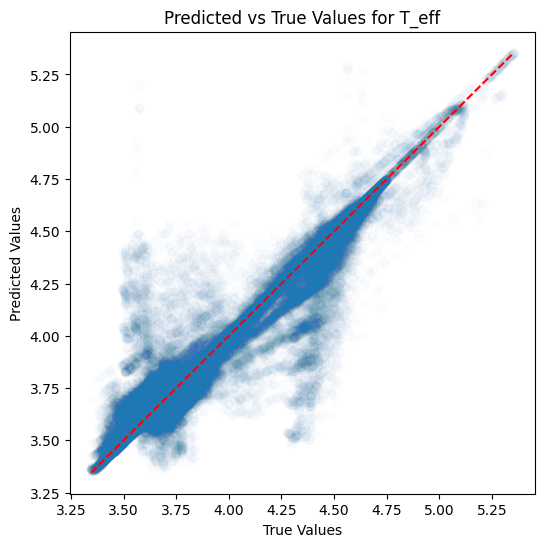

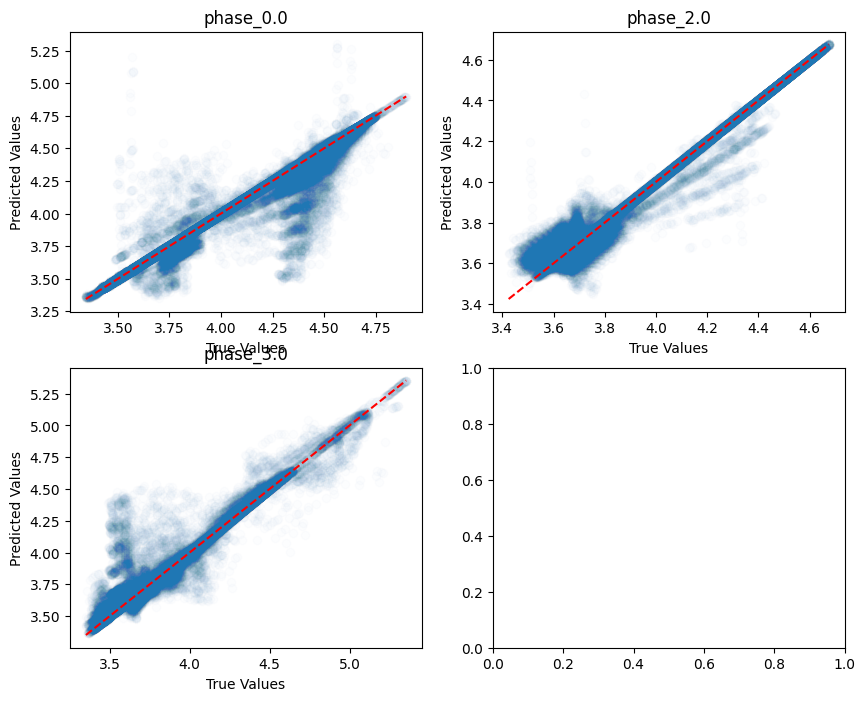

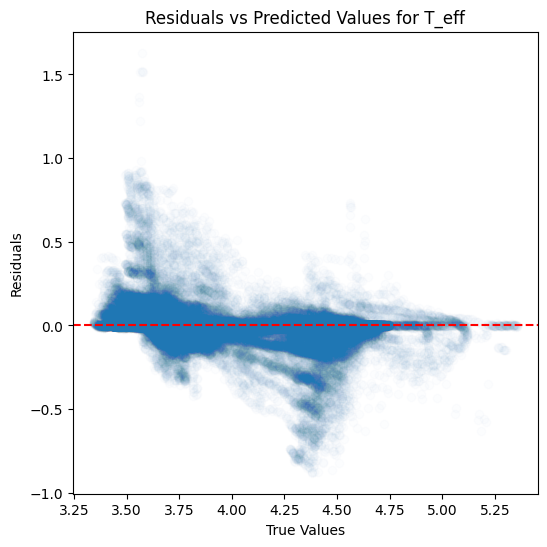

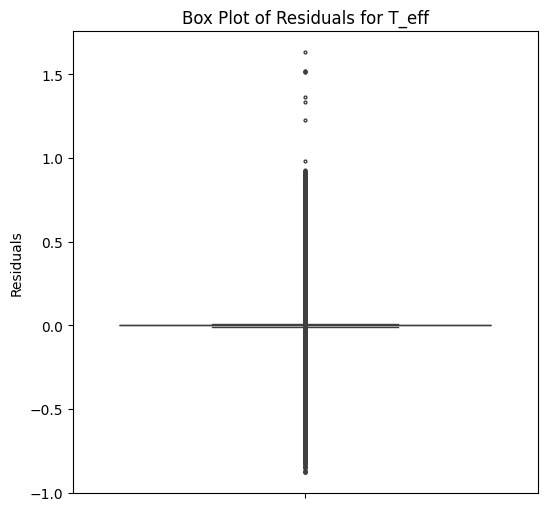

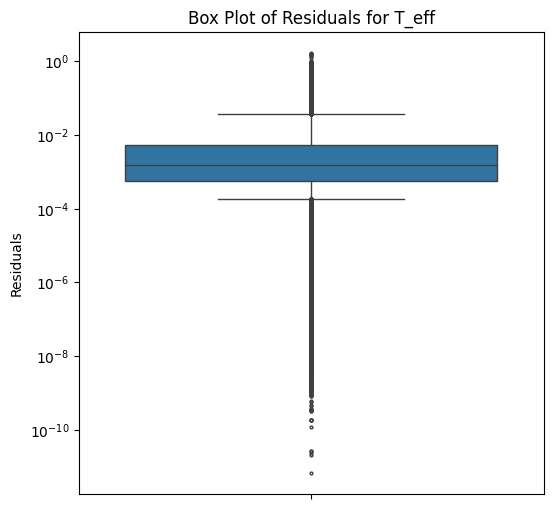

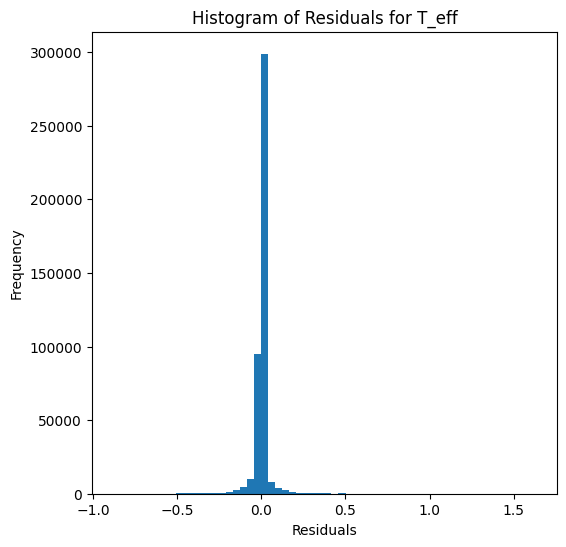

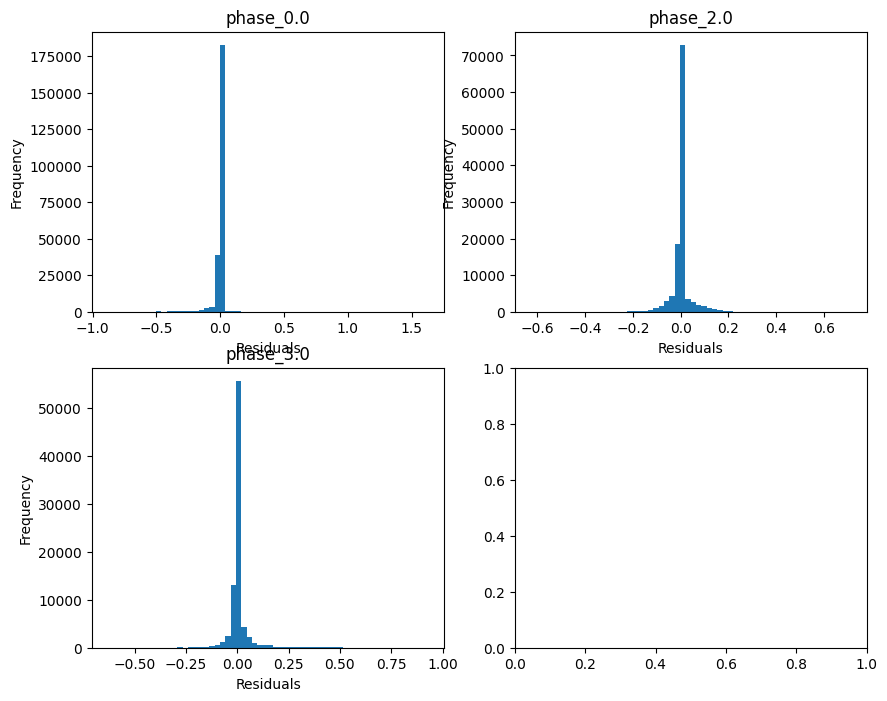

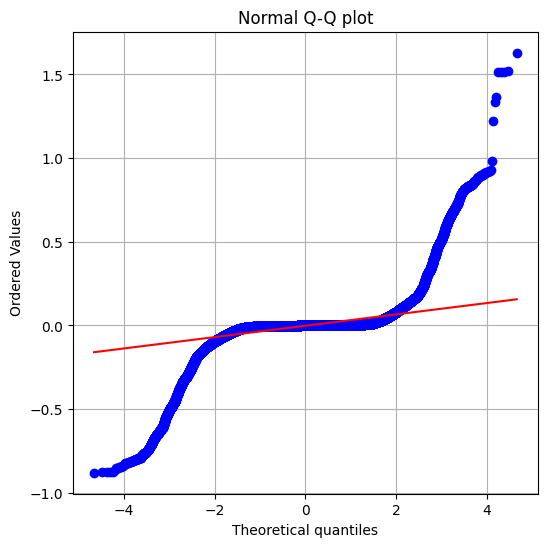

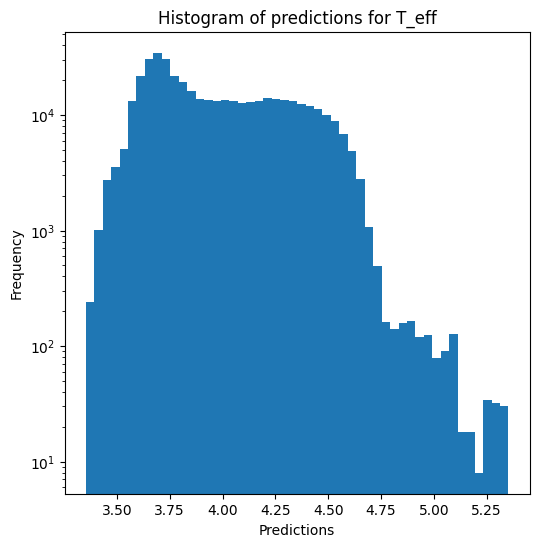

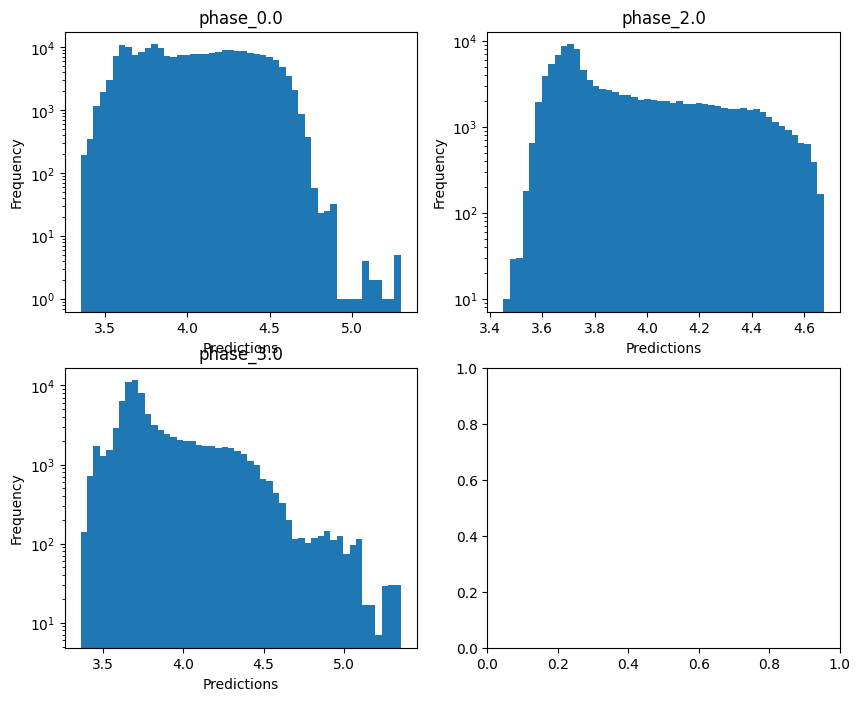


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.6487015394414872
  RMSE :  0.3539027271246393
  MAE :  0.07222598213366672
  MedAE :  0.002792836878345639
  CORR :  0.8652574409064449
  MAX_ER :  5.583491435529796
  Percentiles : 
    75th percentile :  0.007715623415895823
    90th percentile :  0.036126142672769146
    95th percentile :  0.2673433151466789
    99th percentile :  1.9153130436332675

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.5620808227727763
  RMSE :  0.6105431687566982
  MAE :  0.2706498830648724
  MedAE :  0.011358893597884667
  CORR :  0.755295665516528
  MAX_ER :  4.507994729238164
  Percentiles : 
    75th percentile :  0.2224876665602401
    90th percentile :  1.0623901568885898
    95th percentile :  1.5540881349211155
    99th percentile :  2.3771254723705755

log_g results for the phase category with 

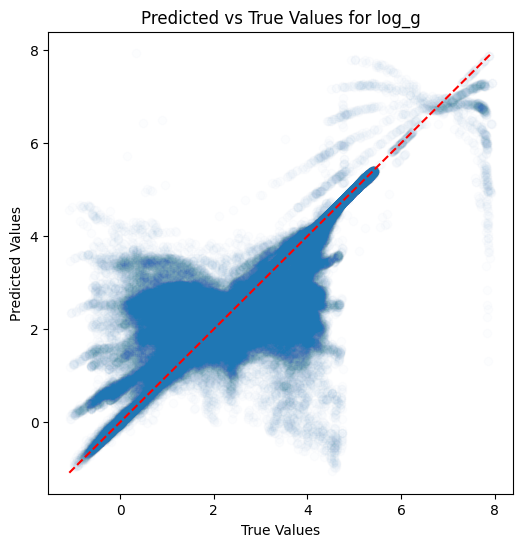

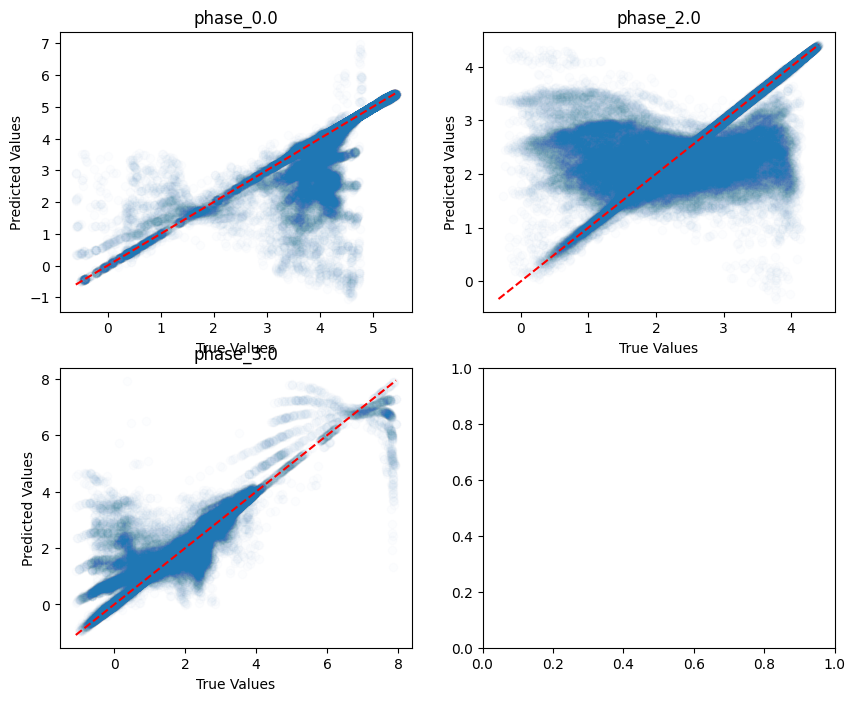

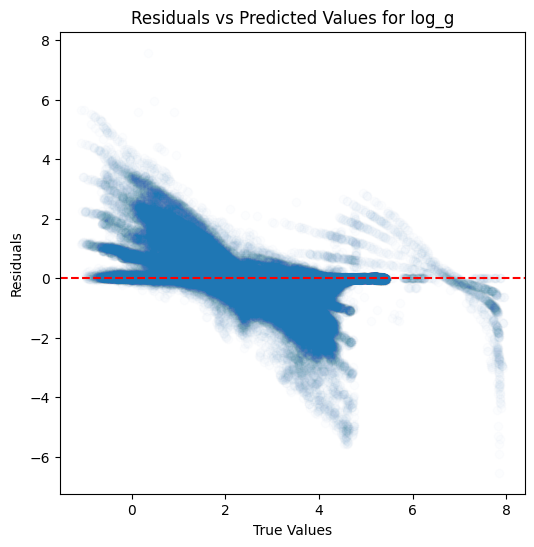

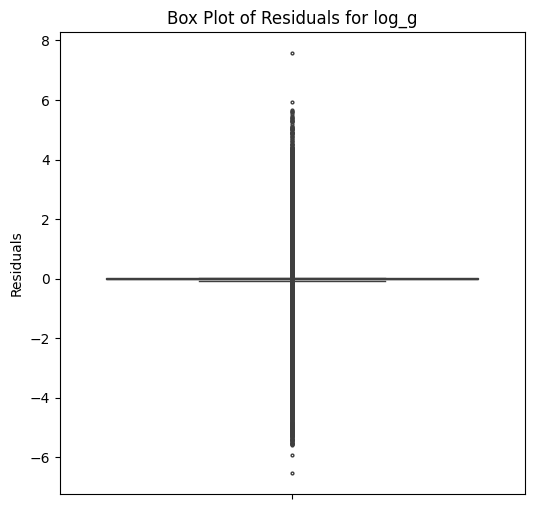

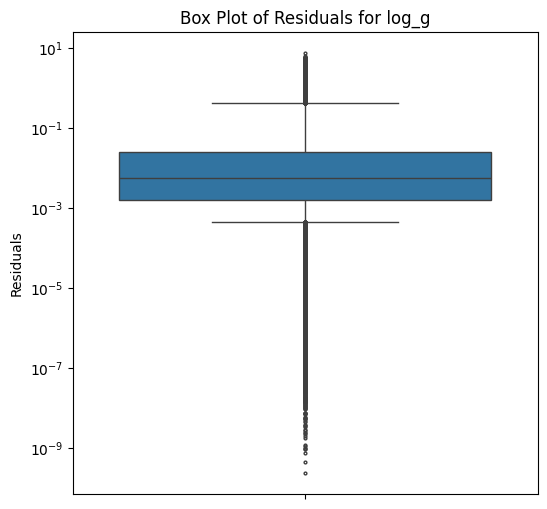

...

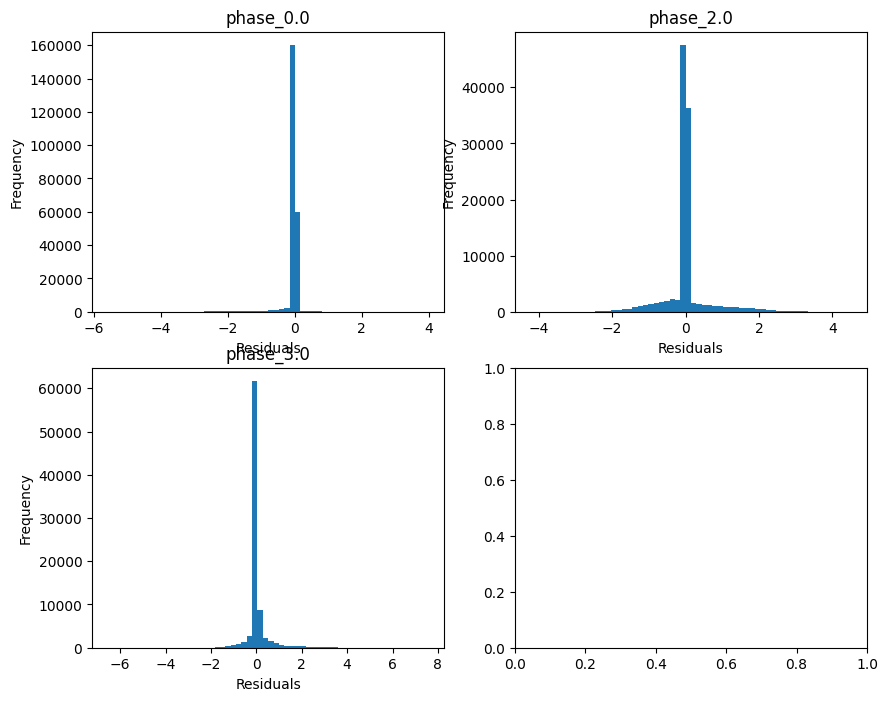

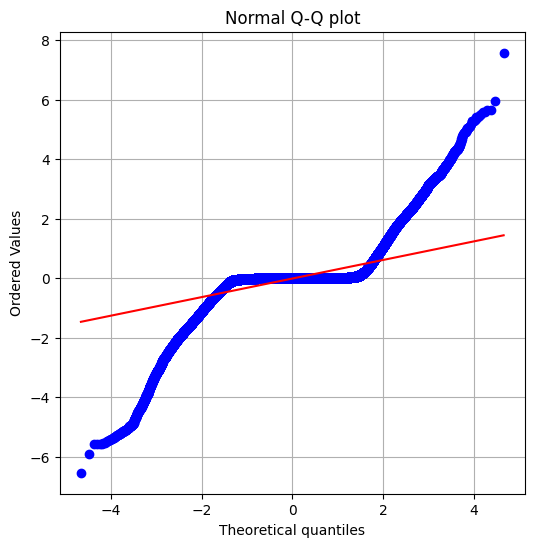

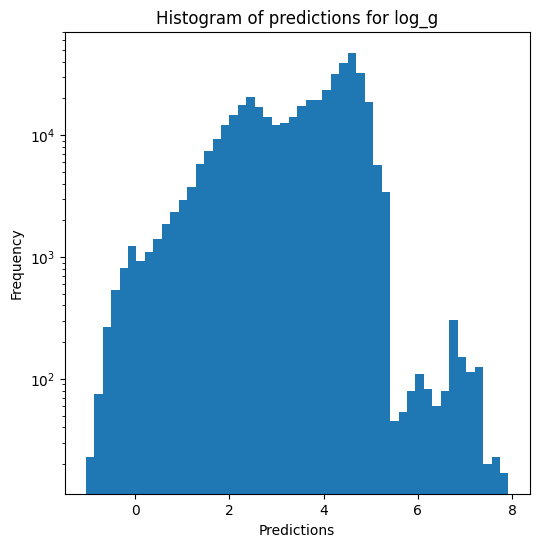

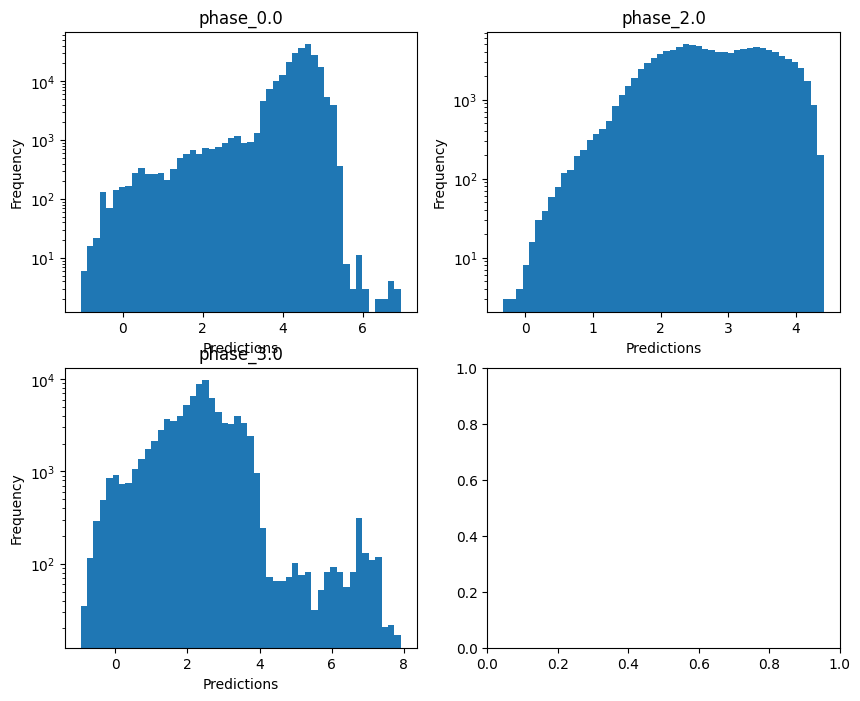

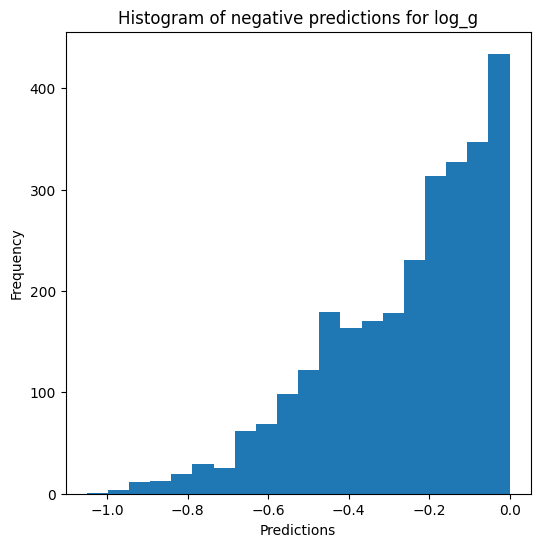


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.880764390268852
  RMSE :  0.1771364449292657
  MAE :  0.03721576827394659
  MedAE :  0.002077940514398545
  CORR :  0.9468412870095751
  MAX_ER :  2.791341747808453
  Percentiles : 
    75th percentile :  0.005642974844278038
    90th percentile :  0.02308584430305938
    95th percentile :  0.13398579316234907
    99th percentile :  0.9584321576374616

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.5504121406287437
  RMSE :  0.3052652090744317
  MAE :  0.13532877283149886
  MedAE :  0.005689853852210158
  CORR :  0.7516136945495012
  MAX_ER :  2.253850910515633
  Percentiles : 
    75th percentile :  0.1112406739840783
    90th percentile :  0.5312071915795685
    95th percentile :  0.7770301953547624
    99th percentile :  1.188774637330491

radius results for the phase category wit

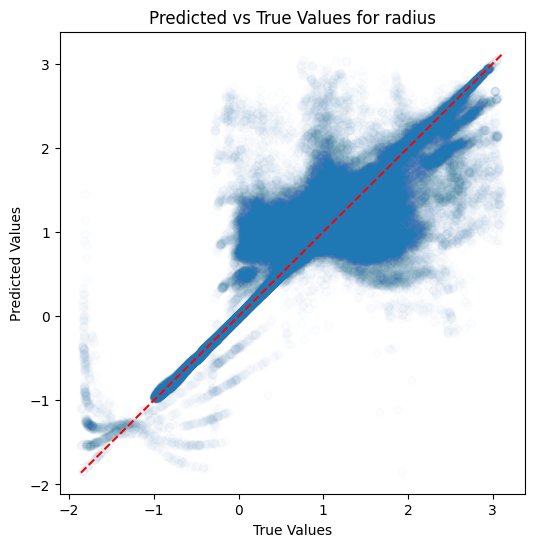

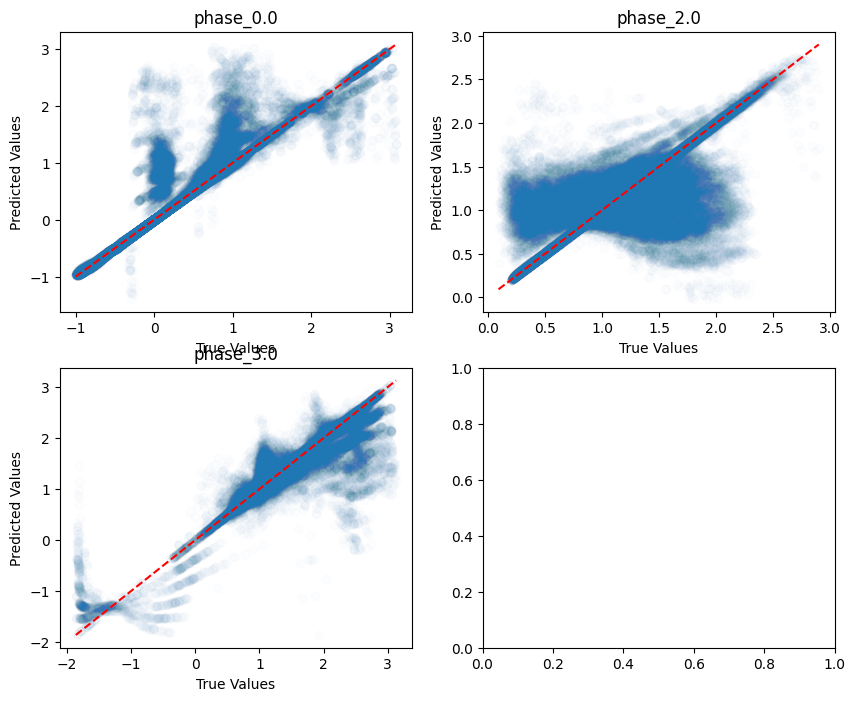

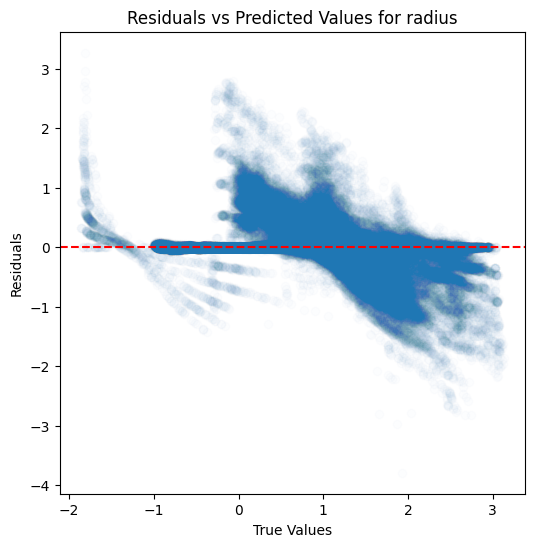

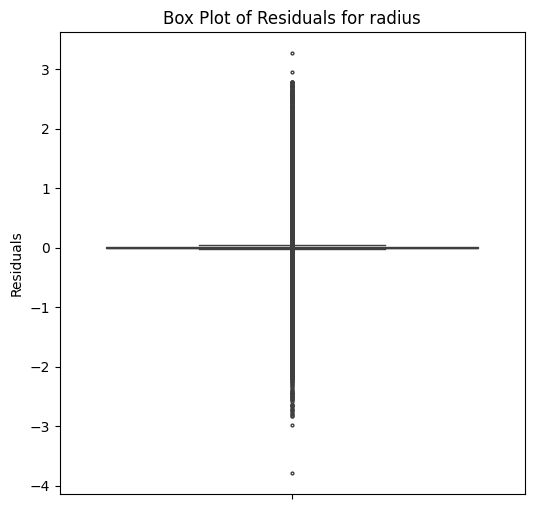

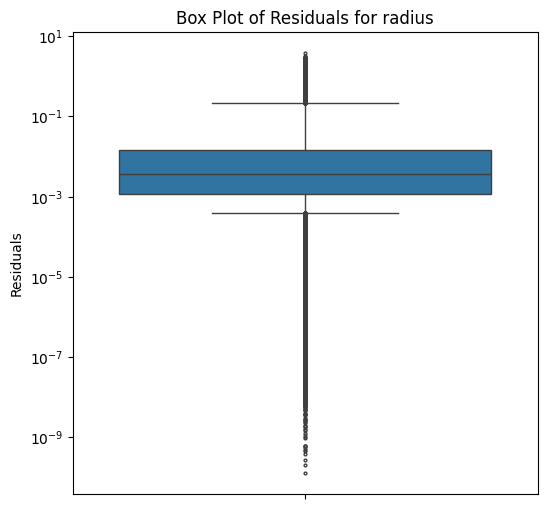

...

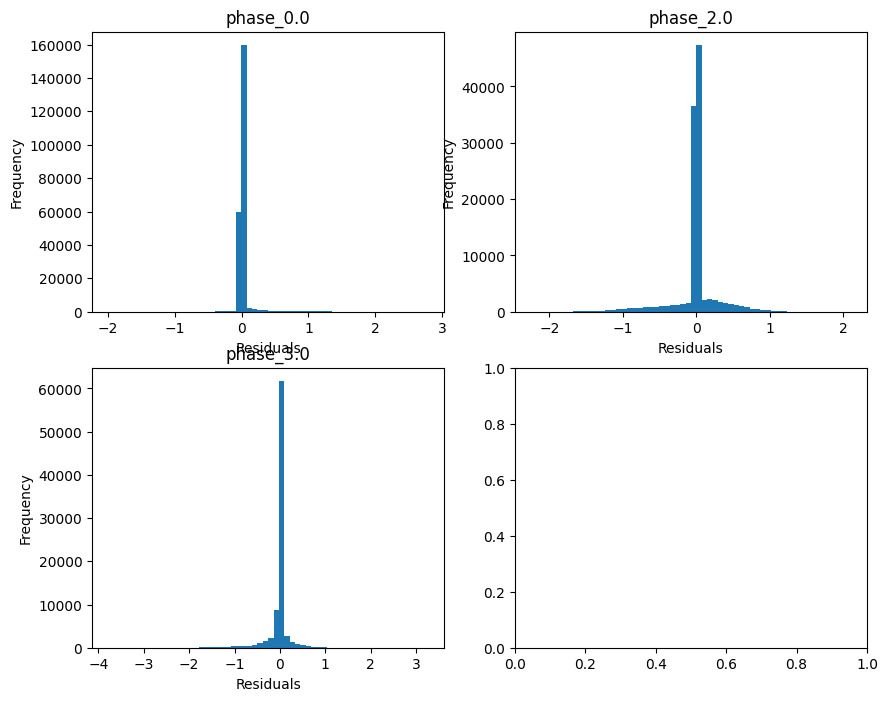

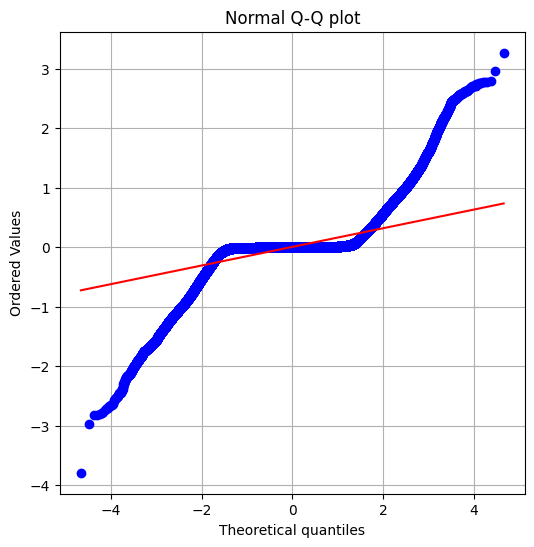

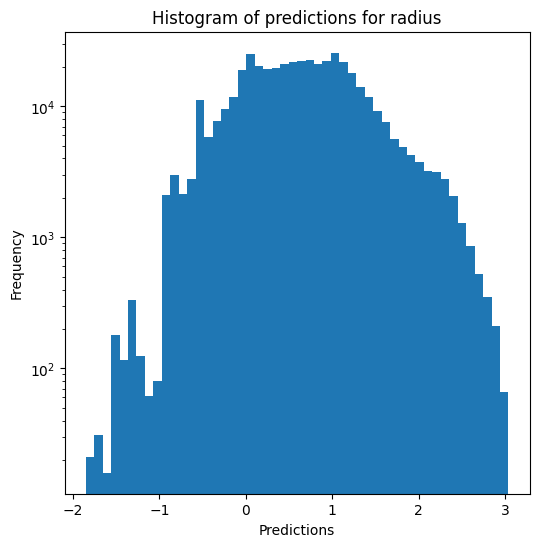

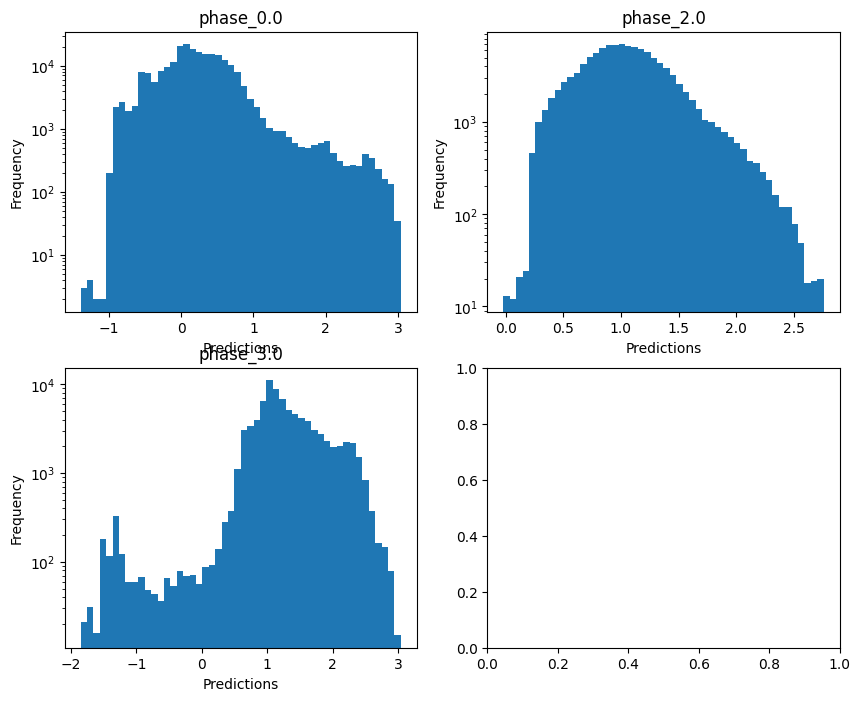

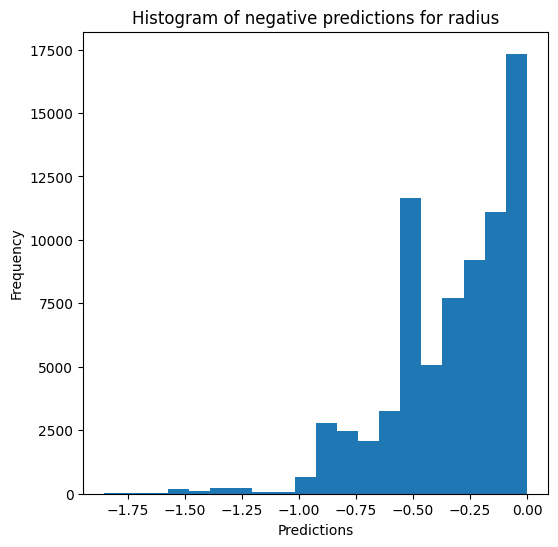

Saving predictions and results...


In [17]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True)

### Random forests

In [18]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_30 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.3446822240585243 - 4.898172986424315
  RVE :  0.972368236595118
  RMSE :  0.05402115922933882
  MAE :  0.009013000157223686
  MedAE :  0.0005509366789033798
  CORR :  0.9862275629291162
  MAX_ER :  1.609010130356026
  Percentiles : 
    75th percentile :  0.0013729328813202324
    90th percentile :  0.004197613261227675
    95th percentile :  0.015317309192307818
    99th percentile :  0.25127702927385825

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.6749789254031855
  RVE :  0.9699879071684812
  RMSE :  0.04990085823048122
  MAE :  0.020624457476885773
  MedAE :  0.002287172965037332
  CORR :  0.9848826403539994
  MAX_ER :  0.7126406594710817
  Percentiles : 
    75th percentile :  0.013619681169096065
    90th percentile :  0.0722041970

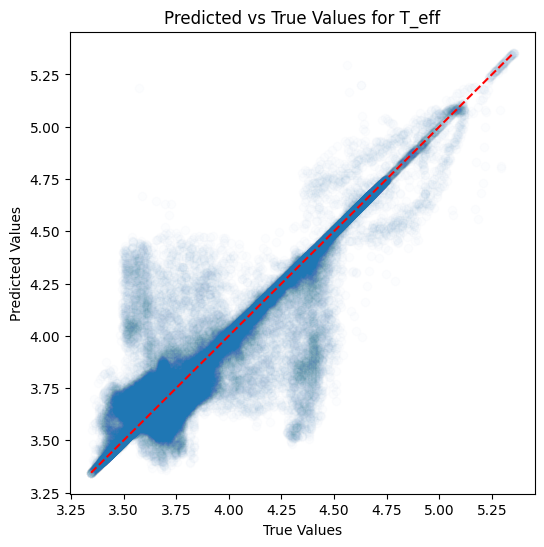

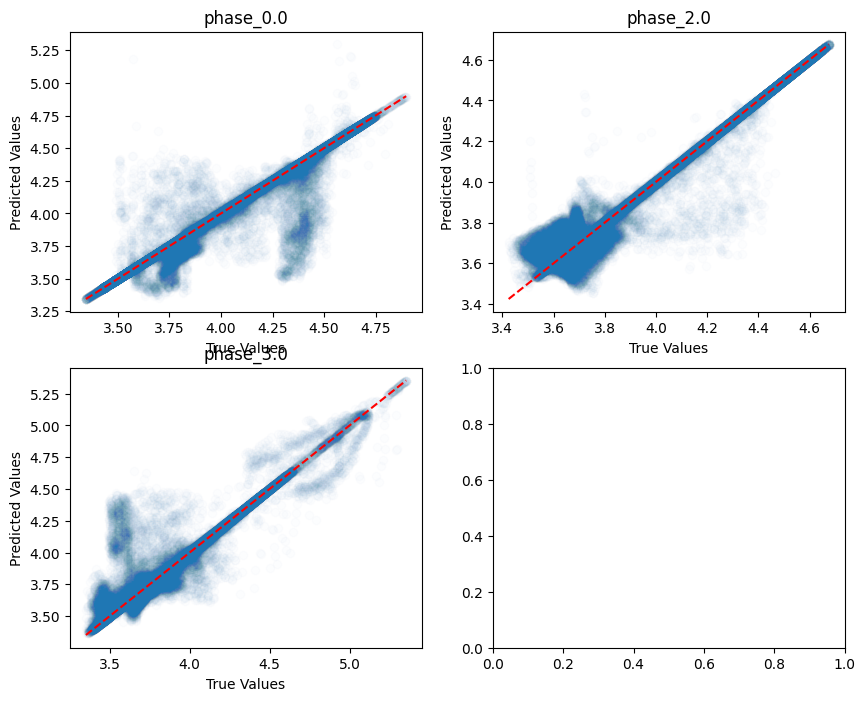

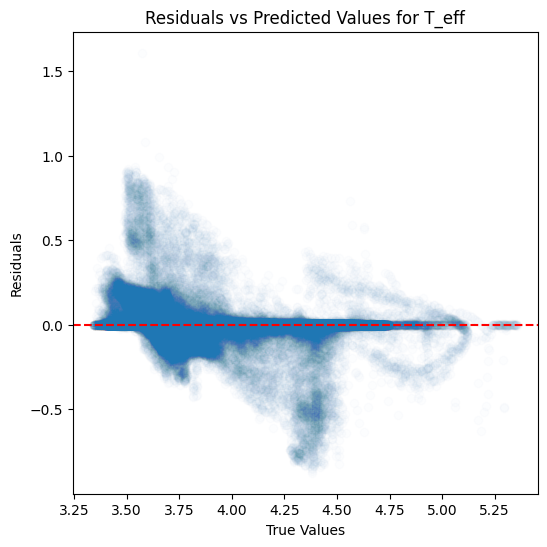

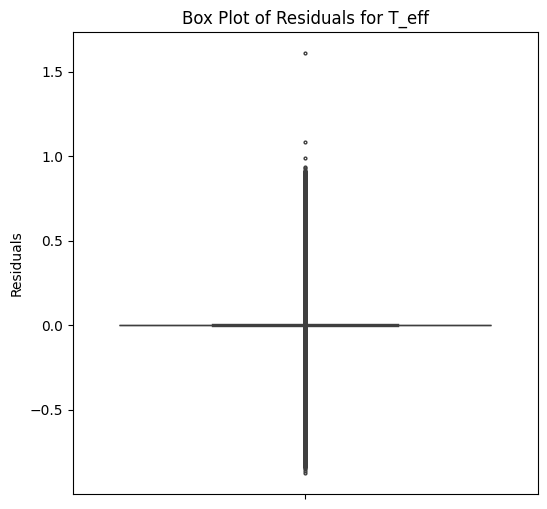

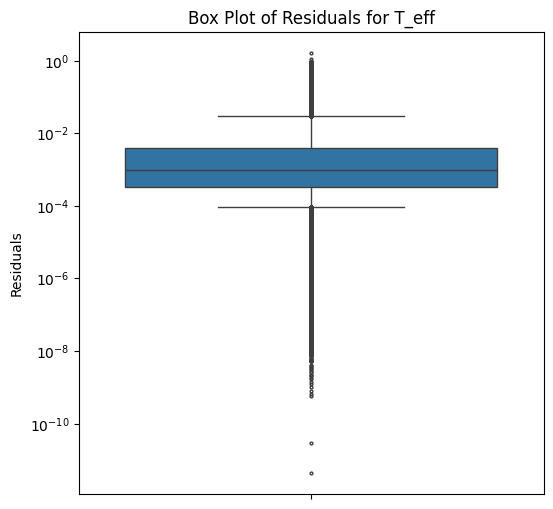

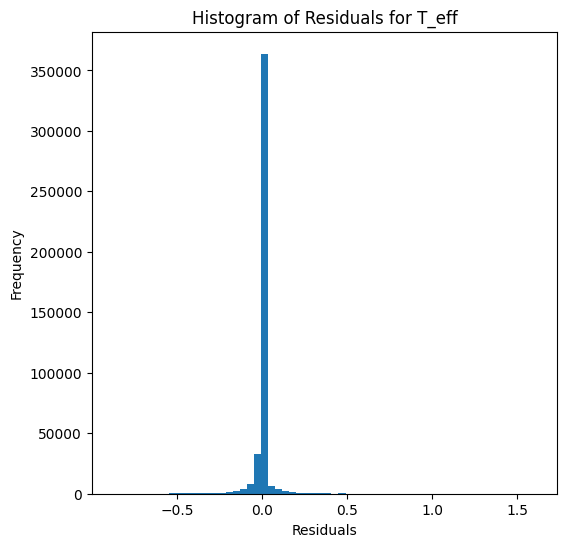

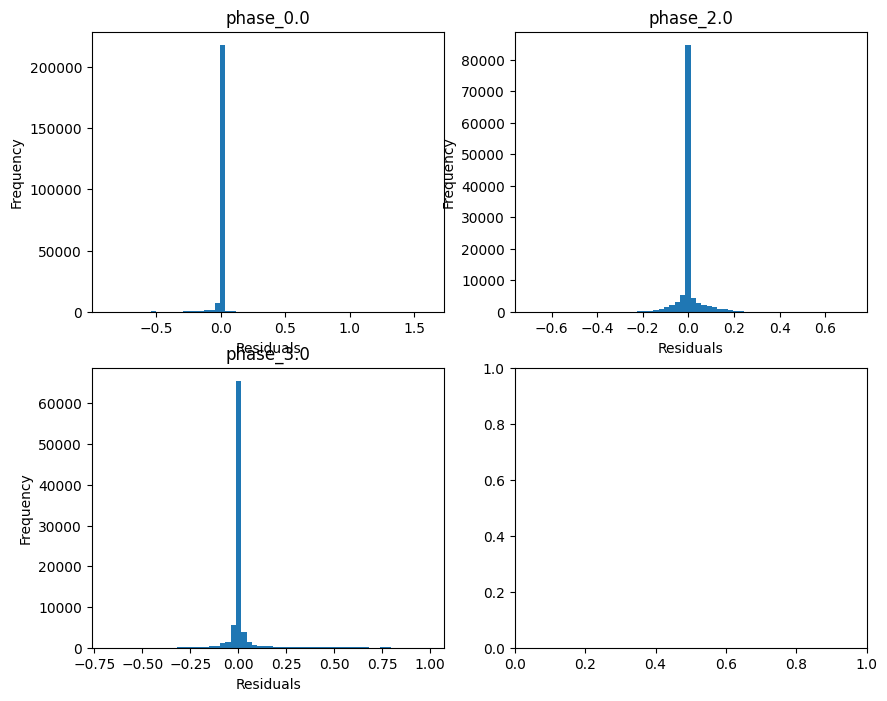

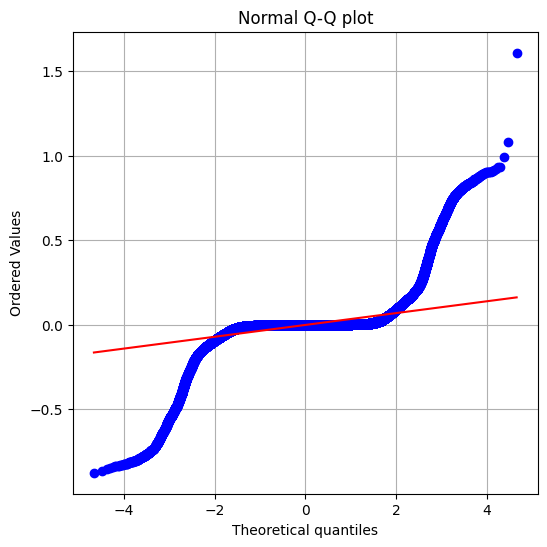

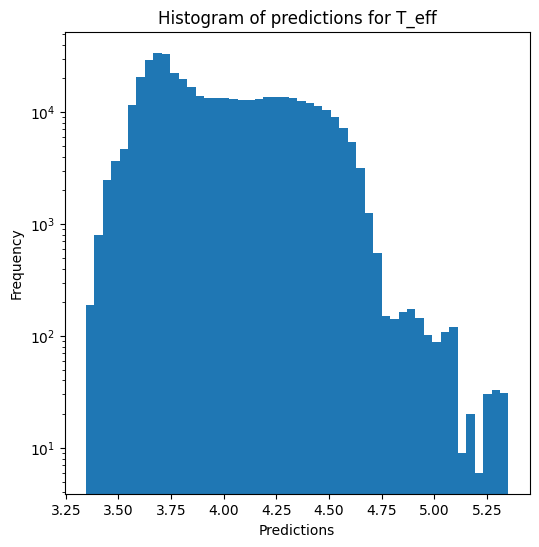

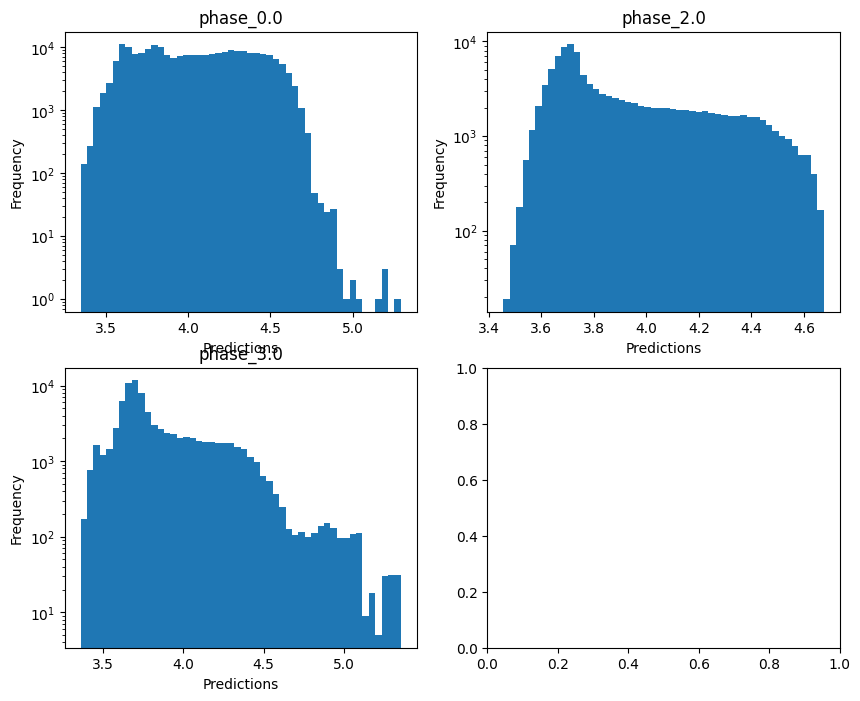


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.6065617663337599
  RMSE :  0.3731347363822004
  MAE :  0.065186541242668
  MedAE :  0.001620004343943382
  CORR :  0.8492778584550512
  MAX_ER :  5.575295827077432
  Percentiles : 
    75th percentile :  0.004635353315903812
    90th percentile :  0.015232552207064834
    95th percentile :  0.10098793417704657
    99th percentile :  2.251794862057484

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.3396043633270055
  RMSE :  0.7497178770359257
  MAE :  0.32982295321723254
  MedAE :  0.01144405805471882
  CORR :  0.6354568815711641
  MAX_ER :  4.63531226236744
  Percentiles : 
    75th percentile :  0.22144741925655043
    90th percentile :  1.3430863478308948
    95th percentile :  1.9343080045262837
    99th percentile :  2.9320879878861232

log_g results for the phase category with a

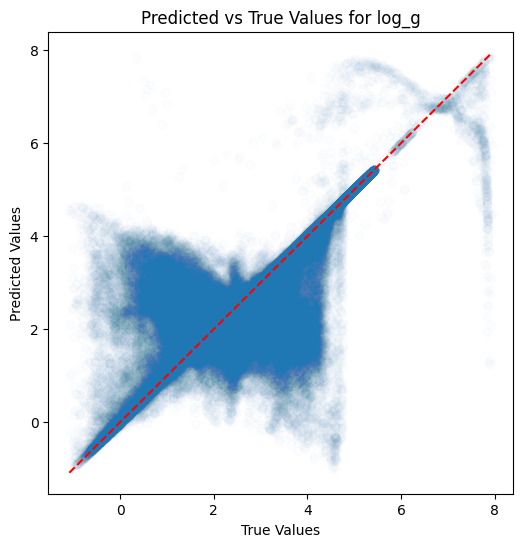

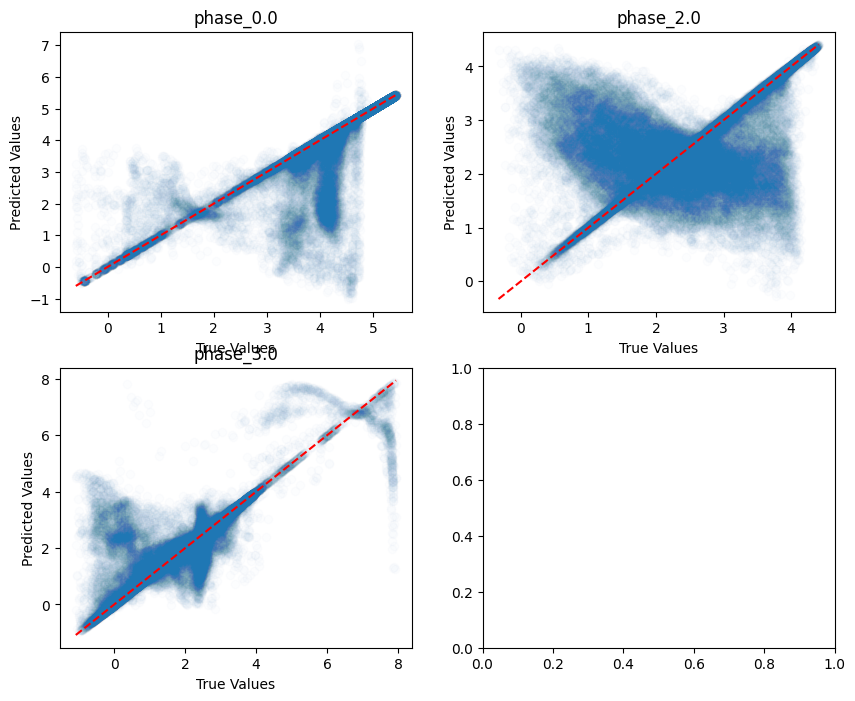

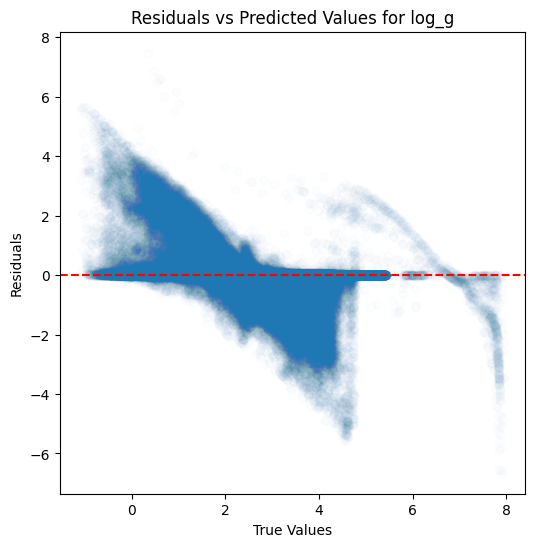

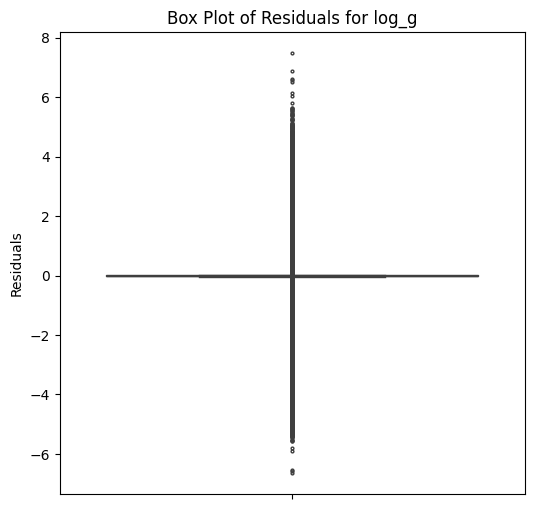

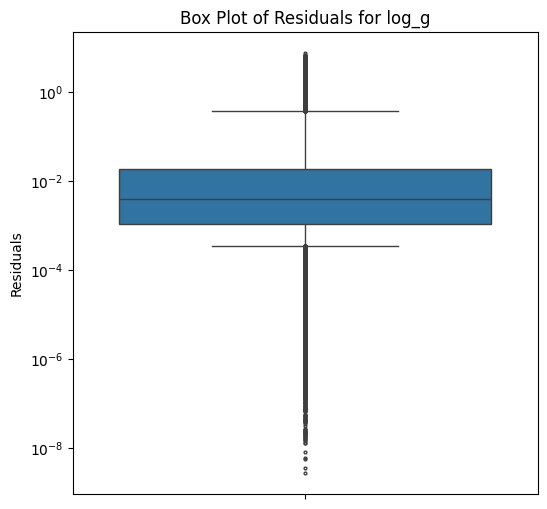

...

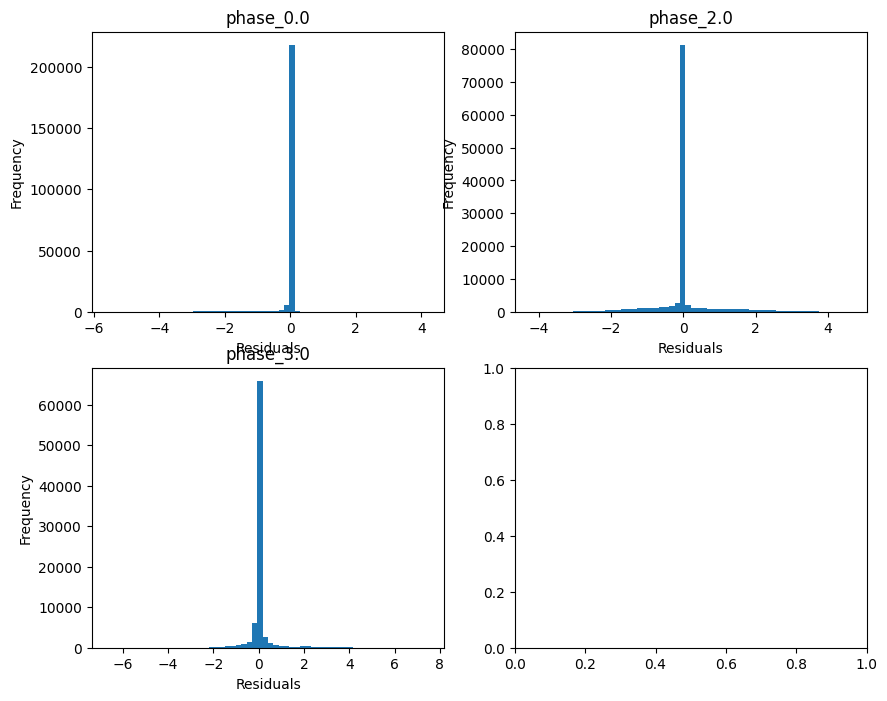

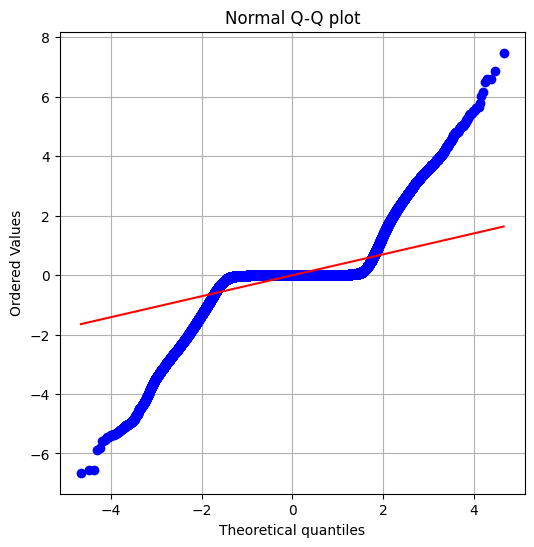

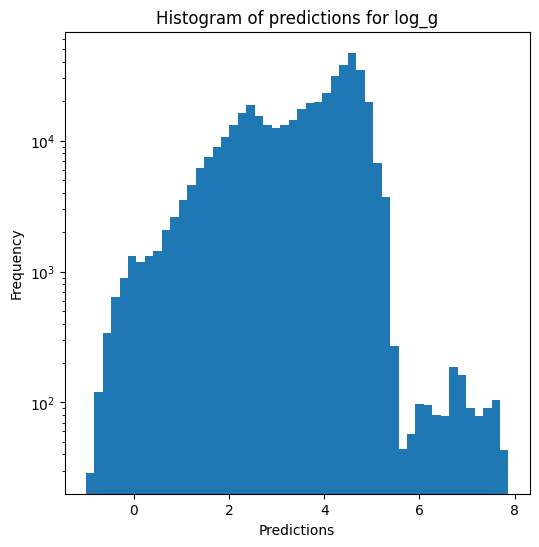

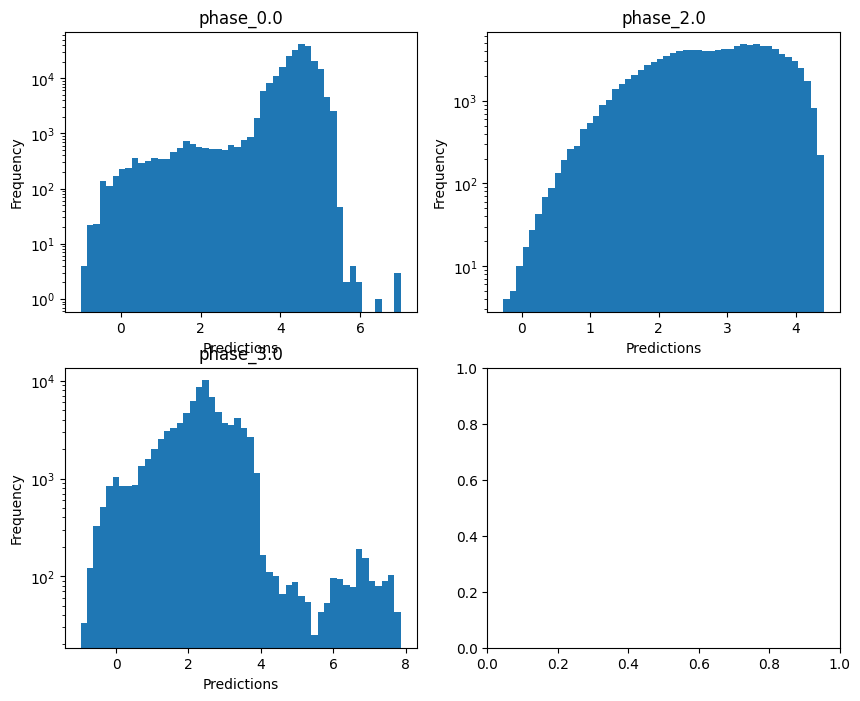

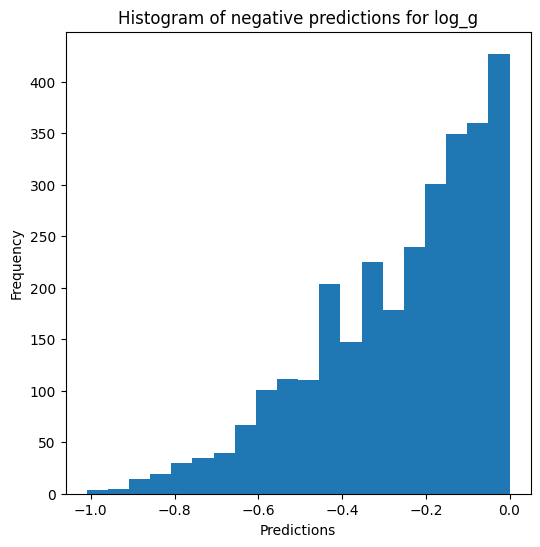


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.8665744879547534
  RMSE :  0.18668843012210892
  MAE :  0.03287193918245935
  MedAE :  0.0010483991758731617
  CORR :  0.9391459356548252
  MAX_ER :  2.7894335388163016
  Percentiles : 
    75th percentile :  0.002760287495092391
    90th percentile :  0.00835433374093646
    95th percentile :  0.050606988439688465
    99th percentile :  1.129440455218094

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.3220117337574824
  RMSE :  0.3748501422428406
  MAE :  0.1649121332337639
  MedAE :  0.005729532333345944
  CORR :  0.6347483533877804
  MAX_ER :  2.3178745633281617
  Percentiles : 
    75th percentile :  0.11073311915447678
    90th percentile :  0.6715289972990794
    95th percentile :  0.9671186614861744
    99th percentile :  1.4659933468562485

radius results for the phase catego

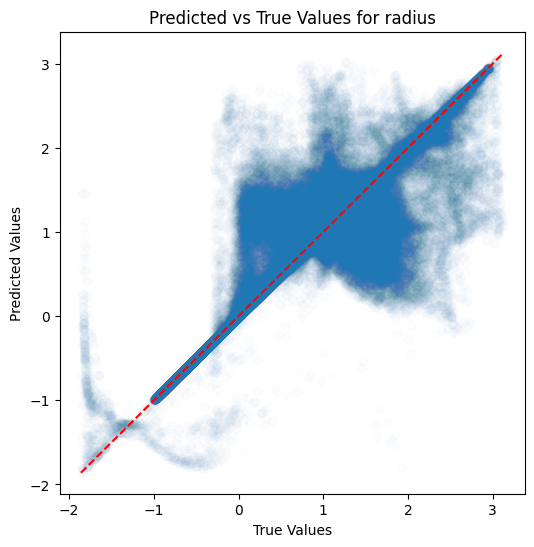

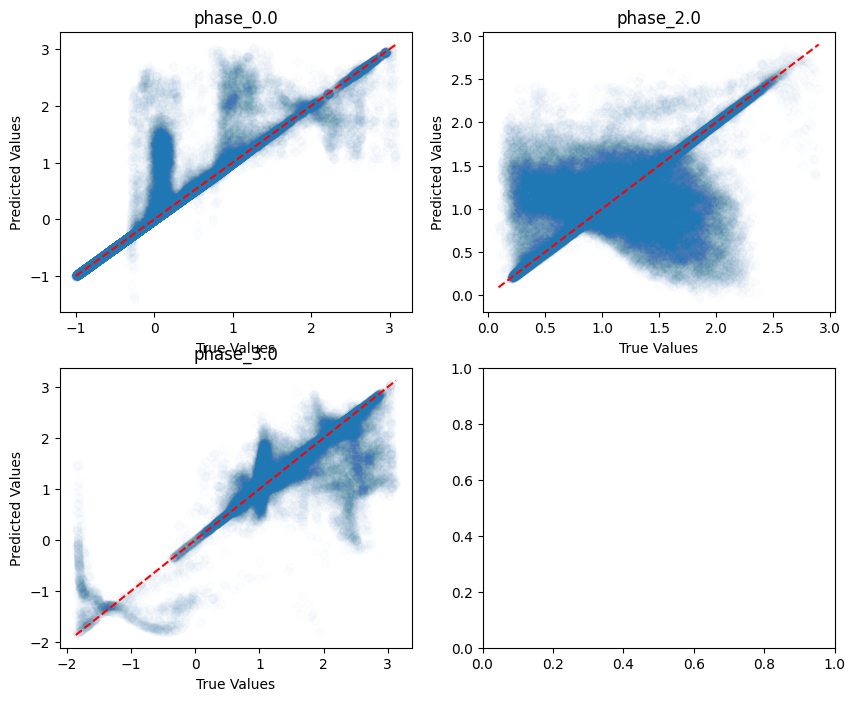

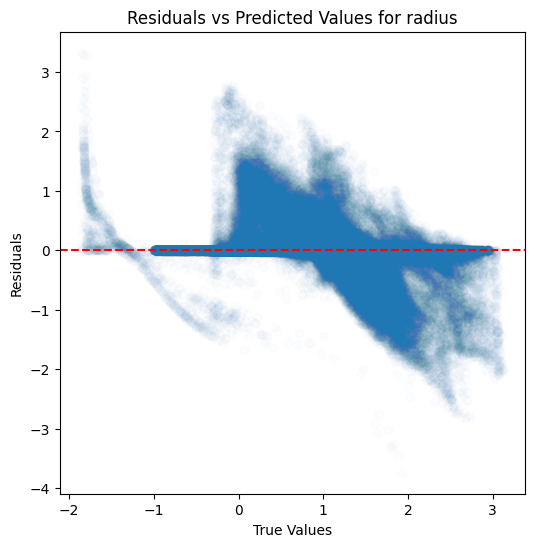

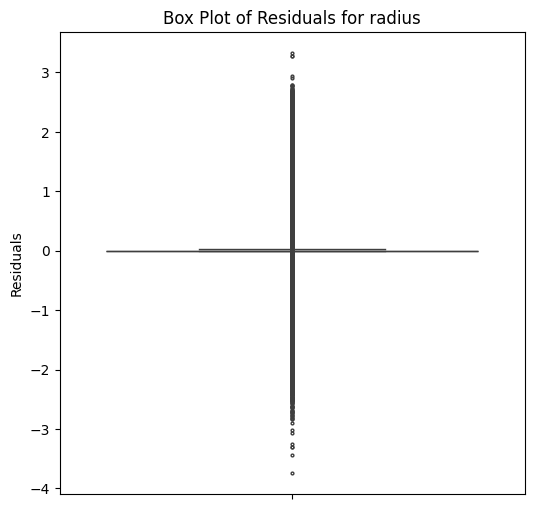

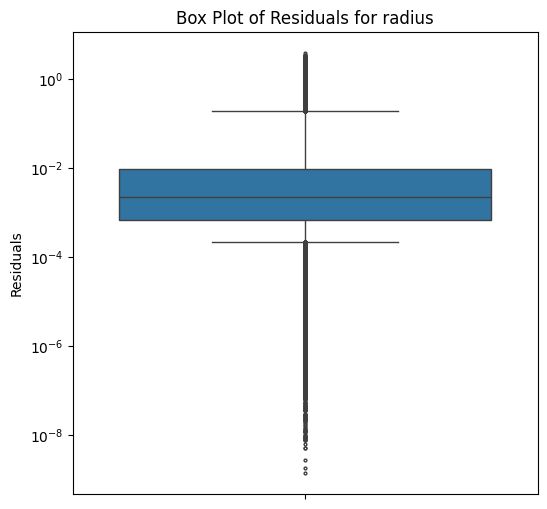

...

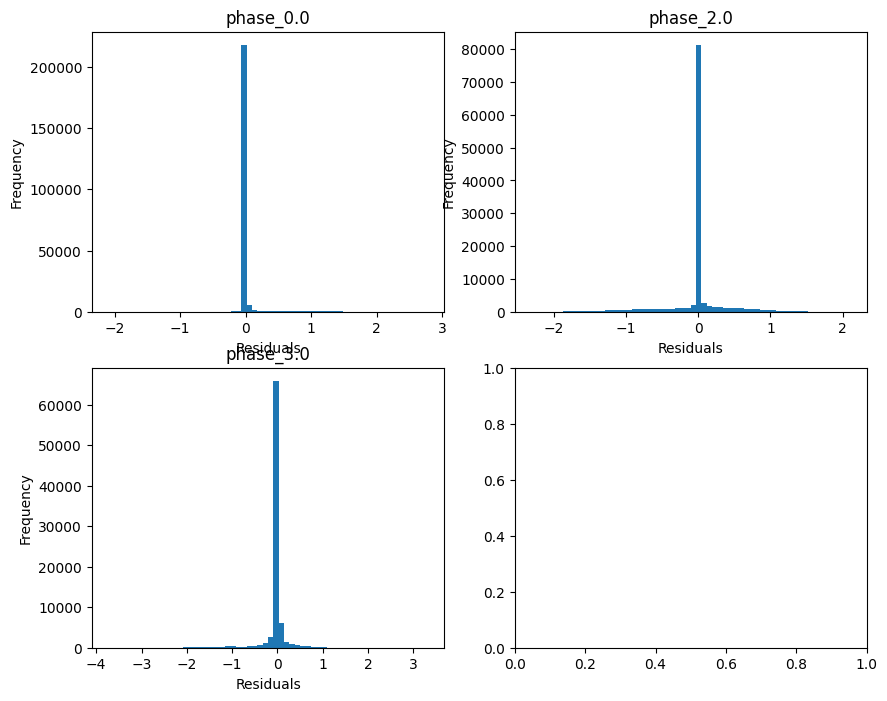

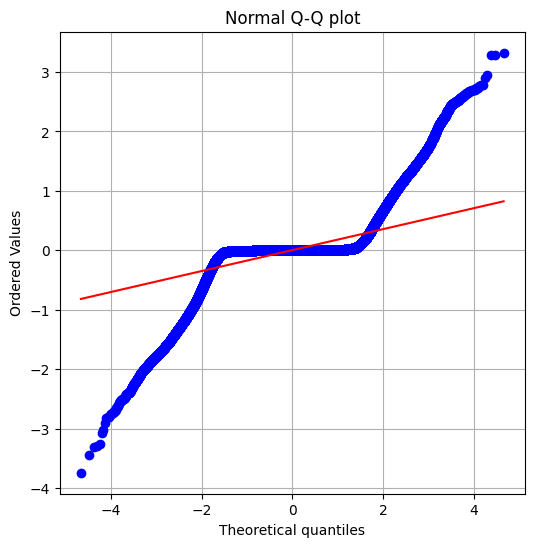

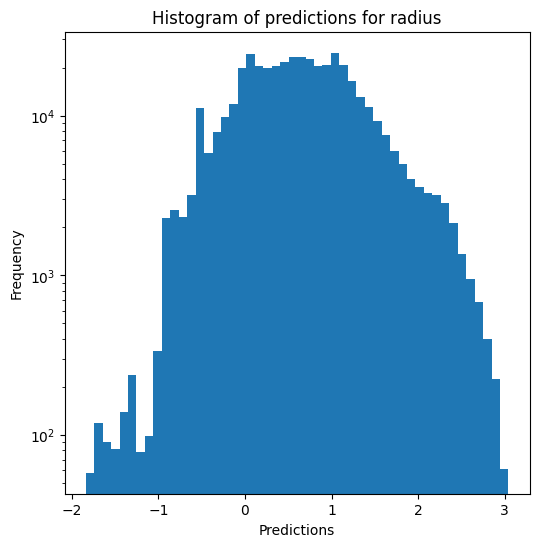

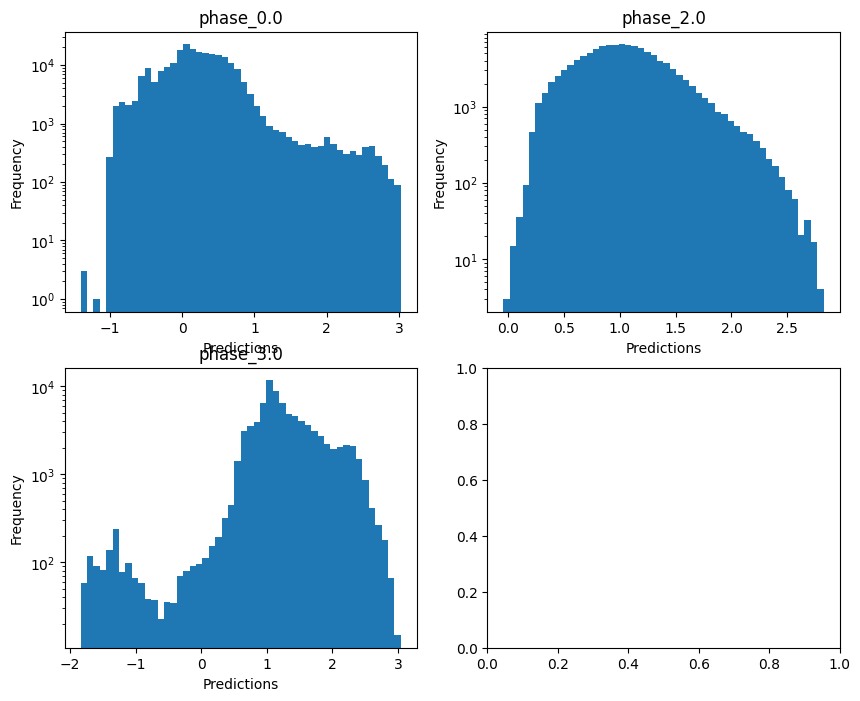

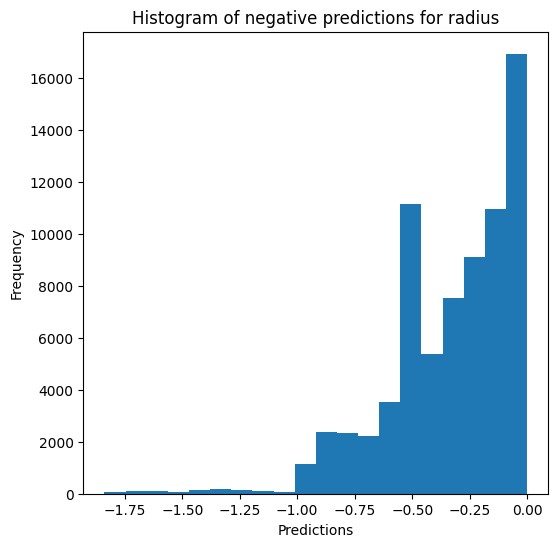

Saving predictions and results...


In [19]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True, n_jobs=5)

### XGBoost

In [20]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_30 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.3446822240585243 - 4.898172986424315
  RVE :  0.9324312101130455
  RMSE :  0.09071494915593475
  MAE :  0.04916130110943708
  MedAE :  0.01536740354186339
  CORR :  0.9658039197472158
  MAX_ER :  1.175092232678577
  Percentiles : 
    75th percentile :  0.05955230229254749
    90th percentile :  0.14785133549725976
    95th percentile :  0.21469286740589041
    99th percentile :  0.34923202409703685

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.6749789254031855
  RVE :  0.845075755136412
  RMSE :  0.11577868990988938
  MAE :  0.0866596828143227
  MedAE :  0.06606570488053554
  CORR :  0.91969702254538
  MAX_ER :  0.4967484887514395
  Percentiles : 
    75th percentile :  0.12015702007431361
    90th percentile :  0.1926661484768717
    95

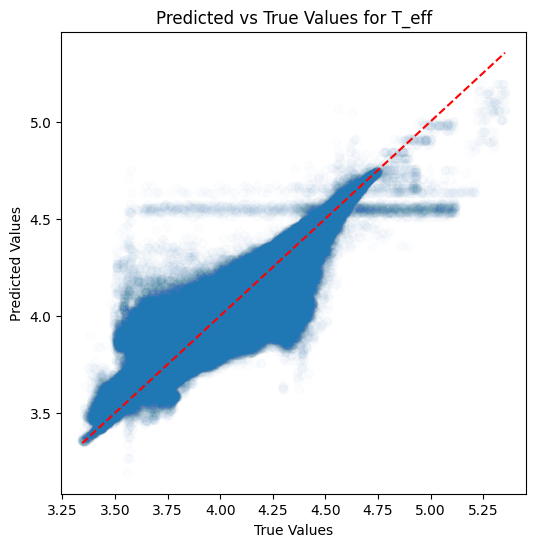

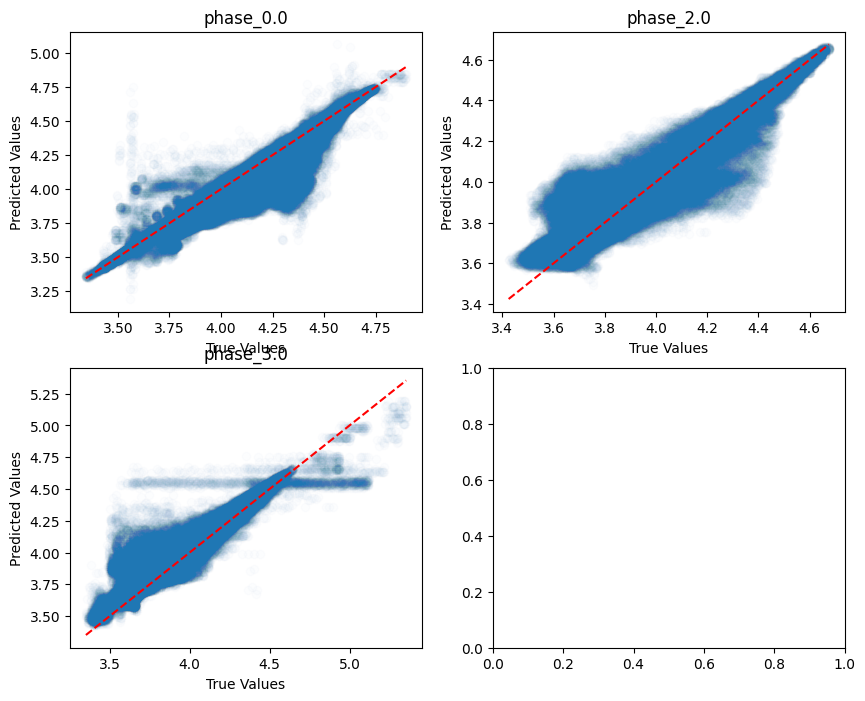

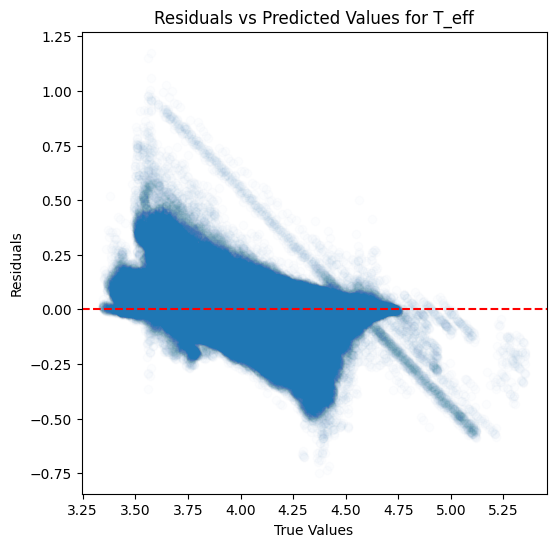

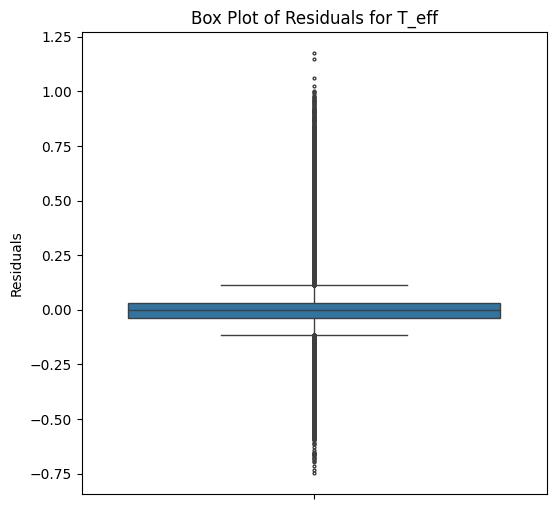

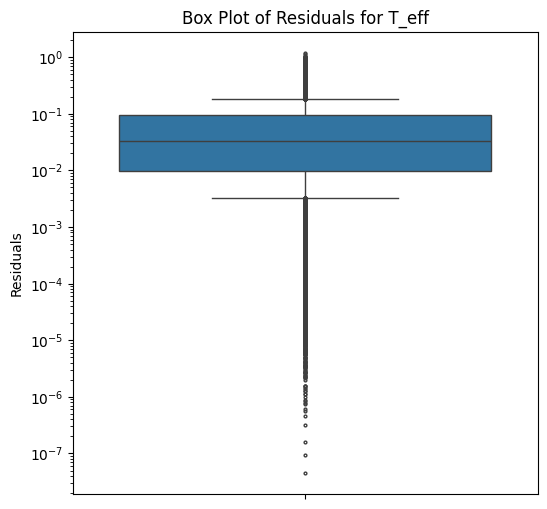

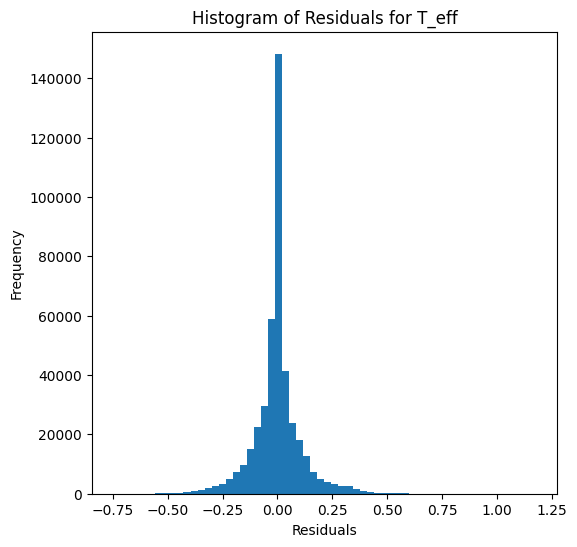

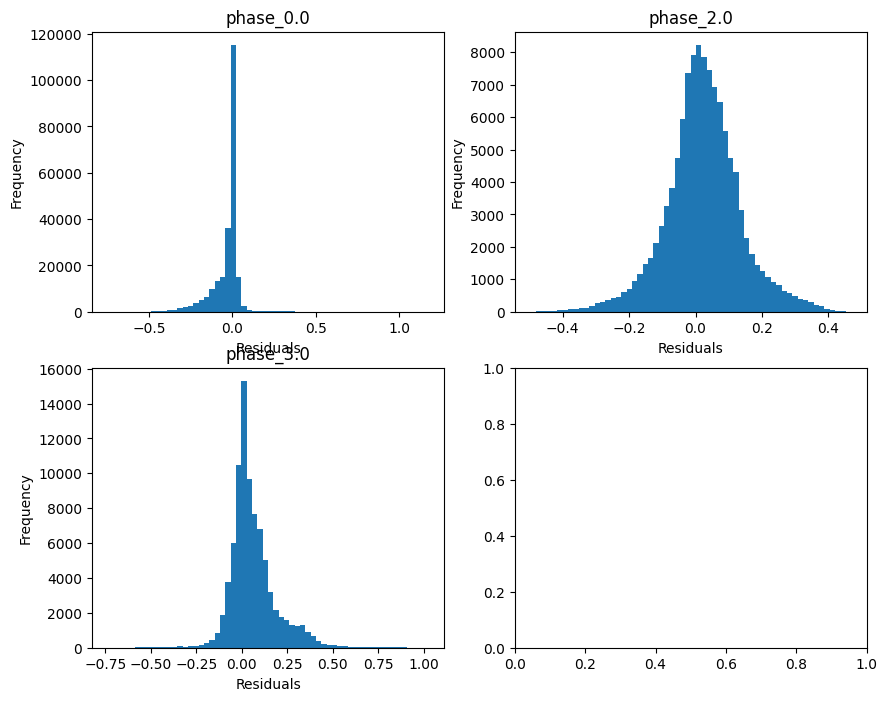

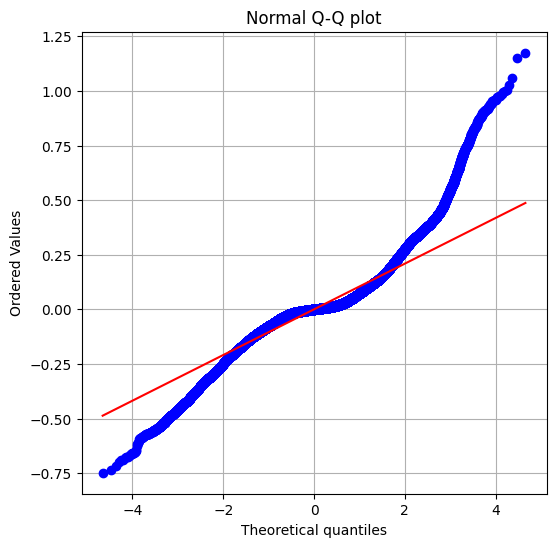

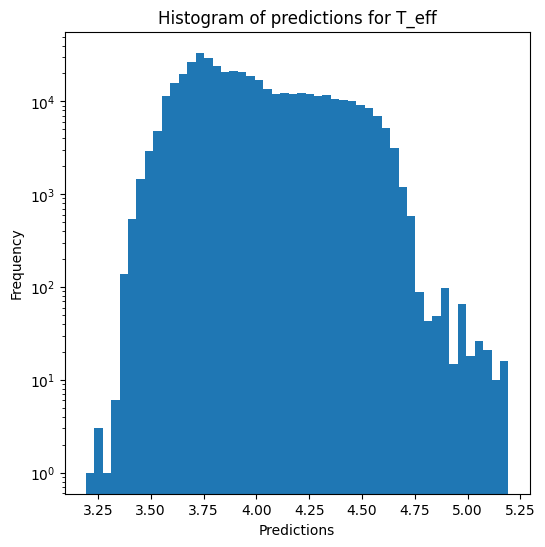

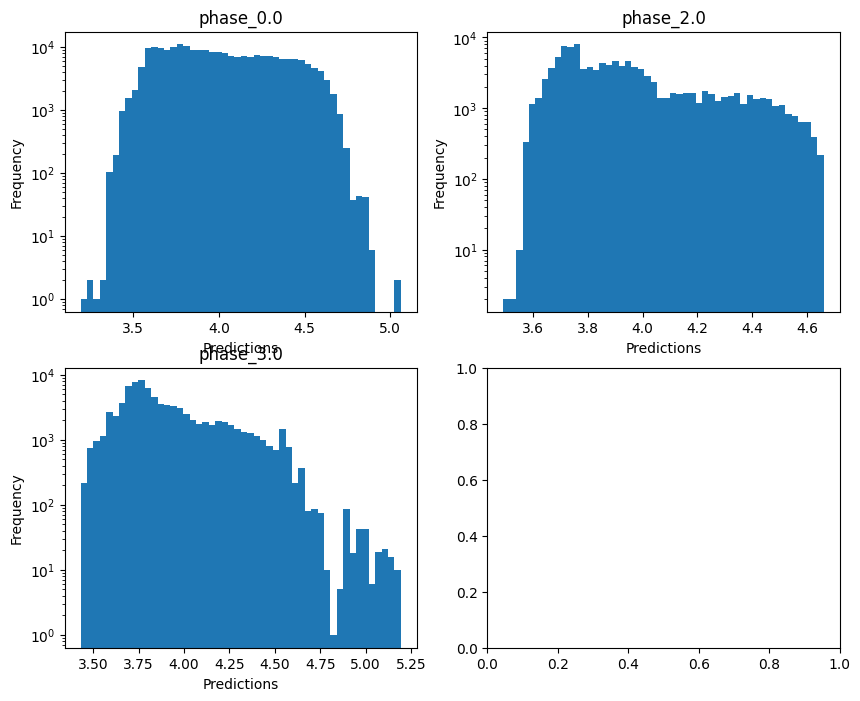


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.37978963321390746
  RMSE :  0.5073124180173654
  MAE :  0.27828616848233817
  MedAE :  0.07925795217291087
  CORR :  0.8305492738060453
  MAX_ER :  4.828943609845293
  Percentiles : 
    75th percentile :  0.35501877256295644
    90th percentile :  0.8744537190637509
    95th percentile :  1.1919725390913483
    99th percentile :  1.7404915853565537

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.3963711882122807
  RMSE :  0.7244418936403836
  MAE :  0.5503120106775171
  MedAE :  0.4246592785386125
  CORR :  0.629640868615065
  MAX_ER :  3.78589123003215
  Percentiles : 
    75th percentile :  0.8025835270260492
    90th percentile :  1.2126739700188442
    95th percentile :  1.4826507941283376
    99th percentile :  2.0593487547528873

log_g results for the phase category with a valu

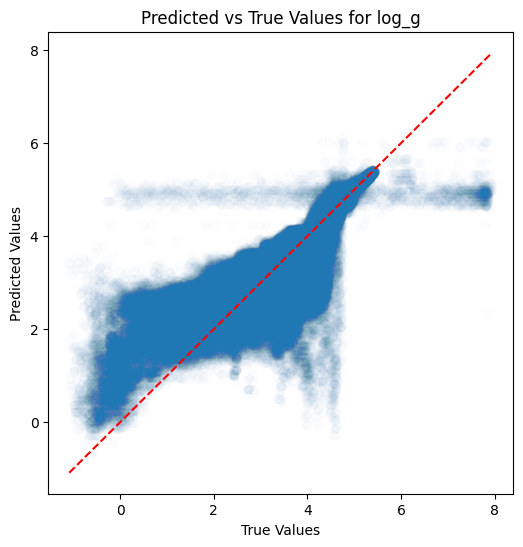

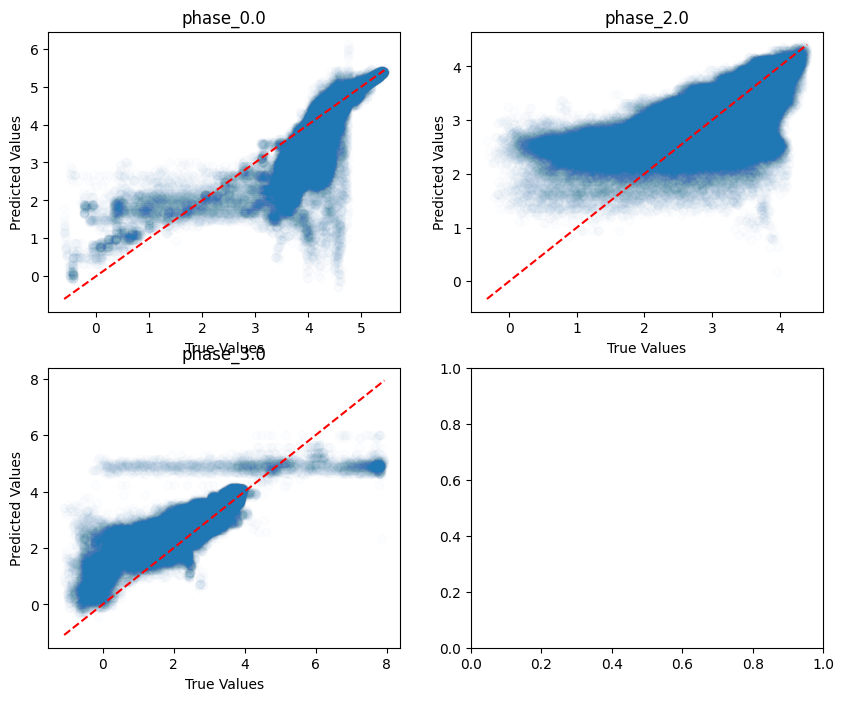

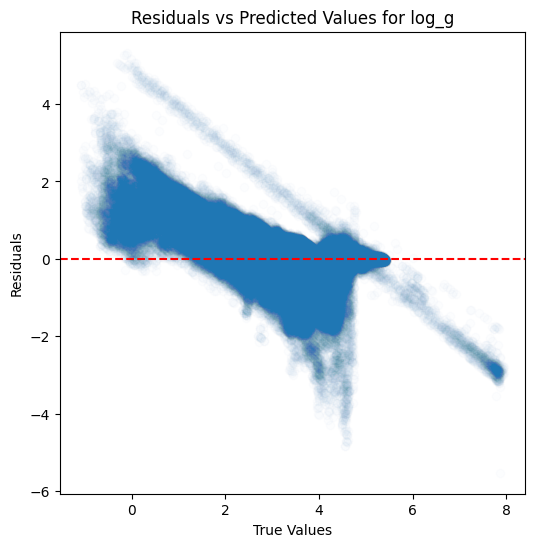

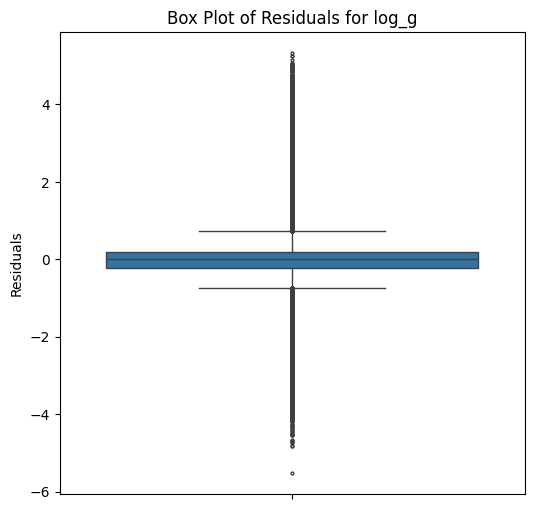

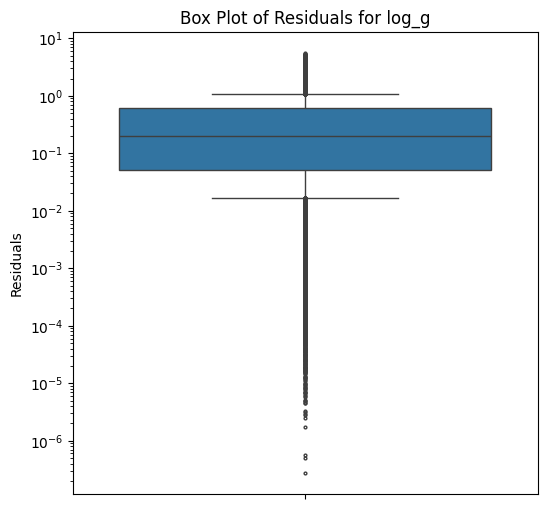

...

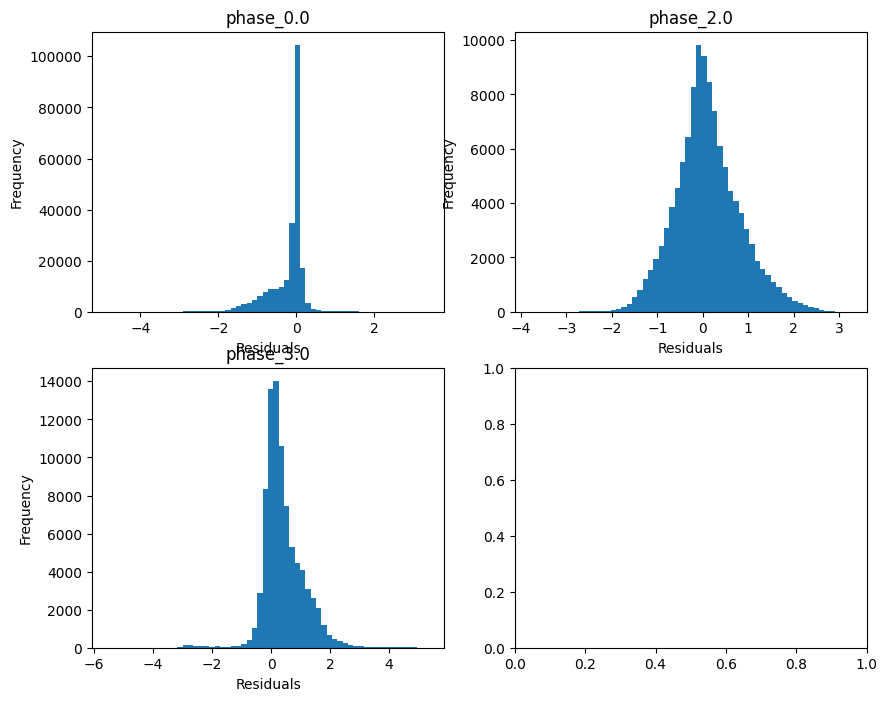

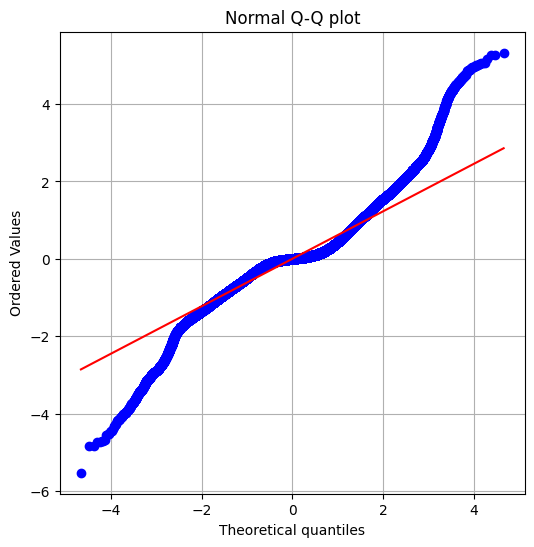

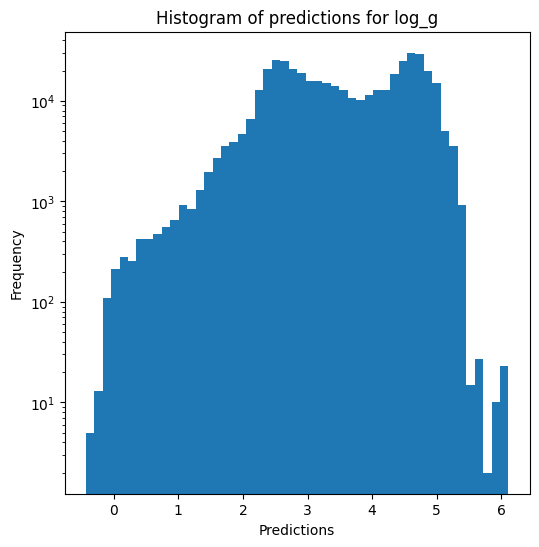

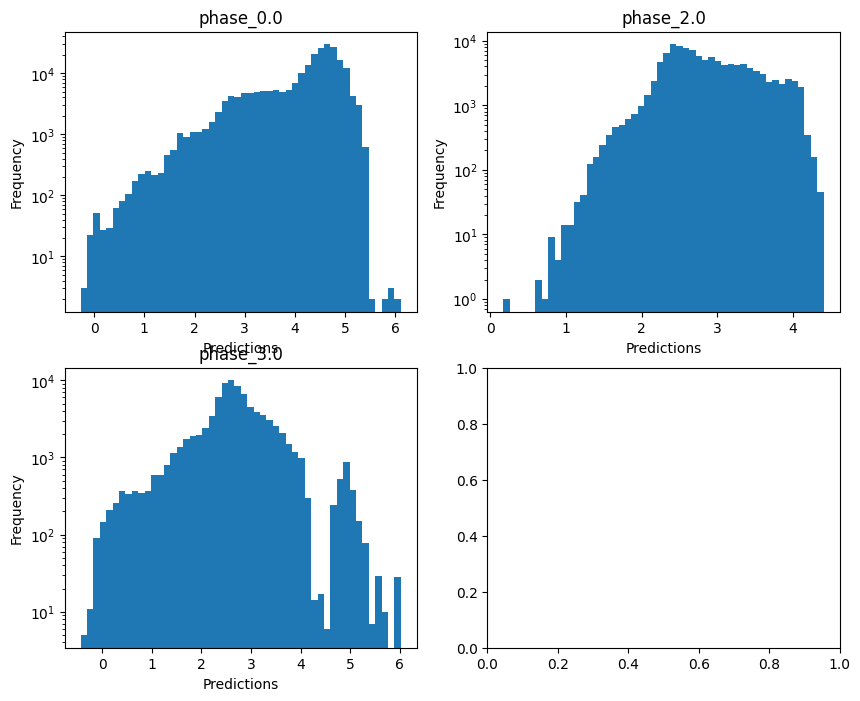

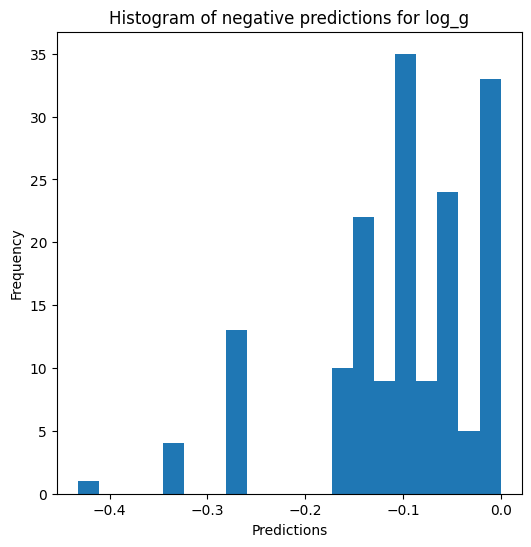


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.7888970317045801
  RMSE :  0.2537243151812916
  MAE :  0.13901990574636192
  MedAE :  0.038377027191825085
  CORR :  0.920928713188847
  MAX_ER :  2.4937048175827505
  Percentiles : 
    75th percentile :  0.17617961162975768
    90th percentile :  0.43850439104385946
    95th percentile :  0.5975423722731701
    99th percentile :  0.8676822382084417

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.3778569388931575
  RMSE :  0.362786680709078
  MAE :  0.275669057355245
  MedAE :  0.2124649200810257
  CORR :  0.6164160642259515
  MAX_ER :  1.8022826222789763
  Percentiles : 
    75th percentile :  0.401567109295257
    90th percentile :  0.6062293557625396
    95th percentile :  0.7429623375173289
    99th percentile :  1.0350106028351662

radius results for the phase category with a v

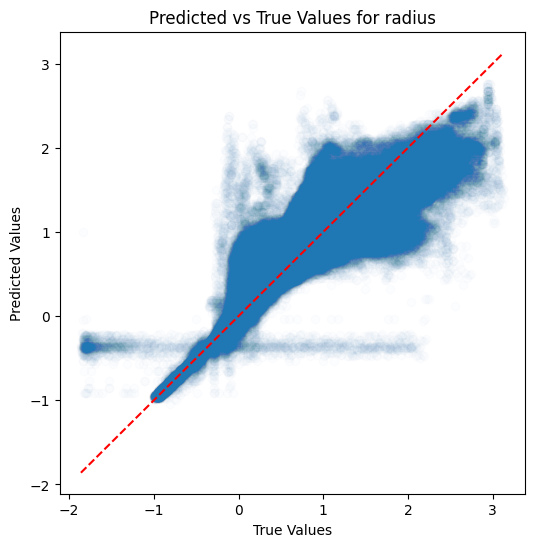

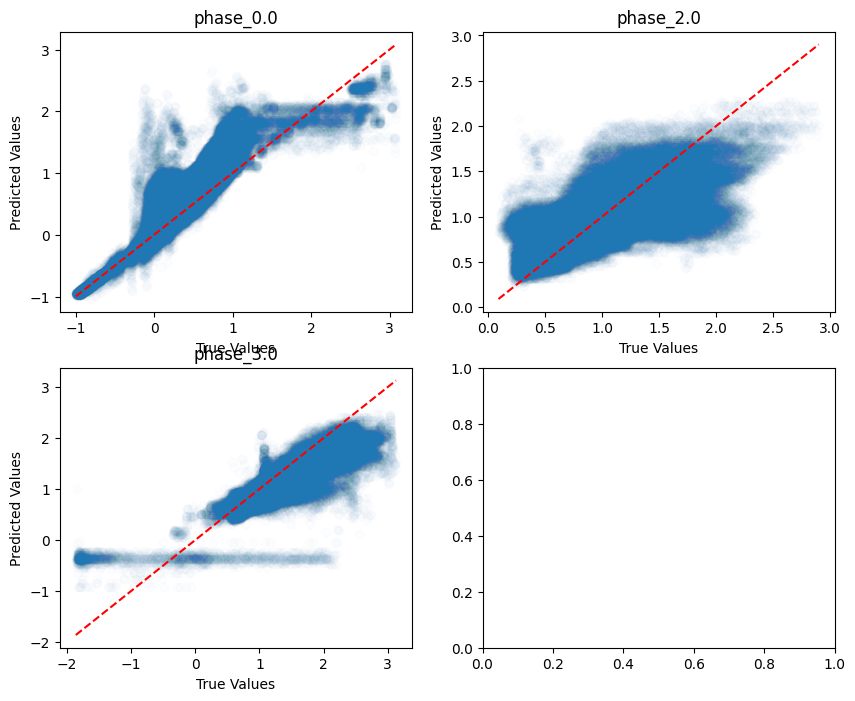

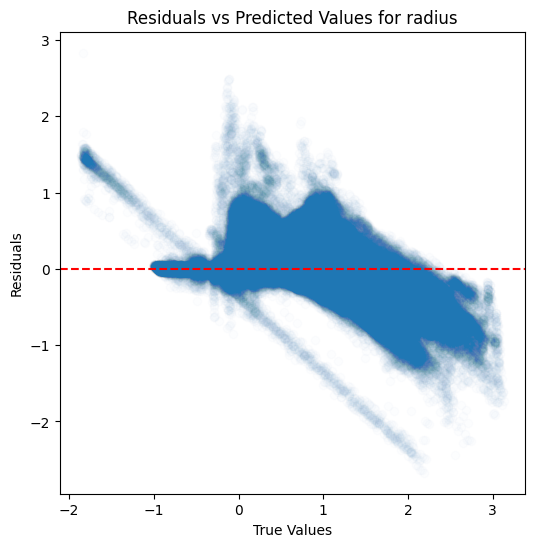

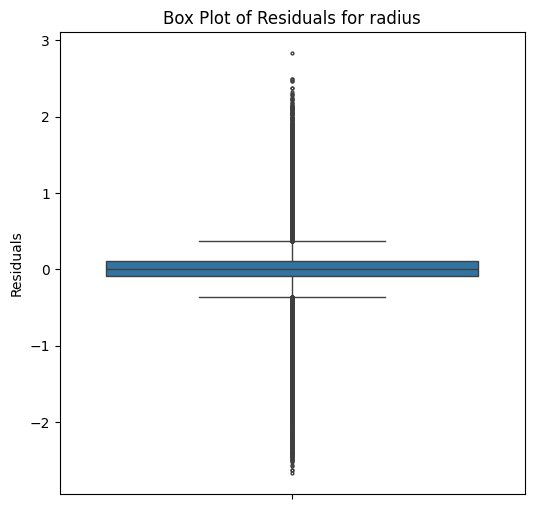

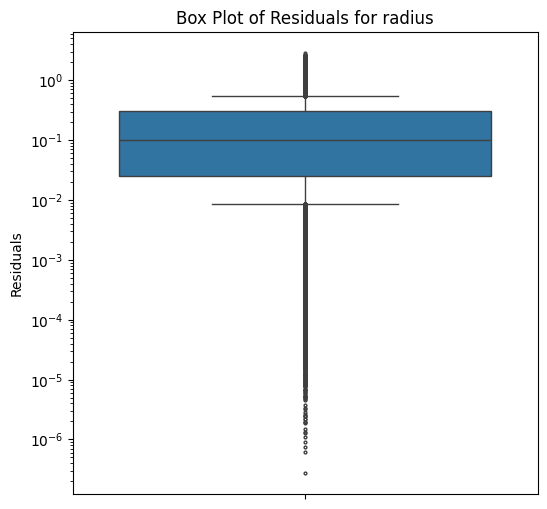

...

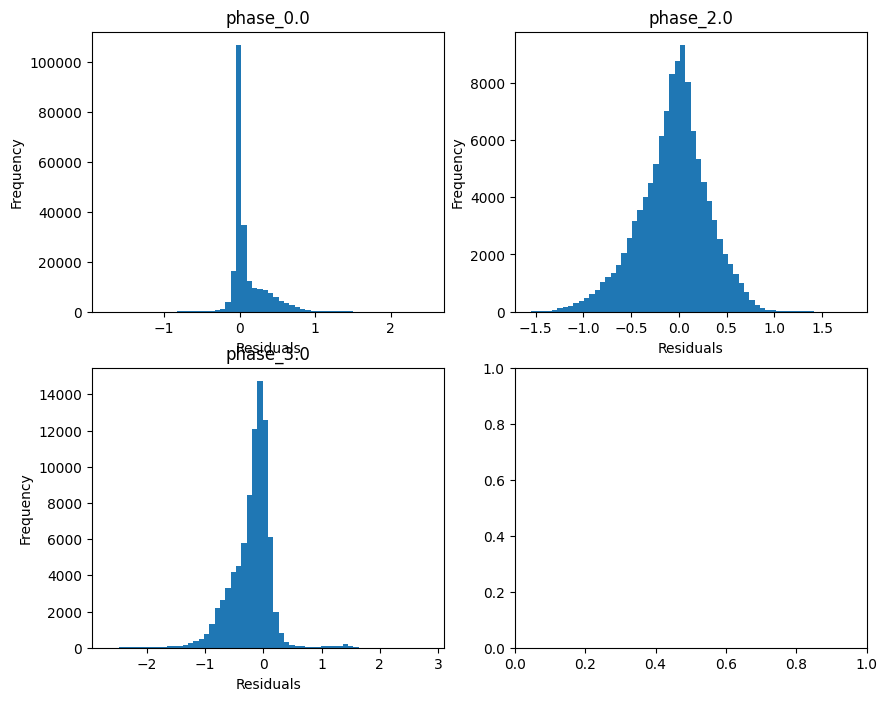

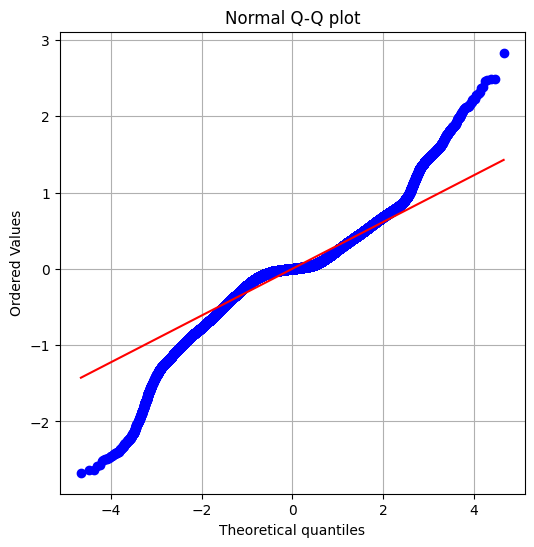

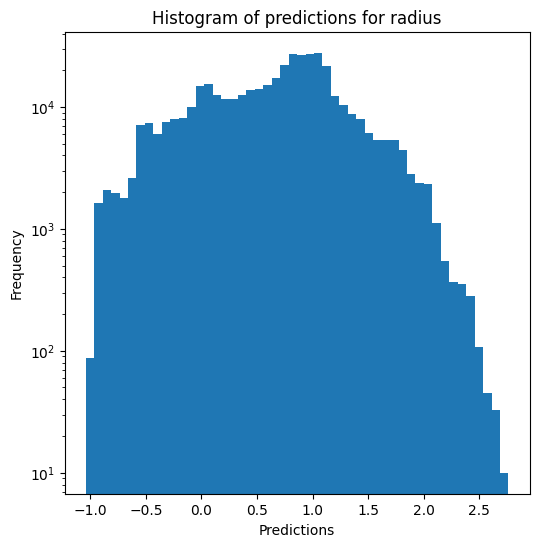

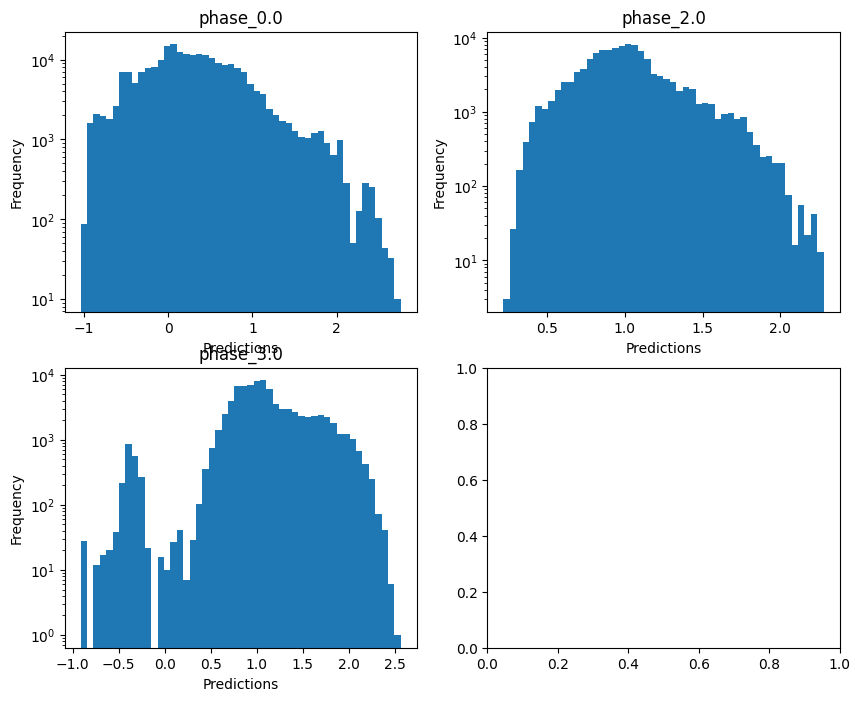

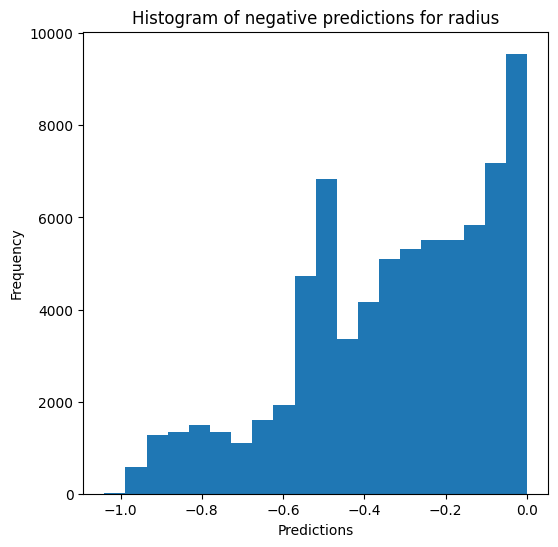

Saving predictions and results...


In [21]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True, n_jobs=5)

### Multi-layer perceptron

In [22]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_30 train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.12487828449359688
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.12129773601551684
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.12590003655536913
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.1215569169851995
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.12321383093009891

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.3446822240585243 - 4.898172986424315
  RVE :  0.8657497971452879
  RMSE :  0.13538735071876748
  MAE :  0.09175800680862461
  MedAE :  0.05845652178957339
  CORR :  0.9309159940406495
  MAX_ER :  0.965177005824331
  Percentiles : 
    75th percentile :  0.10708066892517565
    90th percentile :  0.22903757602437777
    95th percentile :  0.31766817083100124
    99th percentile :  0.4583696229756464

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.6749789254031855
  RVE :  0.7451019125855263
  RMSE :  0.14574848798362047
  MAE :  0.11240994766712722
  MedAE :  0.08883607526235737
  CORR :  0.8634216292064997
  MAX_ER :  0.6904556751511346
  Percentiles : 
    75th percentile :  0.16030655773862468
    90th percentile :  0.24182560397079267
    95th percentile :  0.29760763966828374
    99th percenti

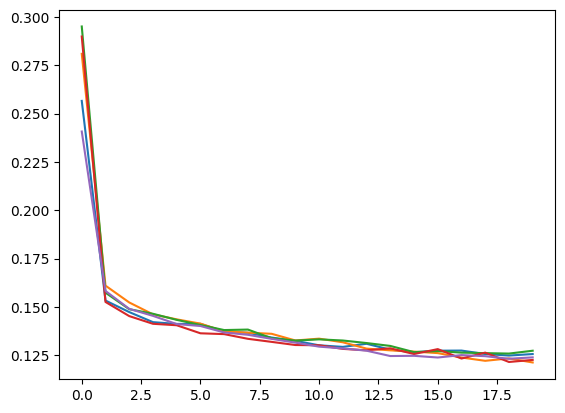

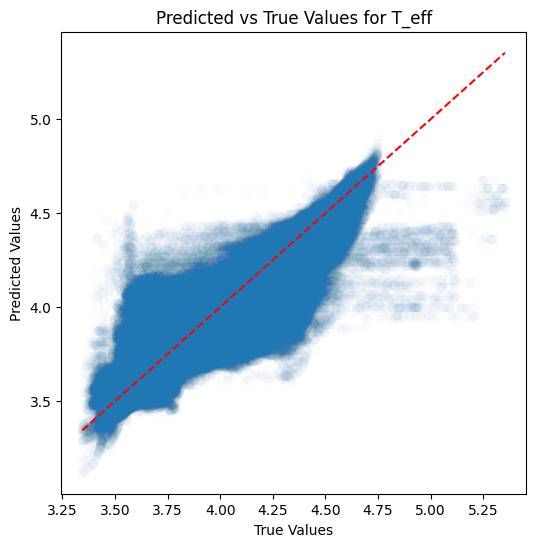

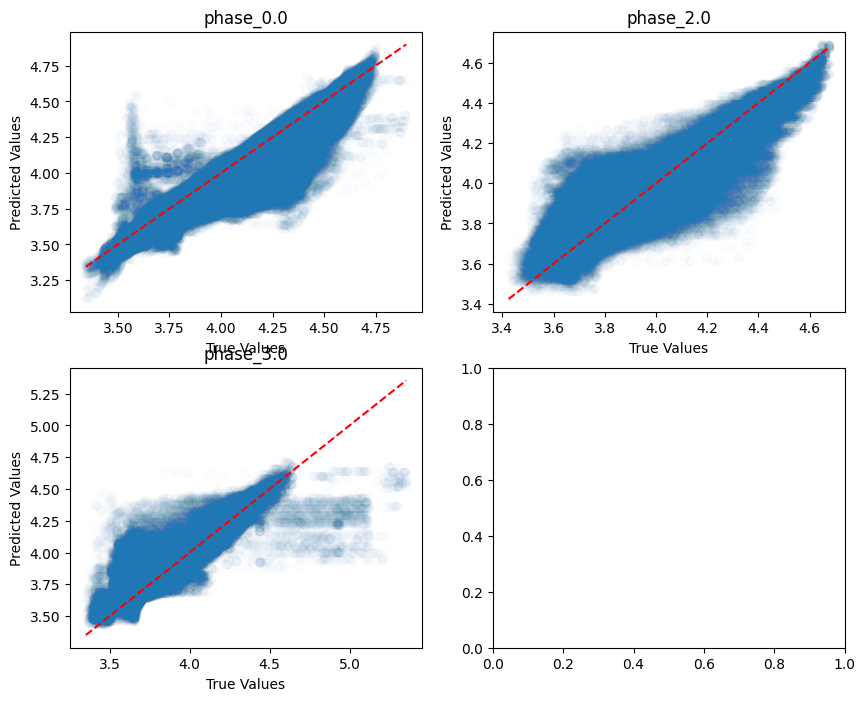

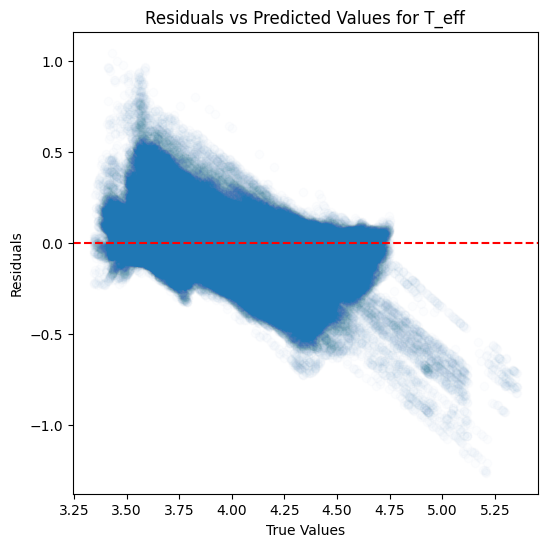

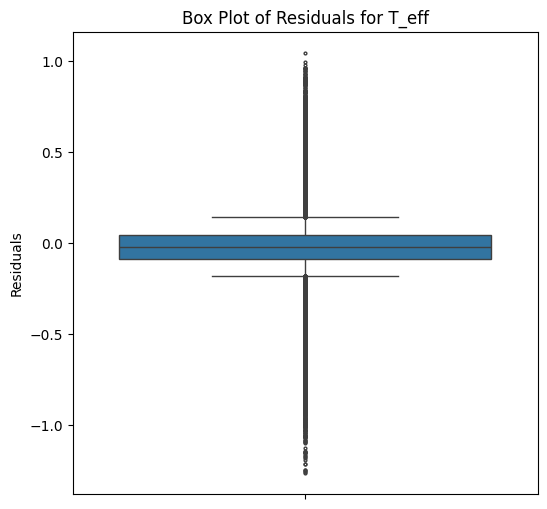

...

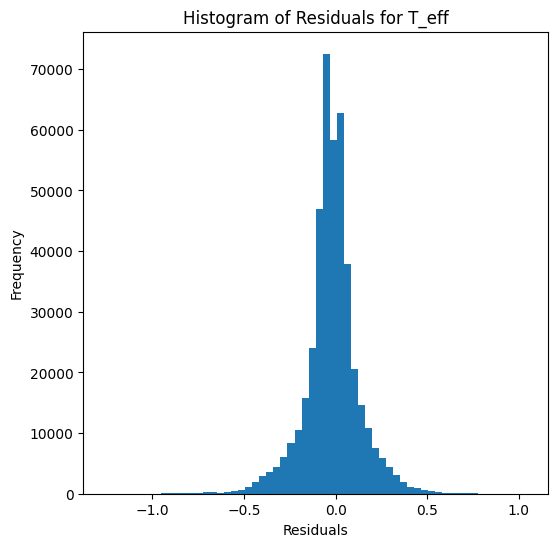

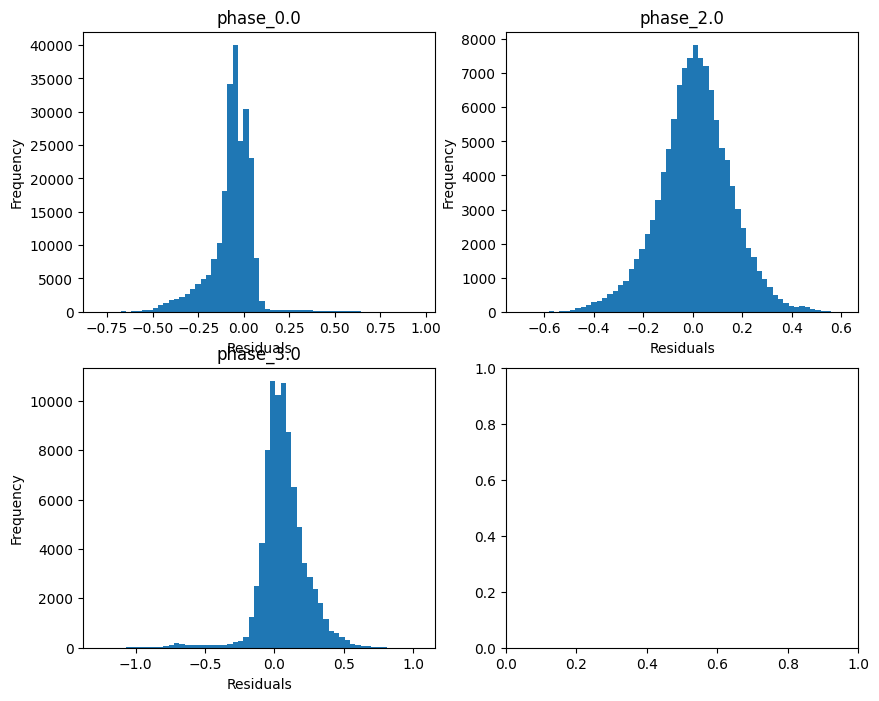

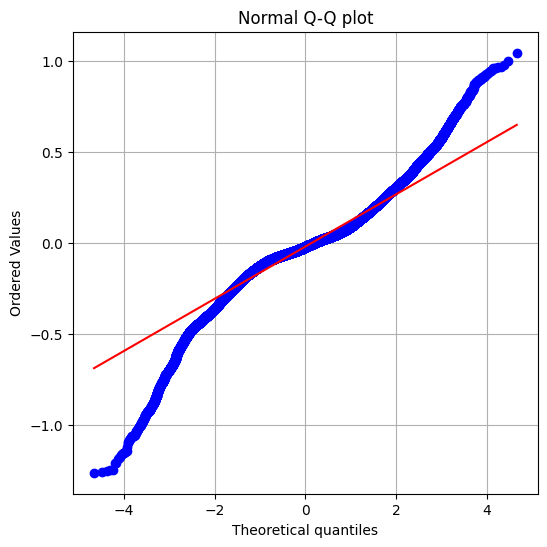

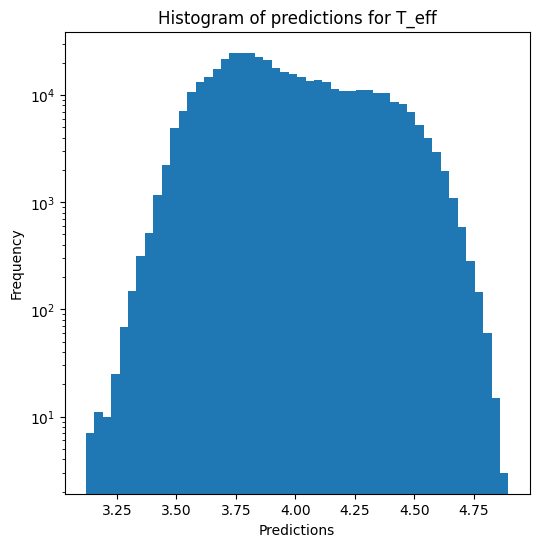

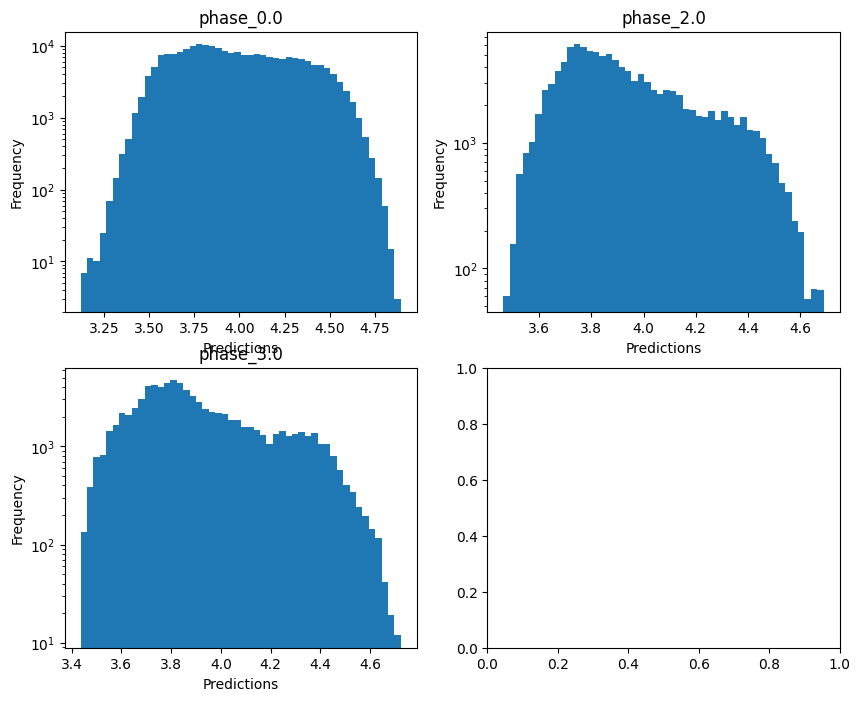

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.15325700529041764
  RMSE :  0.6002224921782666
  MAE :  0.31942245200551306
  MedAE :  0.07384888646006171
  CORR :  0.7798731860239866
  MAX_ER :  3.9675742548129573
  Percentiles : 
    75th percentile :  0.3511865060763929
    90th percentile :  1.1369543339395485
    95th percentile :  1.52692102790859
    99th percentile :  2.0748031326497562

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.4079093481651865
  RVE :  0.10989709181159057
  RMSE :  0.8901811737628363
  MAE :  0.6807727865270975
  MedAE :  0.5274252922383487
  CORR :  0.43359928501465156
  MAX_ER :  3.8063624916295
  Percentiles : 
    75th percentile :  0.9807018436100396
    90th percentile :  1.4801647093131949
    95th percentile :  1.822024088079667
    99th percentile :  2.5412720444501424

log_g results for the phase ca

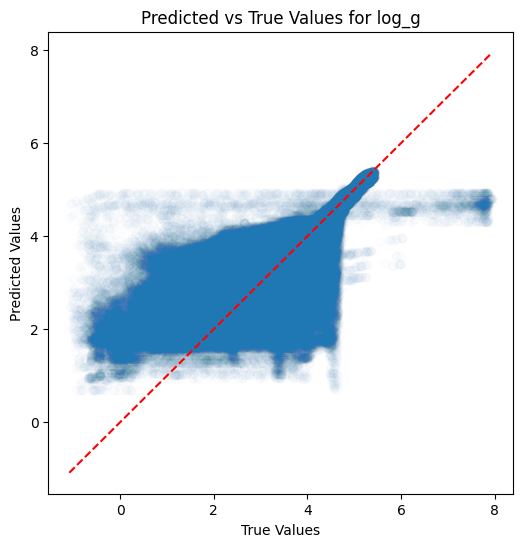

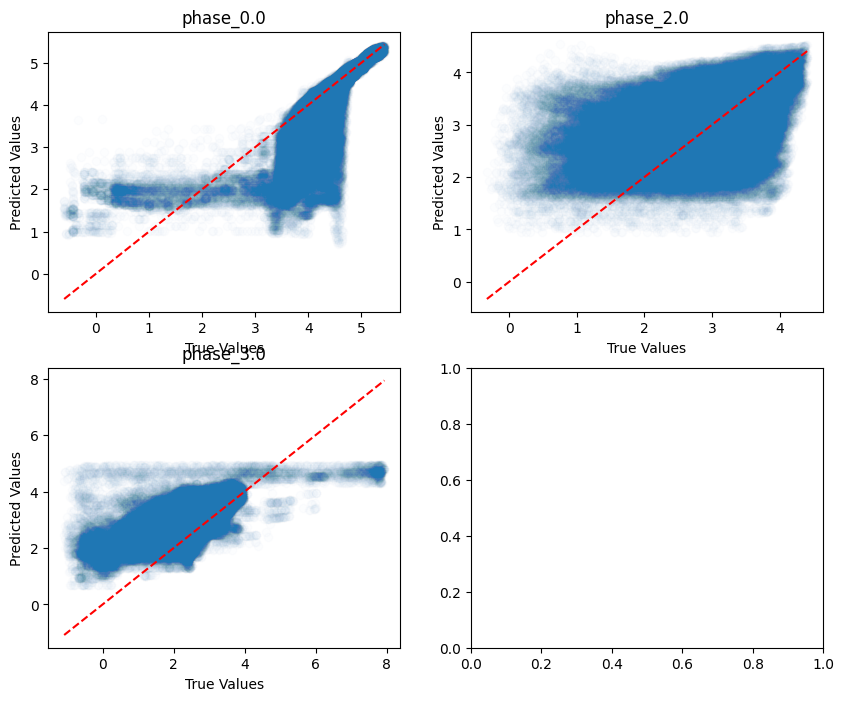

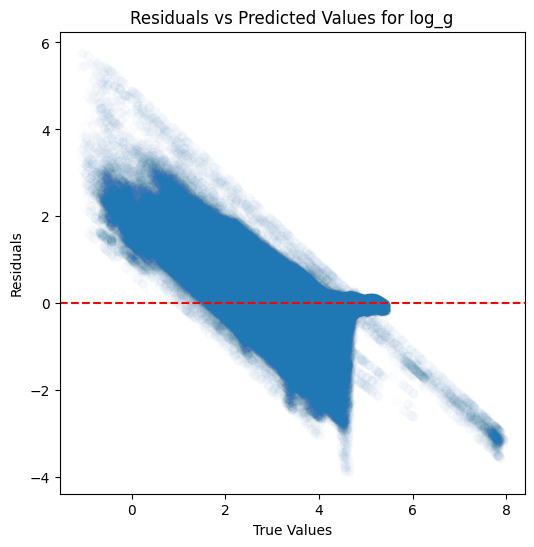

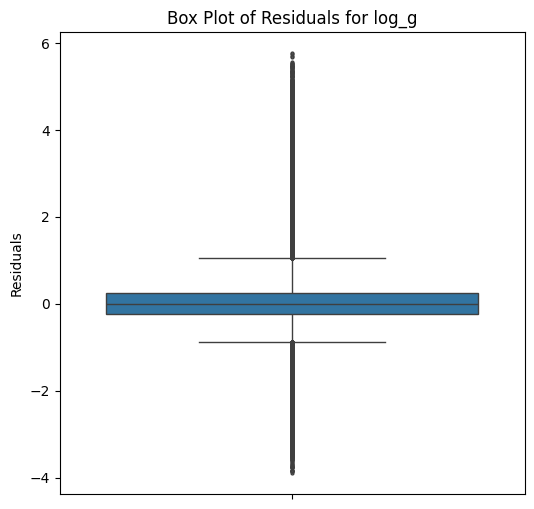

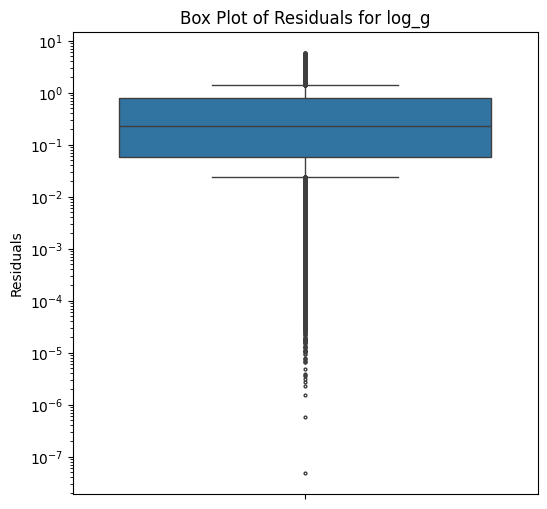

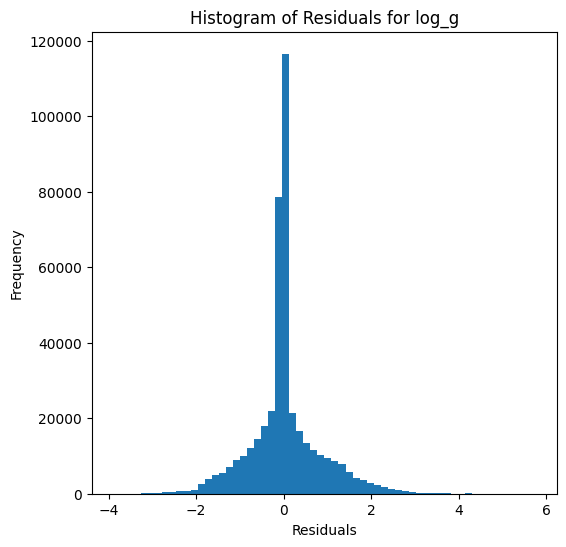

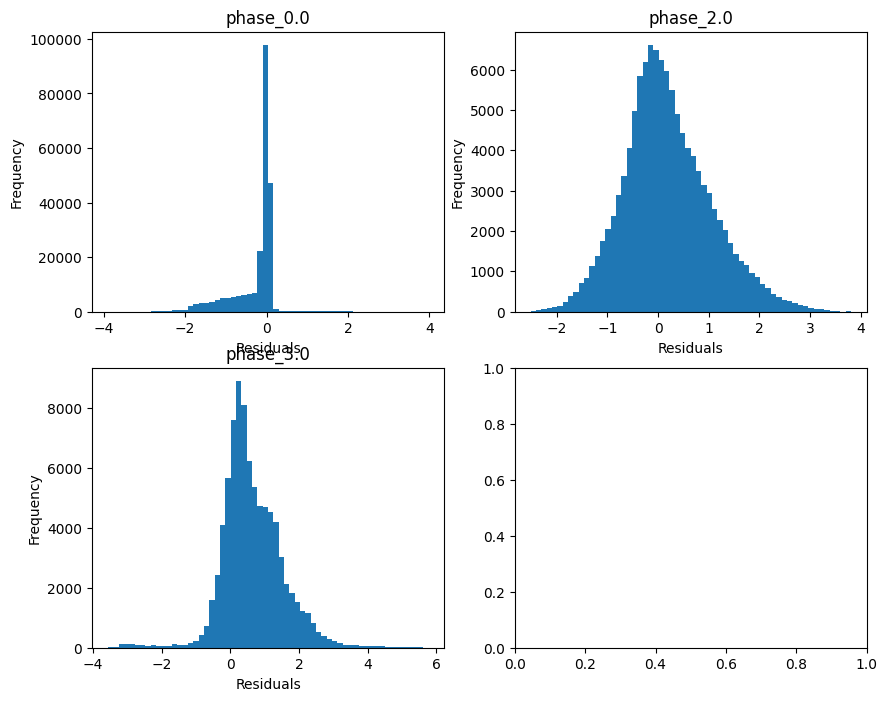

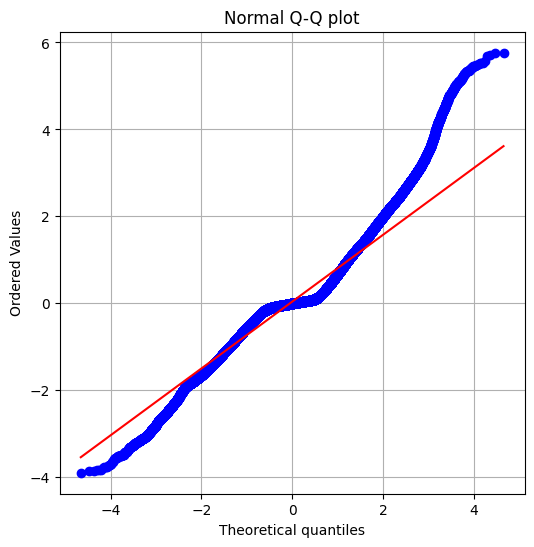

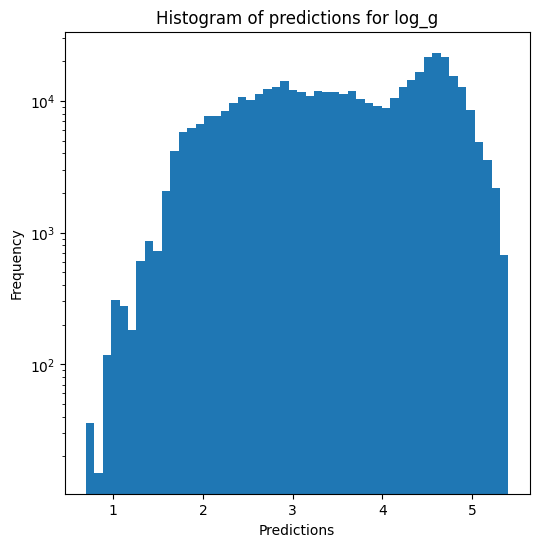

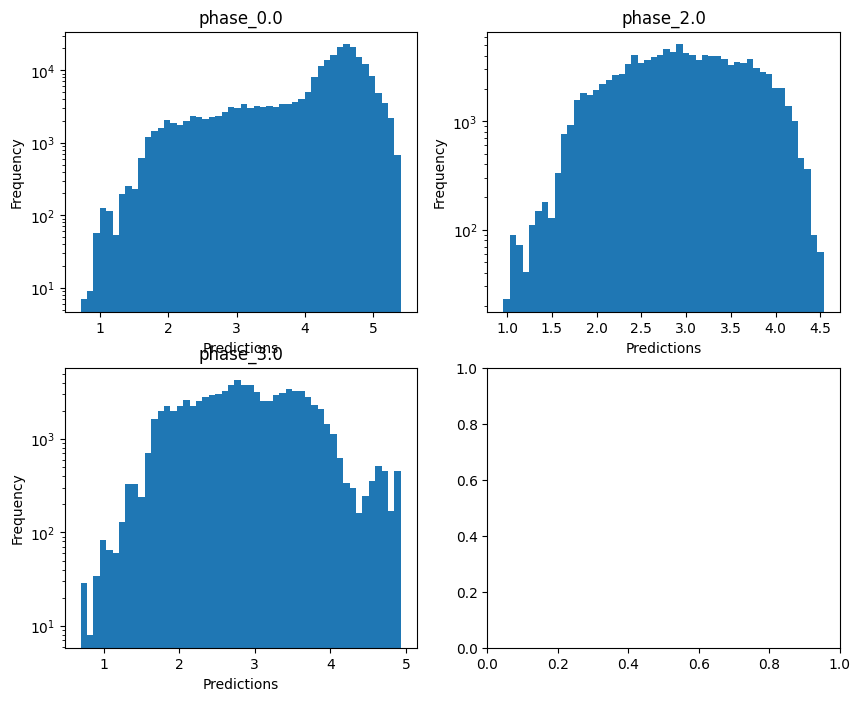


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.7133568954743537
  RMSE :  0.29411770074980936
  MAE :  0.15541597516649233
  MedAE :  0.03674167278115534
  CORR :  0.8977416299088651
  MAX_ER :  2.0294401204673536
  Percentiles : 
    75th percentile :  0.15978673514997482
    90th percentile :  0.554213729975538
    95th percentile :  0.7508665730214855
    99th percentile :  1.030097484233042

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.08882655997166666
  RMSE :  0.4478451273420637
  MAE :  0.3408887762339158
  MedAE :  0.2622700478502434
  CORR :  0.47710064049788414
  MAX_ER :  1.9544723687259742
  Percentiles : 
    75th percentile :  0.4907543562881227
    90th percentile :  0.743668349962479
    95th percentile :  0.9168659344324629
    99th percentile :  1.2878669766450845

radius results for the phase category with a

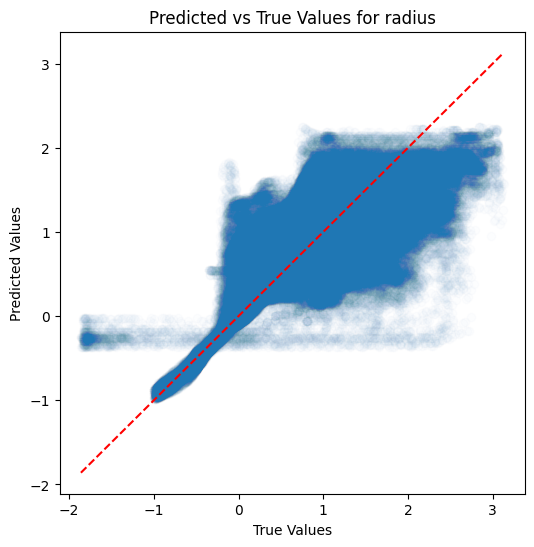

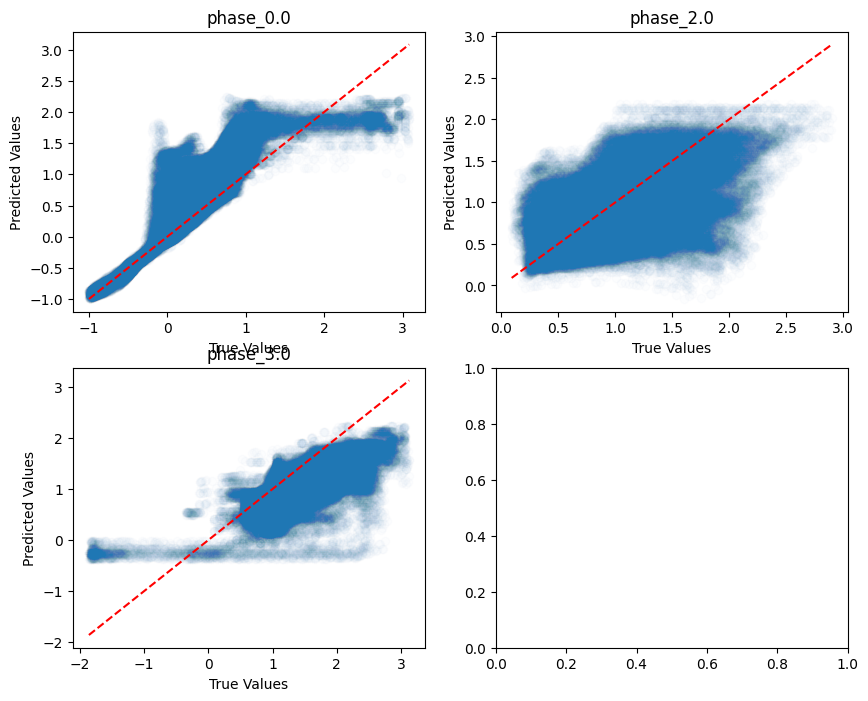

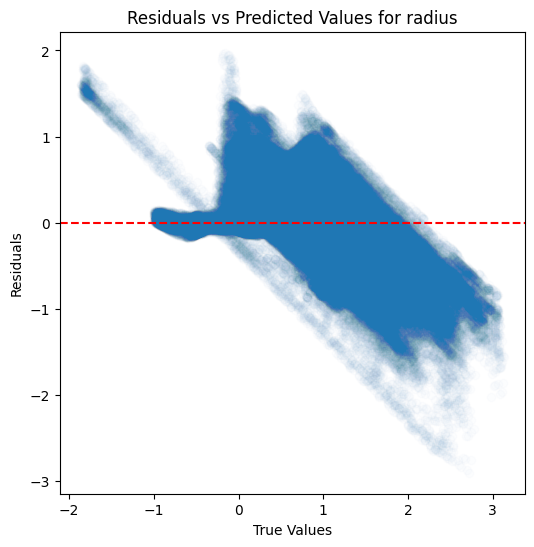

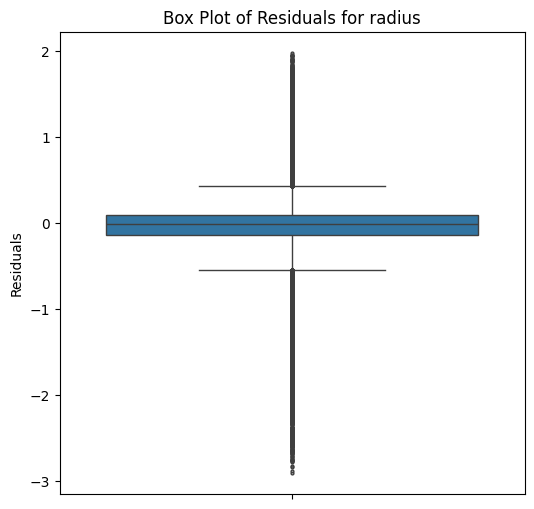

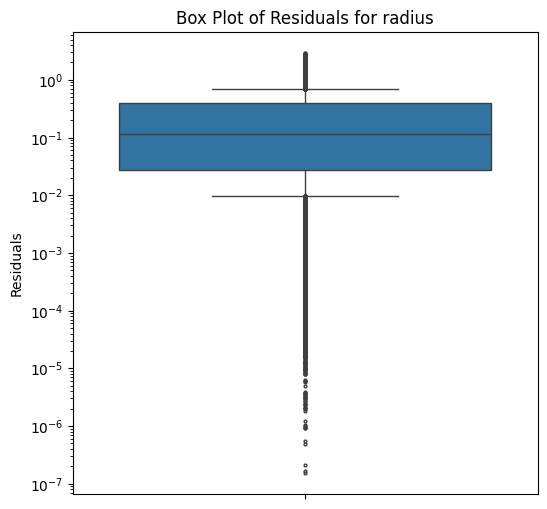

...

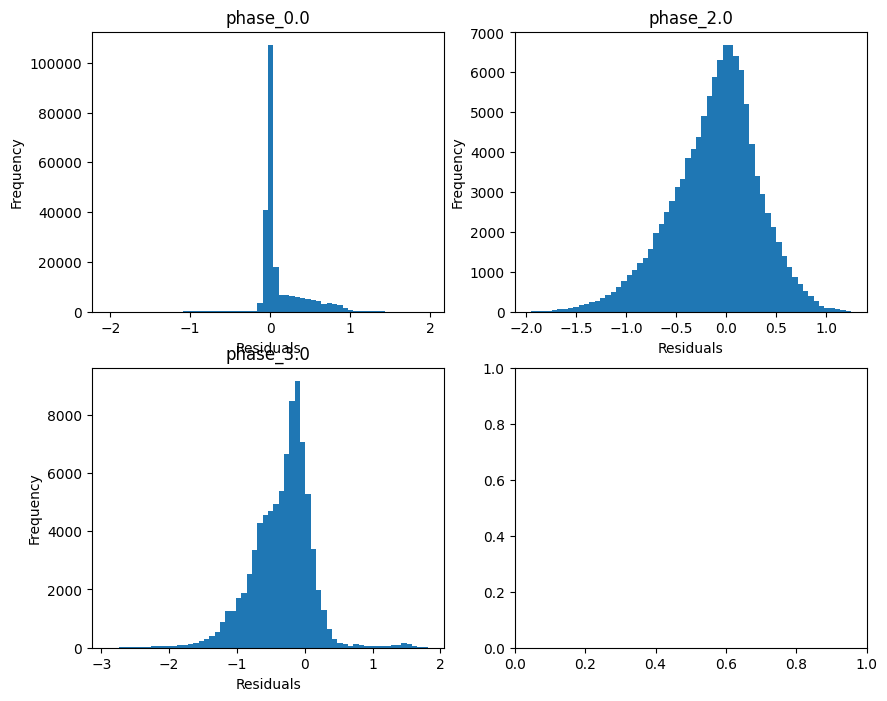

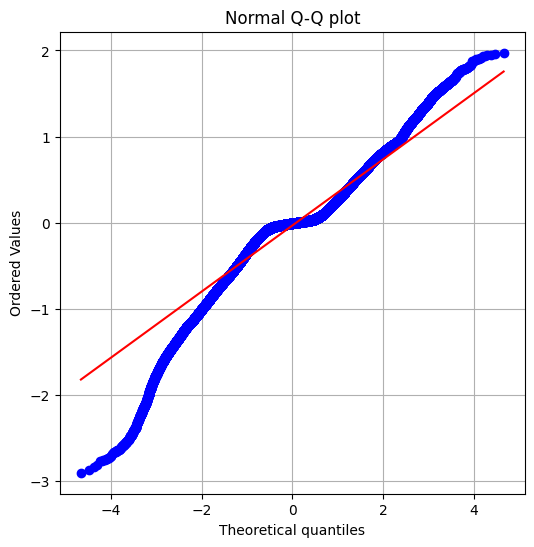

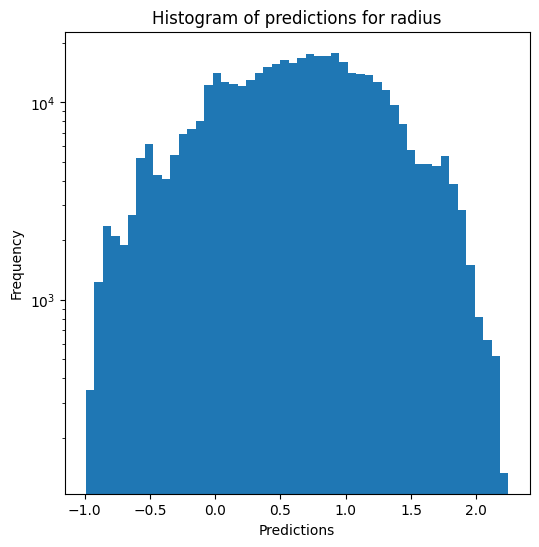

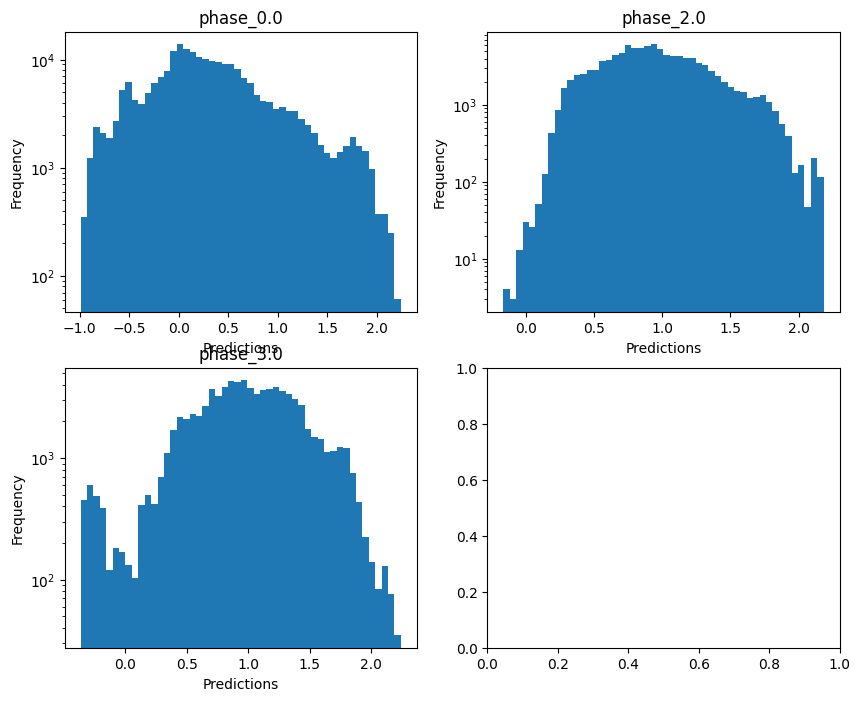

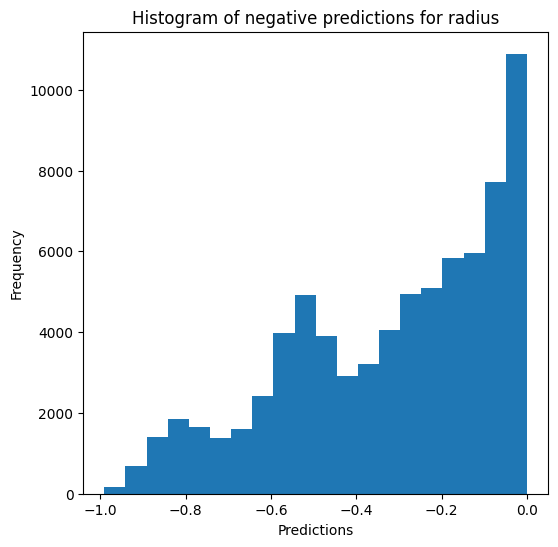

Saving predictions and results...


In [23]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=True, use_preds=False, save=True, show=True, 
                                     hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)